# Description
This is a streamlined approach using scikit-learn to perform the same task as the previous script

In [202]:
%pip install xgboost
%pip install pandas
%pip install numpy
%pip install matplotlib
%pip install scikit-learn
%pip install tensorflow
%pip install rich


   ---------------------------------------- 0.0/99.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/99.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/99.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/99.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/99.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/99.8 MB 187.9 kB/s eta 0:08:51
   ---------------------------------------- 0.1/99.8 MB 297.7 kB/s eta 0:05:35
   ---------------------------------------- 0.1/99.8 MB 481.4 kB/s eta 0:03:27
   ---------------------------------------- 0.3/99.8 MB 947.5 kB/s eta 0:01:45
   ---------------------------------------- 0.4/99.8 MB 1.2 MB/s eta 0:01:27
   ---------------------------------------- 0.4/99.8 MB 1.1 MB/s eta 0:01:27
   ---------------------------------------- 0.6/99.8 MB 1.3 MB/s eta 0:01:18
   ---------------------------------------- 0.7/99.8 MB 1.5 MB/s eta 0:01:08
   -----------------------


[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: pandas in c:\users\benja\appdata\roaming\python\python312\site-packages (2.1.4)




[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from rich import print



# Utility Functions

In [68]:
import matplotlib.pyplot as plt
from rich import print
from rich.console import Console
from rich.panel import Panel

def color(text, color):
    return f"[{color}]{text}[/]"

def white(text):
    return color(text, "bright_white")

def green(text):
    return color(text, "bright_green")

def yellow(text):
    return color(text, "bright_yellow")

def red(text):
    return color(text, "bright_red")

def analyze_features(df, feature=None):
    """
    Analyzes features of a pandas dataframe.

    Parameters:
    - df: pandas.DataFrame

    Prints:
    - Feature name
    - Percentage of NaN or None values
    - Value distribution summary (for numeric features)
    - Unique values (for categorical features with fewer than 10 unique values)
    """
    
    from rich.columns import Columns
    from rich.console import Console
    from textwrap import fill

    console = Console()
    panels = []

    column_width = 55  # Set the width of each column

    count = df.shape[0]
    text = ''
    if feature in df.columns:
        df = df[feature]
    
    for column in df.columns:
        unique_values = df[column].unique()
        unique_count = len(unique_values)

        # NaN or None percentages
        nan_count = df[column].isnull().sum()
        nan_percentage = df[column].isnull().mean() * 100
        
        text = f"{yellow('NaN/None values:')} {green(f'{nan_percentage:.2f}% | {nan_count} of {count}')}"
        text += f"  {yellow('Type:')} {green(df[column].dtype.name)}\n"

        # If numeric, show distribution summary
        text += f"{yellow('Unique values:')} {green(unique_count)}\n"

        if len(unique_values) <= 50:
            text += white('"' + '", "'.join(unique_values.astype(str)) + '"\n')
        
        if pd.api.types.is_numeric_dtype(df[column]):
            text += yellow('Value distribution summary:\n')
            for stat, value in df[column].describe().to_frame().T.iloc[0].items():
                text += f"{yellow(f'{stat}:')} {green(f'{value:.2f}\t')}"
        
        panels.append(Panel(text, title=f'Feature: {column}', width=column_width, border_style="bright_cyan"))
    
    # Create a Columns object with the panels, specifying 2 columns
    columns = Columns(panels, expand=True)
    console.print(columns)

def plot_data(X: pd.DataFrame, Y: pd.DataFrame) -> None:
    
    for column in X.columns:

        if X[column].std() != 0:
            # Calculate Pearson correlation
            r = X[column].corr(Y)
            print(f"Pearson Correlation {yellow(column)}: {green(f'{r:.2f}')}")
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

        # Scatter plot
        ax1.scatter(X[column], Y)
        ax1.set_xlabel(column)
        ax1.set_ylabel(Y.name)
        ax1.set_title(f"Scatter plot of {column} vs {Y.name}")

        # Histogram
        ax2.hist(X[column])
        ax2.set_xlabel(column)
        ax2.set_ylabel("Frequency")
        ax2.set_title(f"Histogram of {column}")

        plt.tight_layout()
        plt.show()



# Data Analysis

### Load data

In [41]:
def load_data() -> pd.DataFrame:
    """
    Load the dataset from a CSV file.
    """
    df = pd.read_csv('./data/train.csv')
    return df


### Initial Analysis

View the data types, distributions, and number of NaN/None values in the rows. 
This will help determine how to normalize and where one shot encoding may be helpful

In [42]:
if __name__ == "__main__":
    df = load_data()
    analyze_features(df)


╭──────────────────── Feature: Id ────────────────────╮    ╭──────────────── Feature: MSSubClass ────────────────╮ 
│ NaN/None values: 0.00% | 0 of 1460  Type: int64     │    │ NaN/None values: 0.00% | 0 of 1460  Type: int64     │ 
│ Unique values: 1460                                 │    │ Unique values: 15                                   │ 
│ Value distribution summary:                         │    │ "60", "20", "70", "50", "190", "45", "90", "120",   │ 
│ count: 1460.00  mean: 730.50    std: 421.61         │    │ "30", "85", "80", "160", "75", "180", "40"          │ 
│ min: 1.00       25%: 365.75     50%: 730.50         │    │ Value distribution summary:                         │ 
│ 75%: 1095.25    max: 1460.00                        │    │ count: 1460.00  mean: 56.90     std: 42.30          │ 
╰─────────────────────────────────────────────────────╯    │ min: 20.00      25%: 20.00      50%: 50.00          │ 
                                                           │ 75%: 70.00      max: 190.00                         │ 
                                                           ╰─────────────────────────────────────────────────────╯ 
╭───────────────── Feature: MSZoning ─────────────────╮    ╭─────────────── Feature: LotFrontage ────────────────╮ 
│ NaN/None values: 0.00% | 0 of 1460  Type: object    │    │ NaN/None values: 17.74% | 259 of 1460  Type:        │ 
│ Unique values: 5                                    │    │ float64                                             │ 
│ "RL", "RM", "C (all)", "FV", "RH"                   │    │ Unique values: 111                                  │ 
│                                                     │    │ Value distribution summary:                         │ 
╰─────────────────────────────────────────────────────╯    │ count: 1201.00  mean: 70.05     std: 24.28          │ 
                                                           │ min: 21.00      25%: 59.00      50%: 69.00          │ 
                                                           │ 75%: 80.00      max: 313.00                         │ 
                                                           ╰─────────────────────────────────────────────────────╯ 
╭───────────────── Feature: LotArea ──────────────────╮    ╭────────────────── Feature: Street ──────────────────╮ 
│ NaN/None values: 0.00% | 0 of 1460  Type: int64     │    │ NaN/None values: 0.00% | 0 of 1460  Type: object    │ 
│ Unique values: 1073                                 │    │ Unique values: 2                                    │ 
│ Value distribution summary:                         │    │ "Pave", "Grvl"                                      │ 
│ count: 1460.00  mean: 10516.83  std: 9981.26        │    │                                                     │ 
│ min: 1300.00    25%: 7553.50    50%: 9478.50        │    ╰─────────────────────────────────────────────────────╯ 
│ 75%: 11601.50   max: 215245.00                      │                                                            
╰─────────────────────────────────────────────────────╯                                                            
╭────────────────── Feature: Alley ───────────────────╮    ╭───────────────── Feature: LotShape ─────────────────╮ 
│ NaN/None values: 93.77% | 1369 of 1460  Type:       │    │ NaN/None values: 0.00% | 0 of 1460  Type: object    │ 
│ object                                              │    │ Unique values: 4                                    │ 
│ Unique values: 3                                    │    │ "Reg", "IR1", "IR2", "IR3"                          │ 
│ "nan", "Grvl", "Pave"                               │    │                                                     │ 
│                                                     │    ╰─────────────────────────────────────────────────────╯ 
╰─────────────────────────────────────────────────────╯                                                            
╭─────────────── Feature: LandContour ────────────────╮ 

### Imputing Feature Values
* Identify features that have missing values. Remove those with a high percentage and impute those with a lower percentage
* Analyze the *impactful features* of each feature requiring imputation using *"Feature Importance using Tree-based"* Models
* impute based on Features Identified

### Clean / Transform Data

Based on the analysis from the prior step, we can determine that there are a number of columns that won't contribute to the model because of a high number of missing values.

We can also see that there are features with discrete string values that can be converted numeric. Converting these allows us to visualize the relationship of the feature to the target.

In [74]:
def temp_map_categorical(source: pd.DataFrame) -> pd.DataFrame:

    # map categorised data to numerical - these are features with string values
    categorical_features = source.select_dtypes(include=['object']).columns
    for feature in categorical_features:
        mapping_dict = {value: index for index, value in enumerate(source[feature].unique())}
        source[feature] = source[feature].map(mapping_dict)
        
    return source

def transform_outliers(source: pd.DataFrame, feature: str, use_mean: bool = True, threshold: float = 2) -> pd.DataFrame:

    # Assume df is your DataFrame and 'column' is the column you want to process
    std_dev = source[feature].std()
    
    base_val = 0.0    
    if use_mean:
        base_val = source[feature].mean()
    else:
        base_val = source[feature].median()
        
    lower_bound = base_val - threshold * std_dev
    upper_bound = base_val + threshold * std_dev

    # Replace values that fall outside of 2 standard deviations with the mean
    if(source[feature].dtype == 'float64'): 
        source[feature] = source[feature].apply(lambda x: max(min(x, upper_bound), lower_bound))
    elif(source[feature].dtype == 'int64'):
        source[feature] = source[feature].apply(lambda x: max(min(x, upper_bound), lower_bound)).astype(int)

    return source

def normalize_outliers(source: pd.DataFrame, use_mean: bool = True, threshold: float = 2) -> pd.DataFrame:

    for column in source.columns:
        if source[column].dtype == 'float64' or source[column].dtype == 'int64':
            source = transform_outliers(source, column, use_mean, threshold)

    return source


### Plot the cleaned data

╭──────────────────── Feature: Id ────────────────────╮    ╭──────────────── Feature: MSSubClass ────────────────╮ 
│ NaN/None values: 0.00% | 0 of 1460  Type: int32     │    │ NaN/None values: 0.00% | 0 of 1460  Type: int32     │ 
│ Unique values: 1460                                 │    │ Unique values: 13                                   │ 
│ Value distribution summary:                         │    │ "60", "20", "70", "50", "141", "45", "90", "120",   │ 
│ count: 1460.00  mean: 730.50    std: 421.61         │    │ "30", "85", "80", "75", "40"                        │ 
│ min: 1.00       25%: 365.75     50%: 730.50         │    │ Value distribution summary:                         │ 
│ 75%: 1095.25    max: 1460.00                        │    │ count: 1460.00  mean: 54.80     std: 36.84          │ 
╰─────────────────────────────────────────────────────╯    │ min: 20.00      25%: 20.00      50%: 50.00          │ 
                                                           │ 75%: 70.00      max: 141.00                         │ 
                                                           ╰─────────────────────────────────────────────────────╯ 
╭───────────────── Feature: MSZoning ─────────────────╮    ╭─────────────── Feature: LotFrontage ────────────────╮ 
│ NaN/None values: 0.00% | 0 of 1460  Type: int32     │    │ NaN/None values: 17.74% | 259 of 1460  Type:        │ 
│ Unique values: 2                                    │    │ float64                                             │ 
│ "0", "1"                                            │    │ Unique values: 90                                   │ 
│ Value distribution summary:                         │    │ Value distribution summary:                         │ 
│ count: 1460.00  mean: 0.21      std: 0.41           │    │ count: 1201.00  mean: 69.21     std: 20.60          │ 
│ min: 0.00       25%: 0.00       50%: 0.00           │    │ min: 21.48      25%: 59.00      50%: 69.00          │ 
│ 75%: 0.00       max: 1.00                           │    │ 75%: 80.00      max: 118.62                         │ 
╰─────────────────────────────────────────────────────╯    ╰─────────────────────────────────────────────────────╯ 
╭───────────────── Feature: LotArea ──────────────────╮    ╭────────────────── Feature: Street ──────────────────╮ 
│ NaN/None values: 0.00% | 0 of 1460  Type: int32     │    │ NaN/None values: 0.00% | 0 of 1460  Type: int32     │ 
│ Unique values: 1052                                 │    │ Unique values: 1                                    │ 
│ Value distribution summary:                         │    │ "0"                                                 │ 
│ count: 1460.00  mean: 9971.76   std: 4620.31        │    │ Value distribution summary:                         │ 
│ min: 1300.00    25%: 7553.50    50%: 9478.50        │    │ count: 1460.00  mean: 0.00      std: 0.00           │ 
│ 75%: 11601.50   max: 30479.00                       │    │ min: 0.00       25%: 0.00       50%: 0.00           │ 
╰─────────────────────────────────────────────────────╯    │ 75%: 0.00       max: 0.00                           │ 
                                                           ╰─────────────────────────────────────────────────────╯ 
╭────────────────── Feature: Alley ───────────────────╮    ╭───────────────── Feature: LotShape ─────────────────╮ 
│ NaN/None values: 0.00% | 0 of 1460  Type: int32     │    │ NaN/None values: 0.00% | 0 of 1460  Type: int32     │ 
│ Unique values: 1                                    │    │ Unique values: 2                                    │ 
│ "0"                                                 │    │ "0", "1"                                            │ 
│ Value distribution summary:                         │    │ Value distribution summary:                         │ 
│ count: 1460.00  mean: 0.00      std: 0.00           │    │ count: 1460.00  mean: 0.37      std: 0.48           │ 
│ min: 0.00       25%: 0.00       50%: 0.00           │ 

Pearson Correlation MSSubClass: -0.06

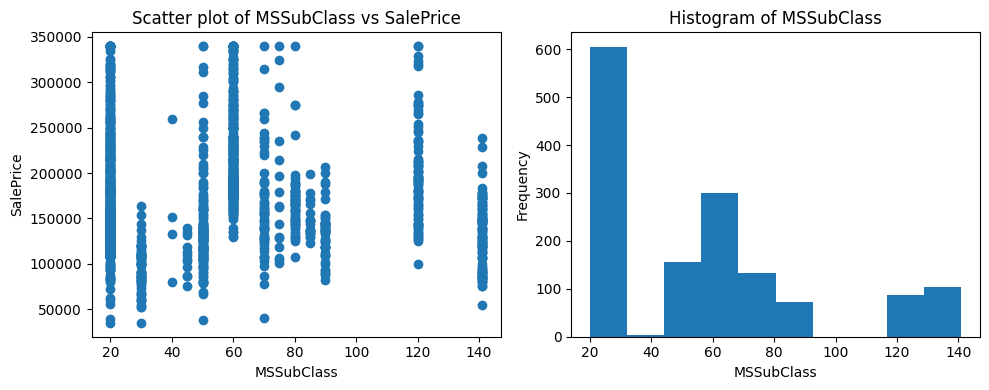

Pearson Correlation MSZoning: -0.27

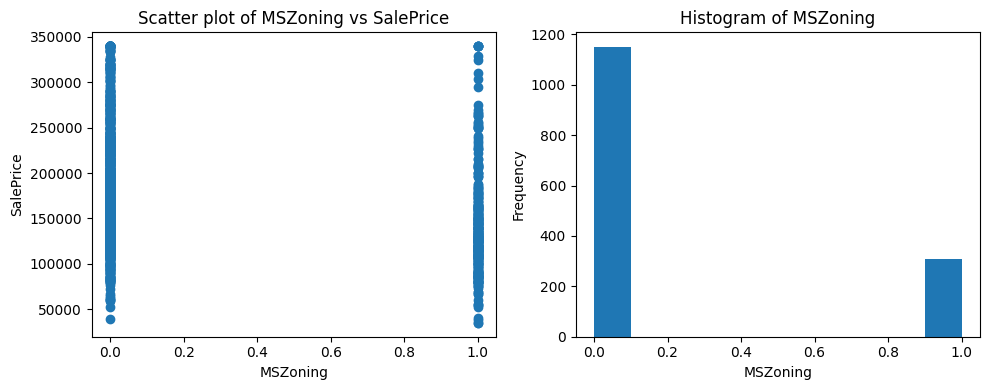

Pearson Correlation LotFrontage: 0.39

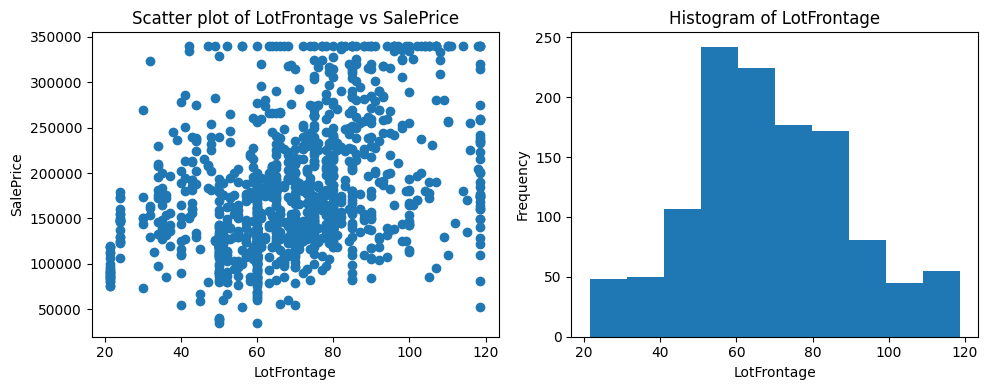

Pearson Correlation LotArea: 0.40

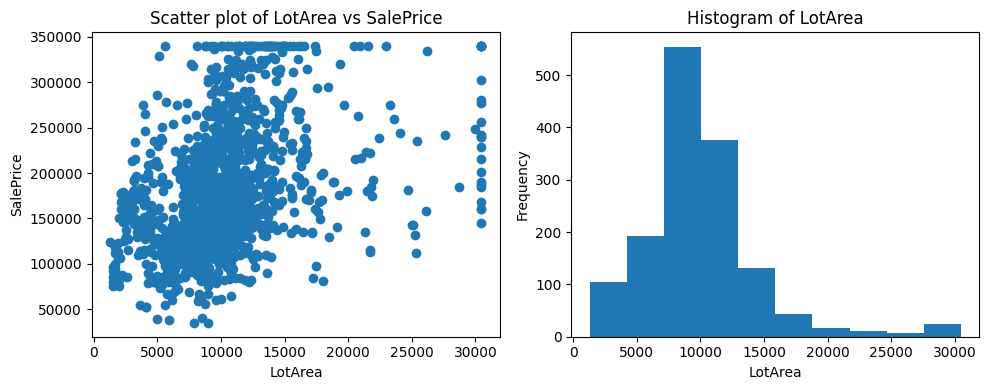

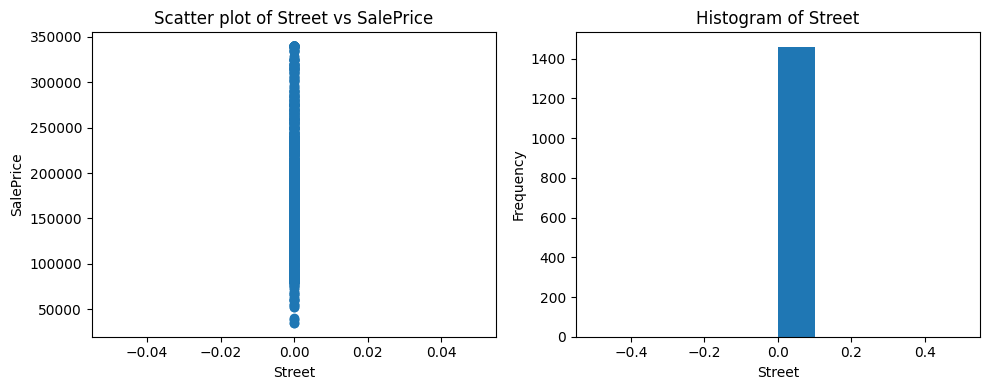

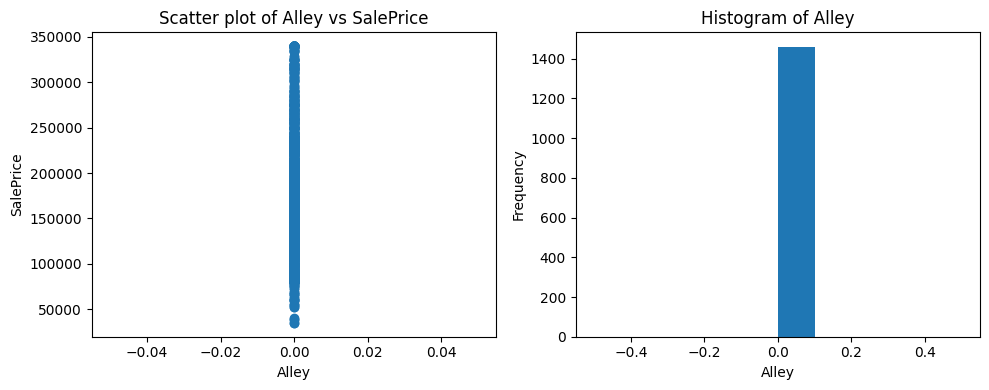

Pearson Correlation LotShape: 0.28

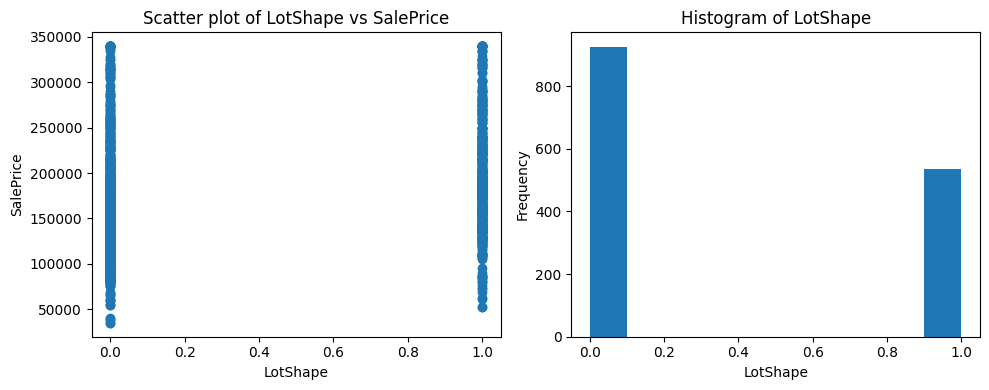

Pearson Correlation LandContour: 0.03

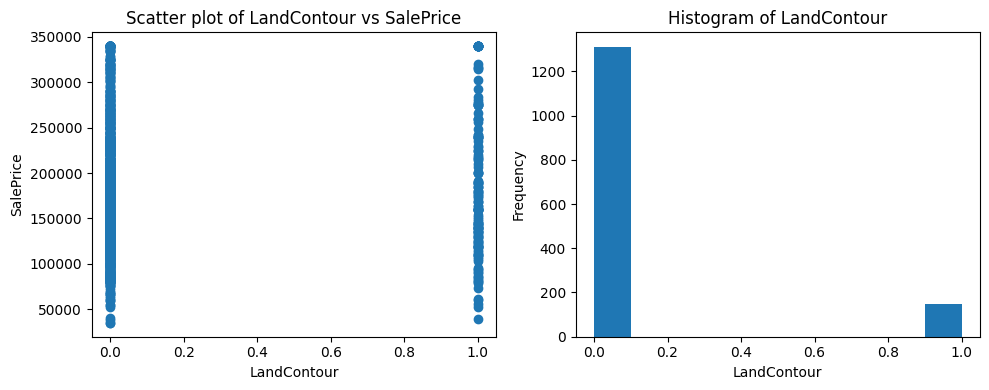

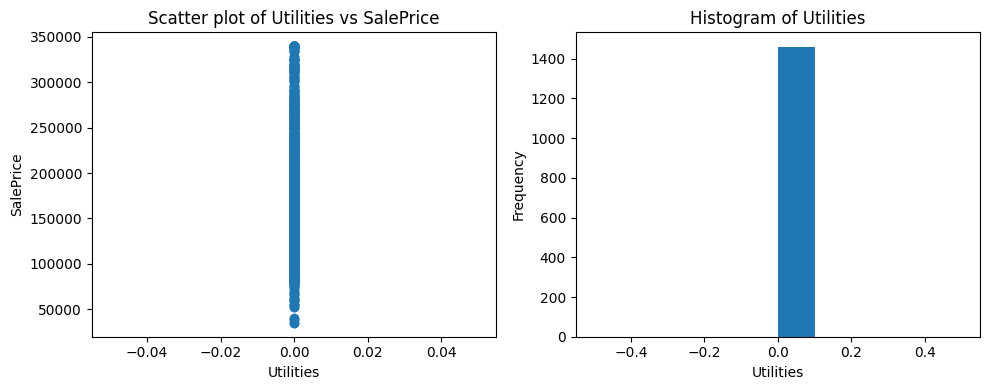

Pearson Correlation LotConfig: 0.08

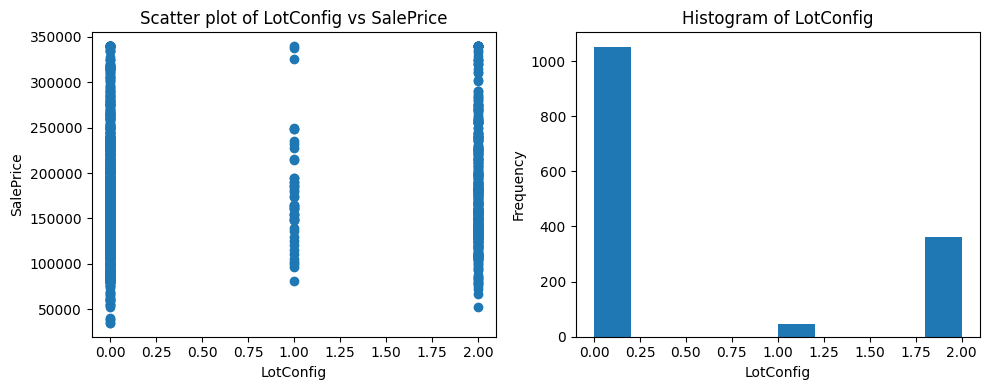

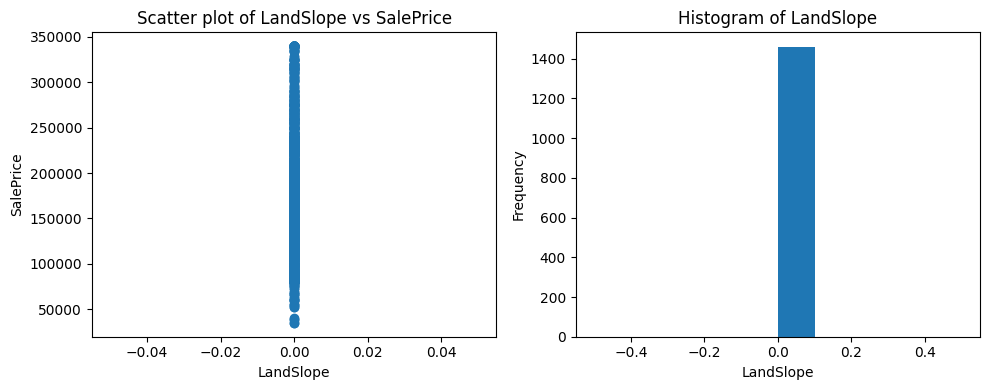

Pearson Correlation Neighborhood: -0.16

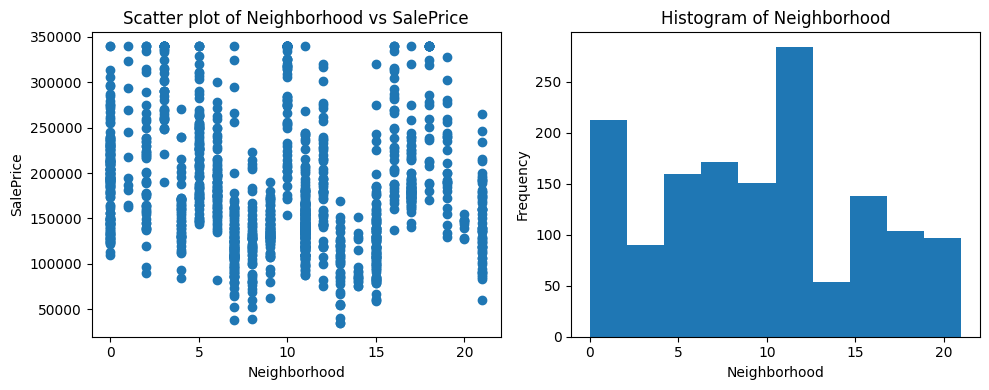

Pearson Correlation Condition1: -0.09

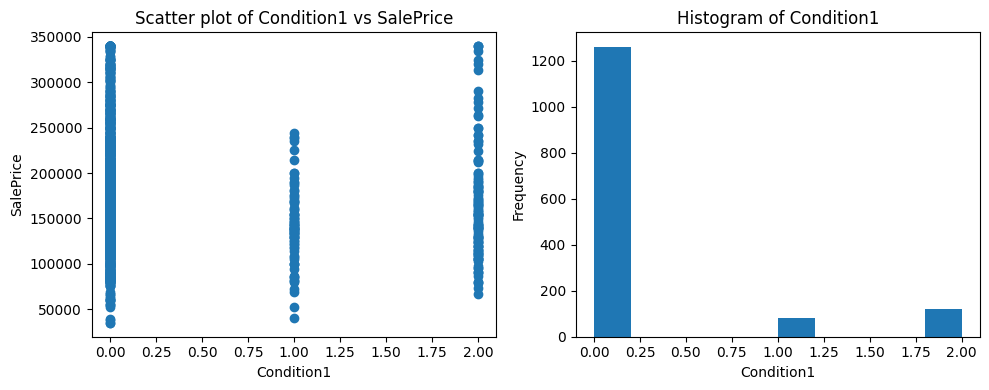

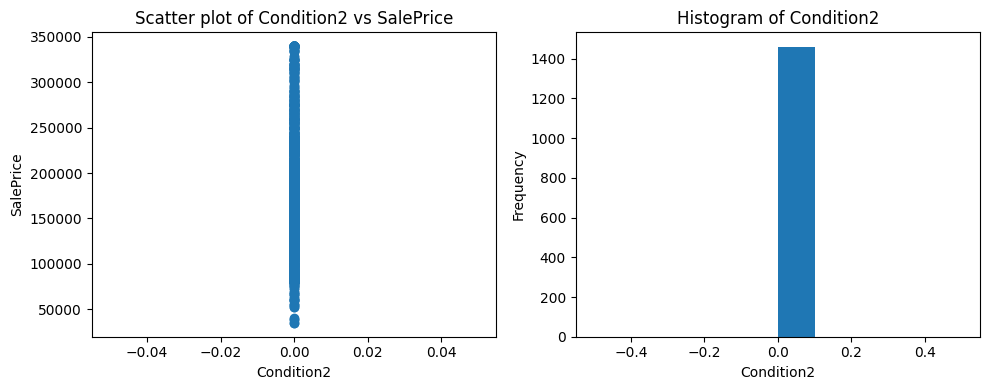

Pearson Correlation BldgType: -0.13

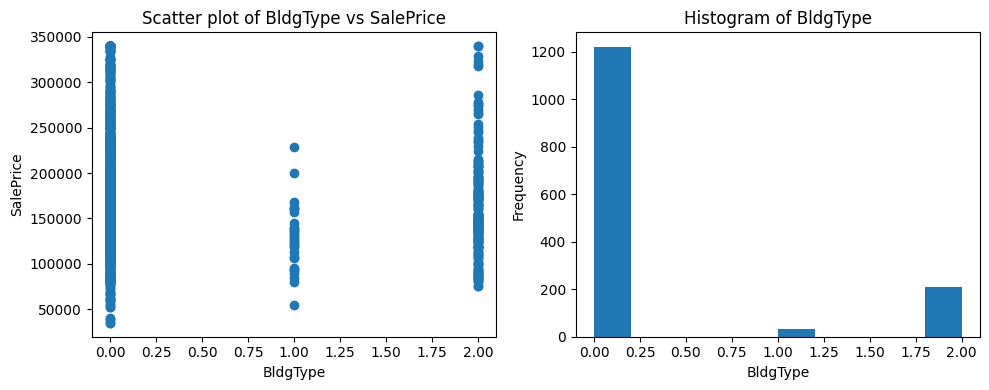

Pearson Correlation HouseStyle: -0.27

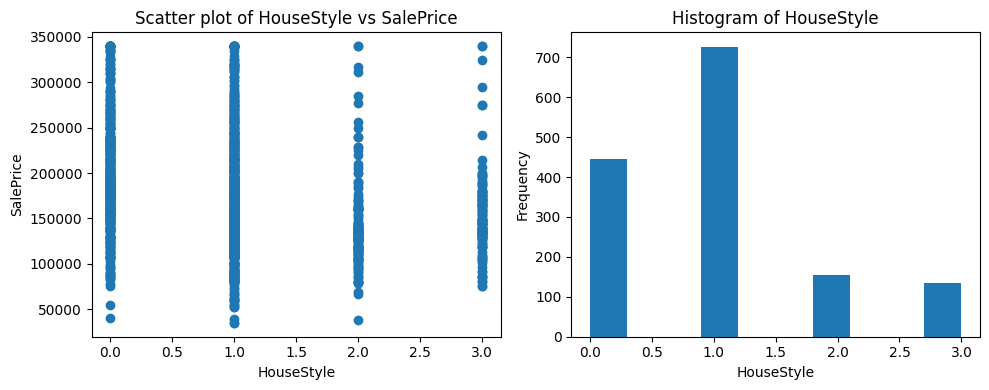

Pearson Correlation OverallQual: 0.80

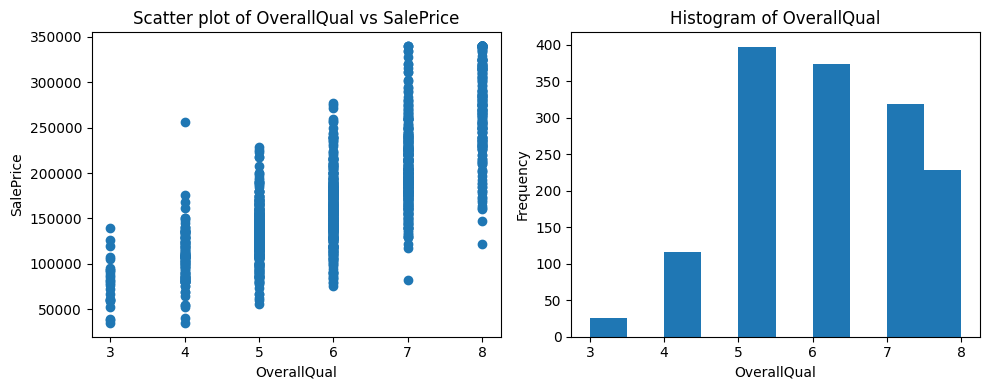

Pearson Correlation OverallCond: -0.09

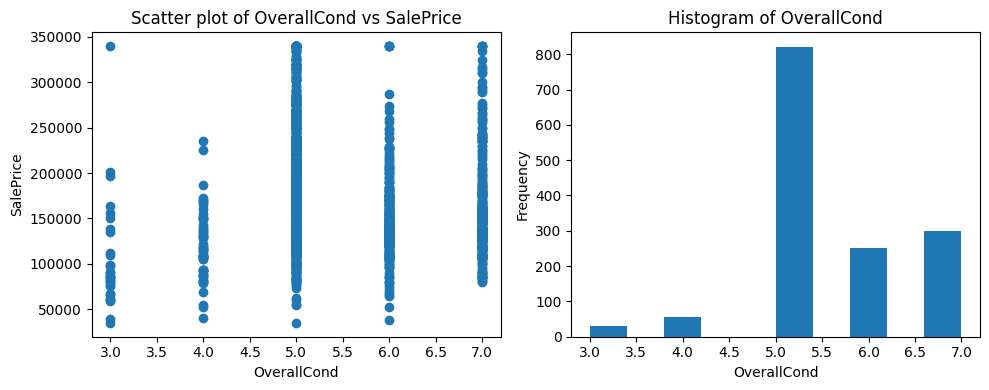

Pearson Correlation YearBuilt: 0.58

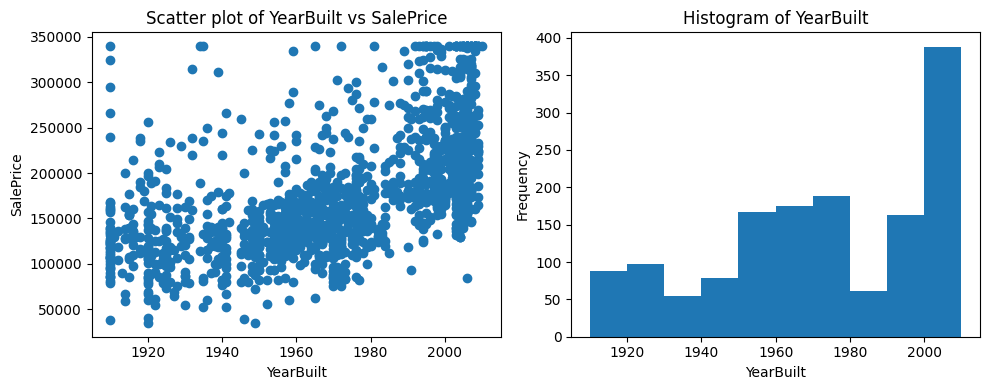

Pearson Correlation YearRemodAdd: 0.55

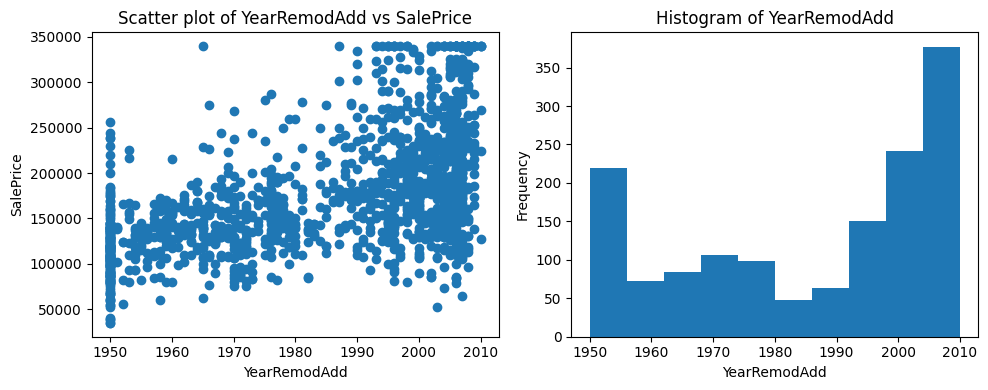

Pearson Correlation RoofStyle: 0.20

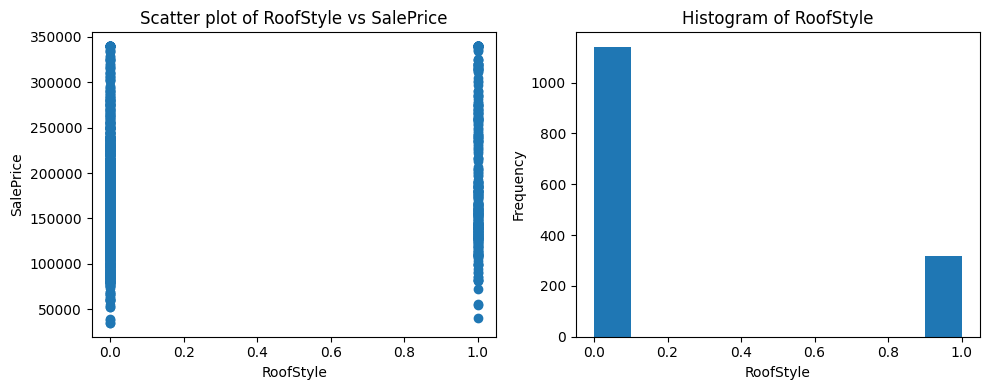

Pearson Correlation RoofMatl: 0.08

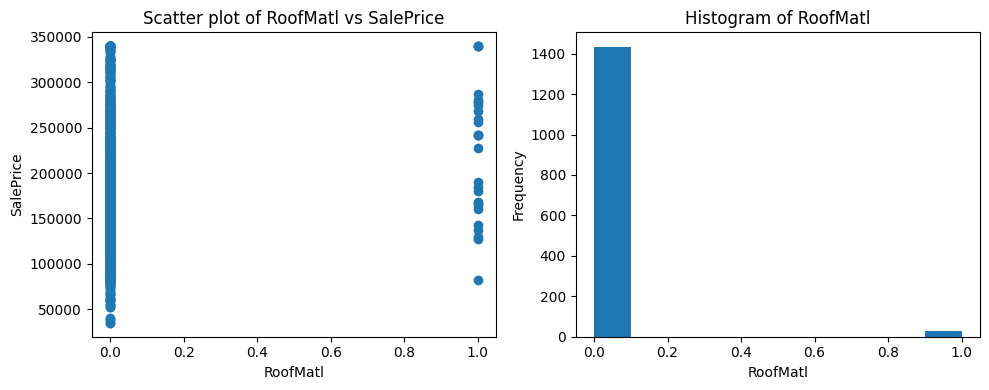

Pearson Correlation Exterior1st: -0.14

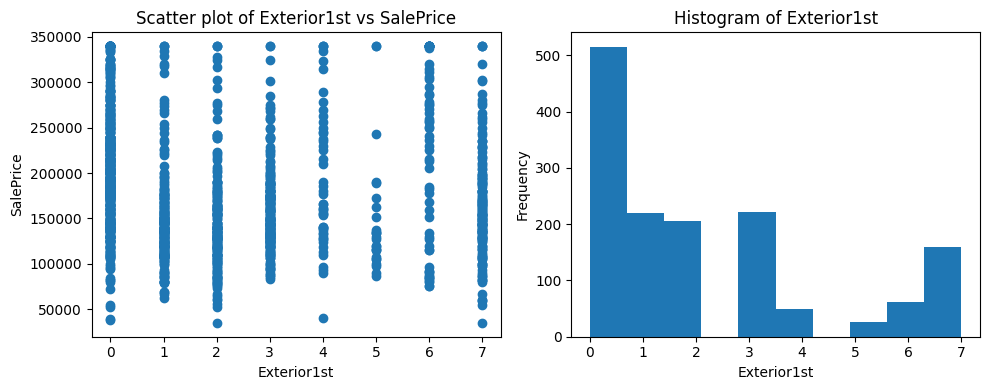

Pearson Correlation Exterior2nd: -0.21

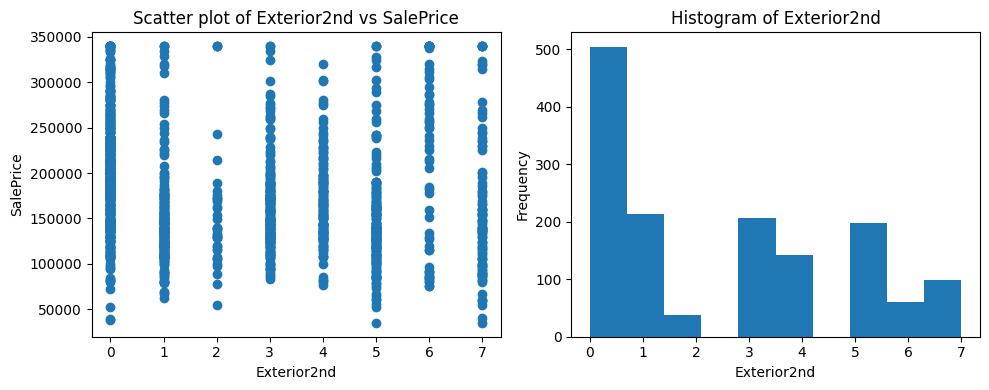

Pearson Correlation MasVnrType: -0.02

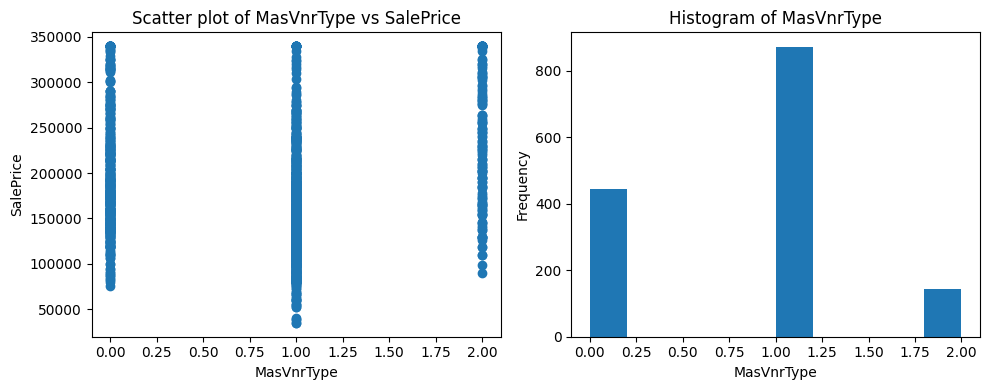

Pearson Correlation MasVnrArea: 0.46

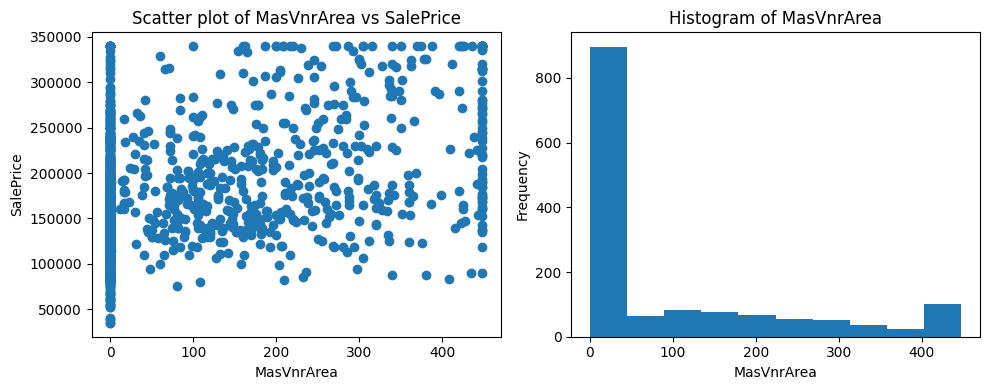

Pearson Correlation ExterQual: -0.53

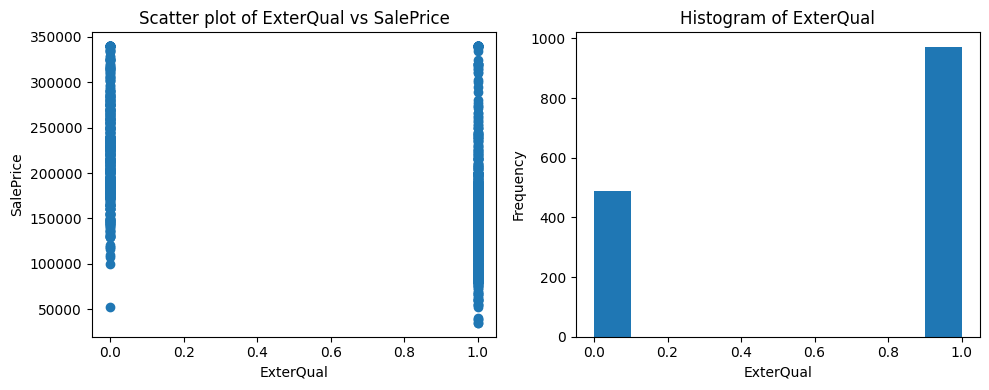

Pearson Correlation ExterCond: -0.12

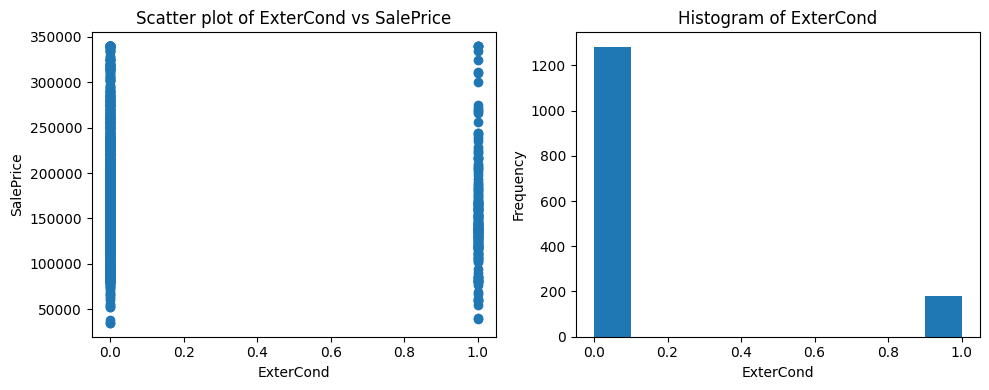

Pearson Correlation Foundation: -0.52

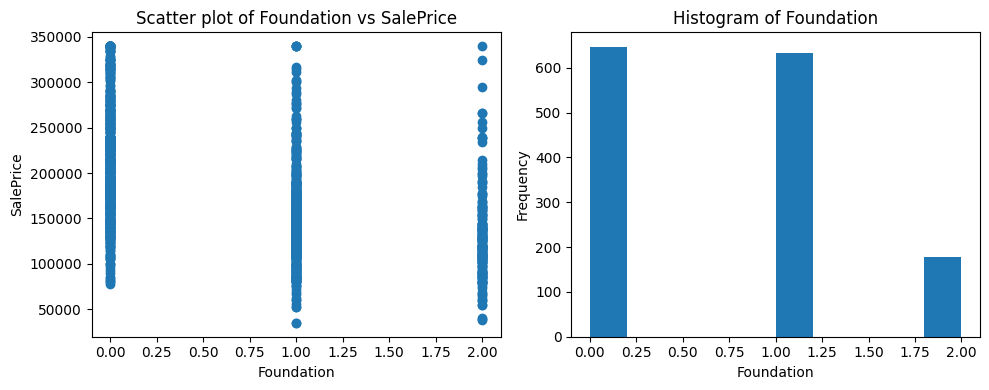

Pearson Correlation BsmtQual: -0.09

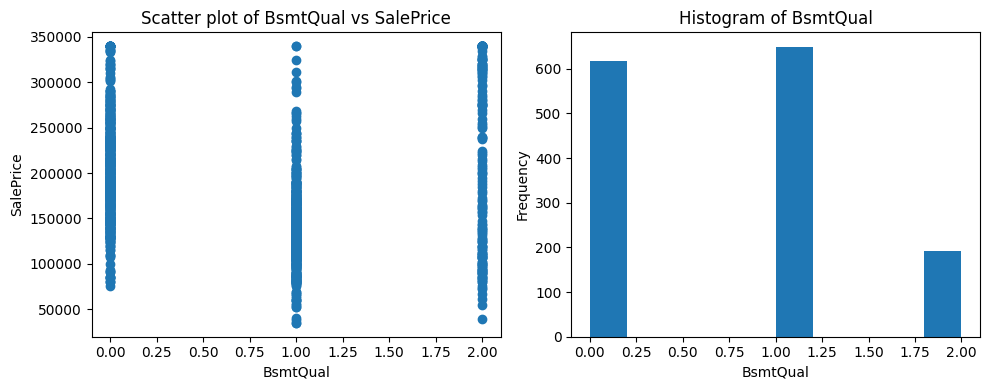

Pearson Correlation BsmtCond: -0.11

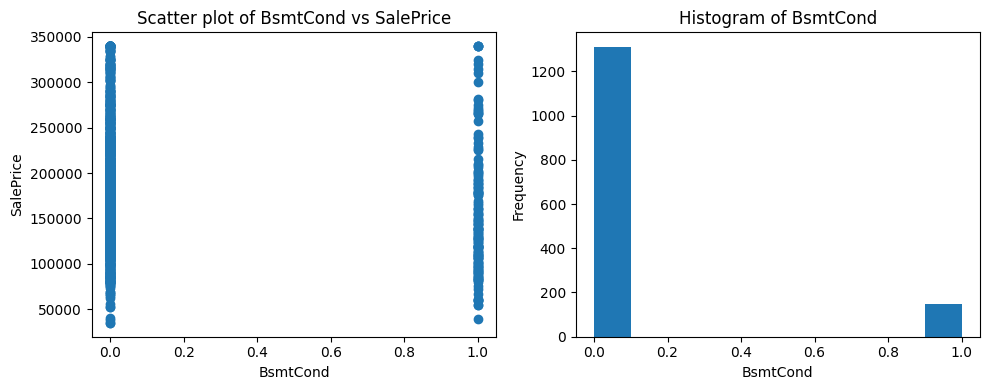

Pearson Correlation BsmtExposure: 0.16

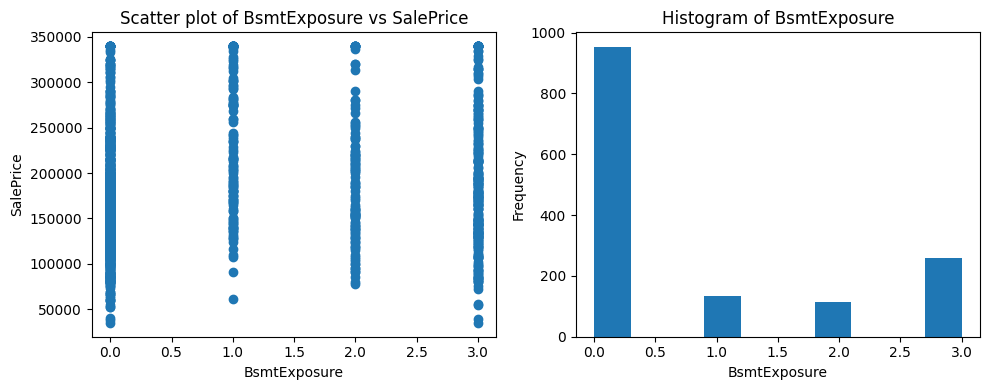

Pearson Correlation BsmtFinType1: -0.41

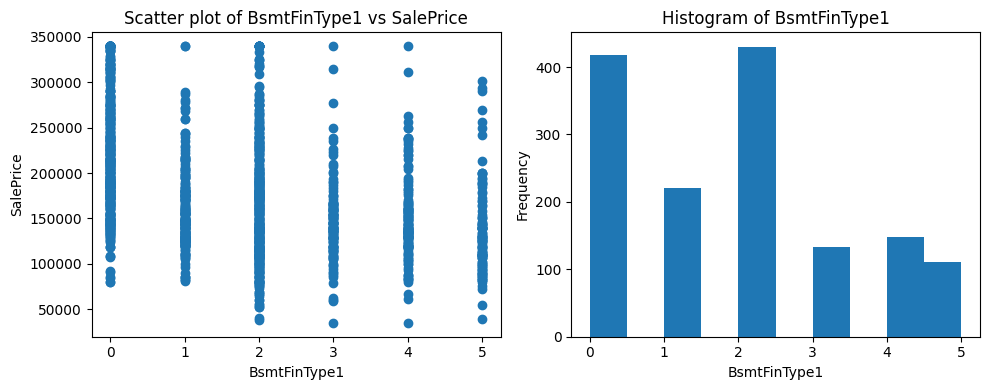

Pearson Correlation BsmtFinSF1: 0.38

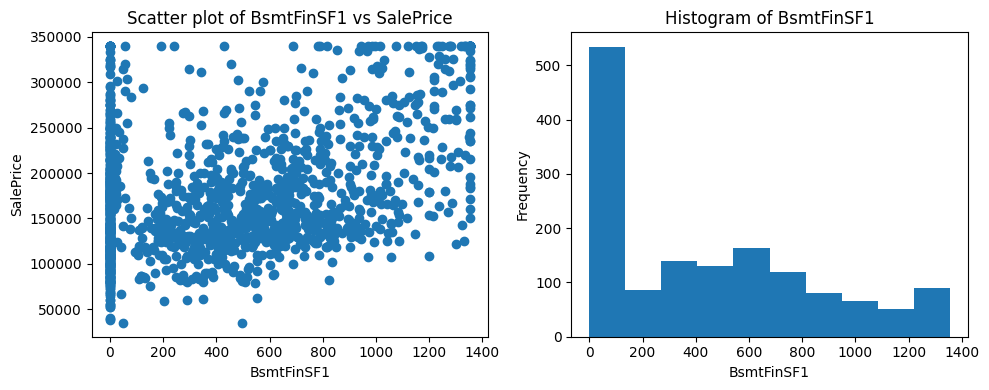

Pearson Correlation BsmtFinType2: -0.10

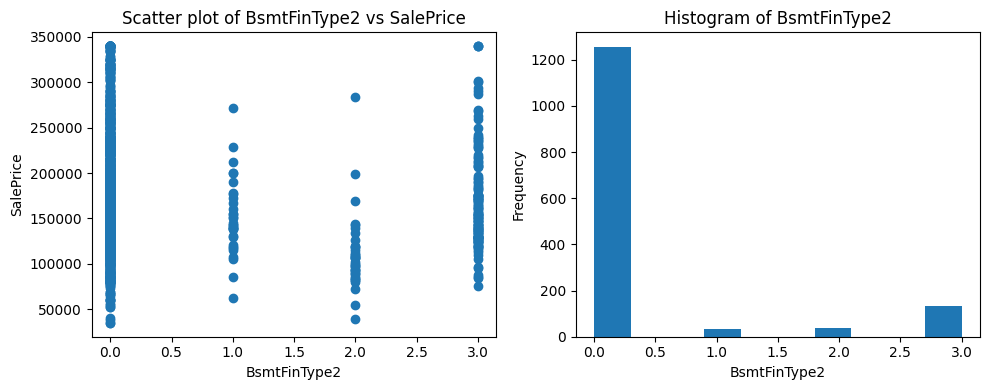

Pearson Correlation BsmtFinSF2: -0.05

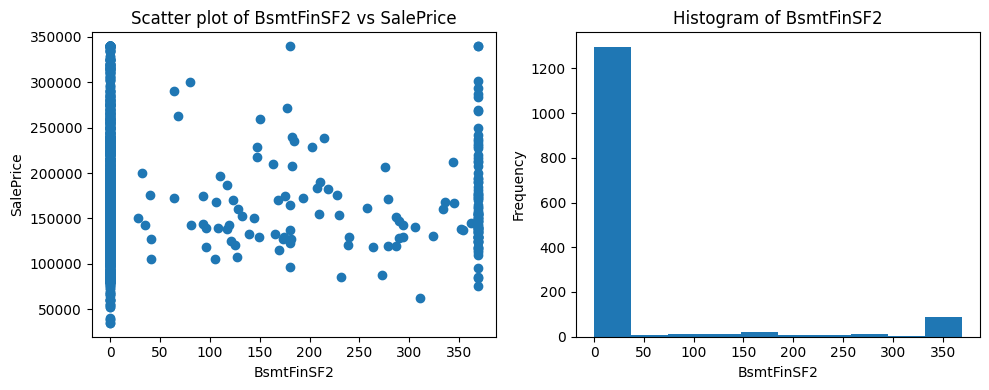

Pearson Correlation BsmtUnfSF: 0.20

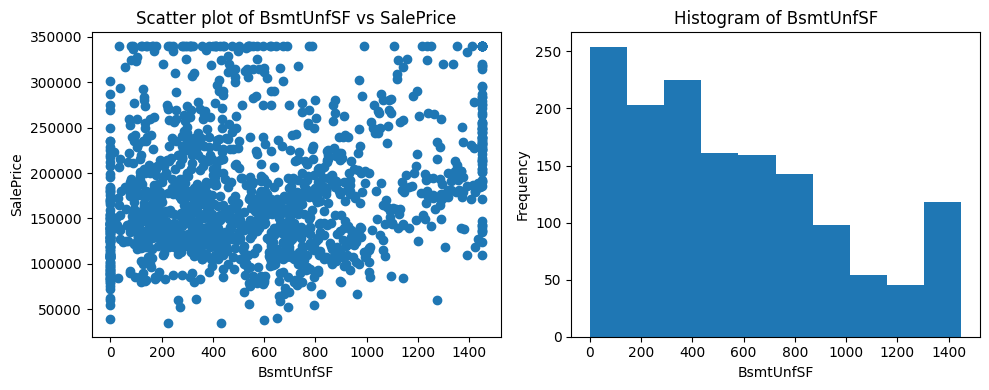

Pearson Correlation TotalBsmtSF: 0.65

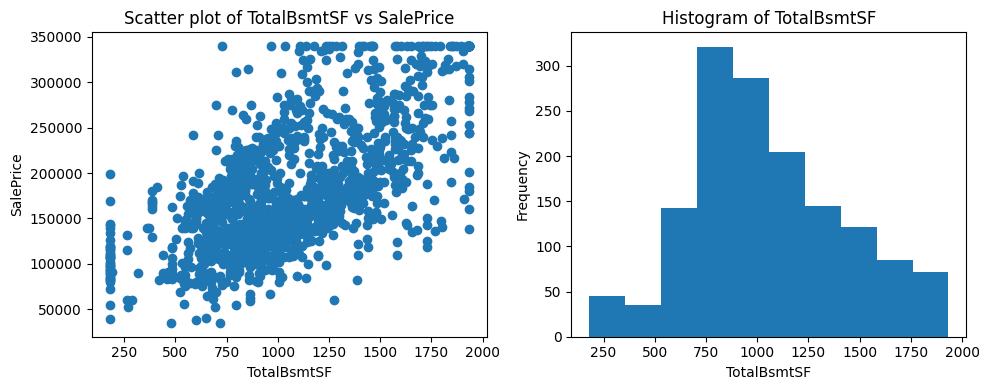

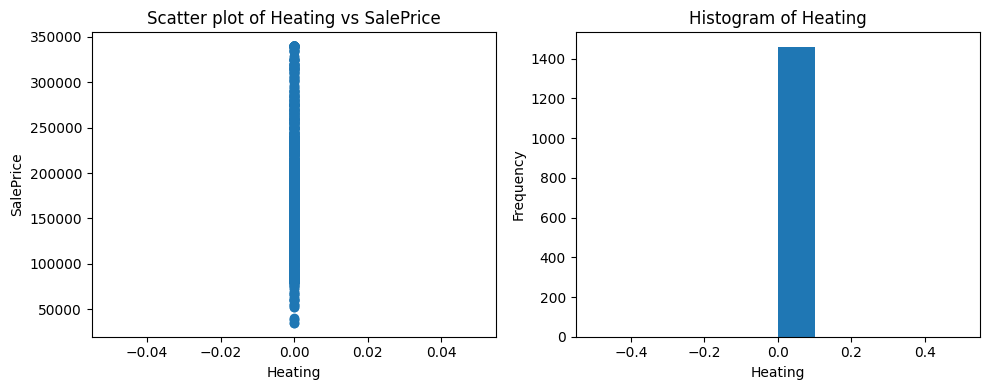

Pearson Correlation HeatingQC: -0.46

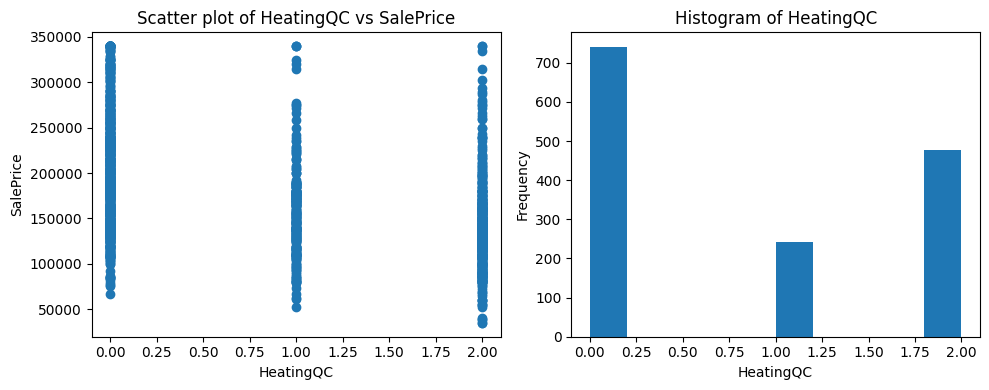

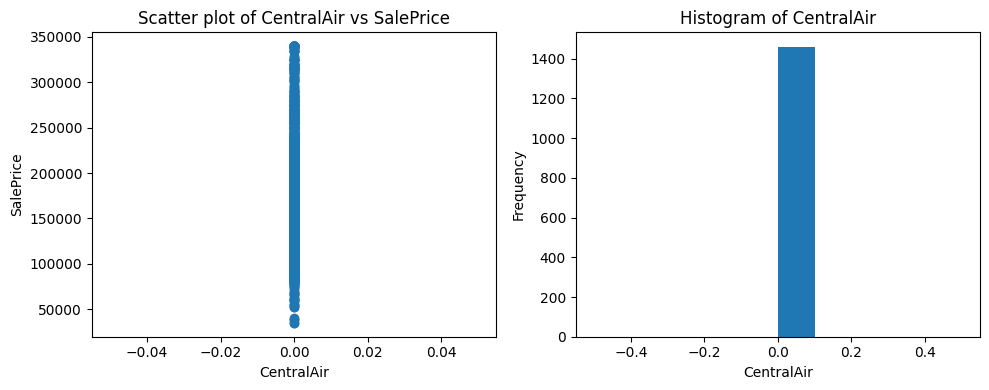

Pearson Correlation Electrical: -0.27

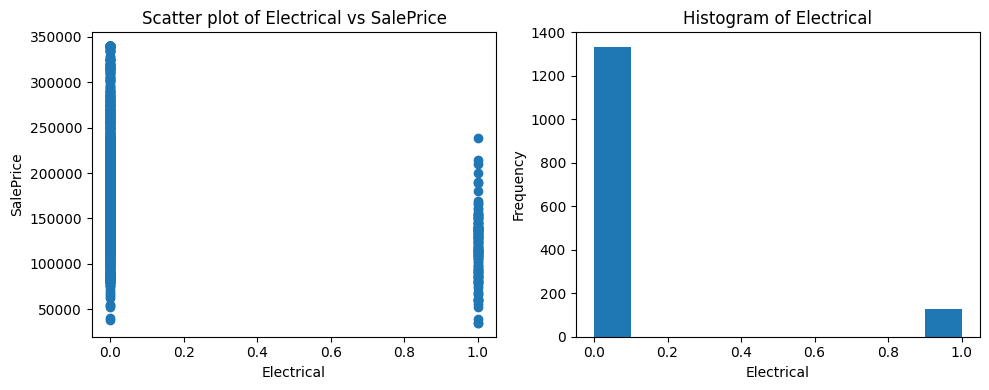

Pearson Correlation 1stFlrSF: 0.62

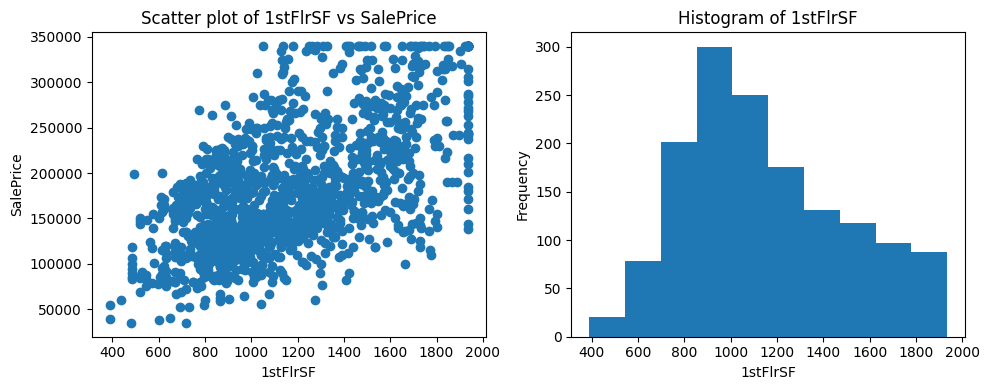

Pearson Correlation 2ndFlrSF: 0.30

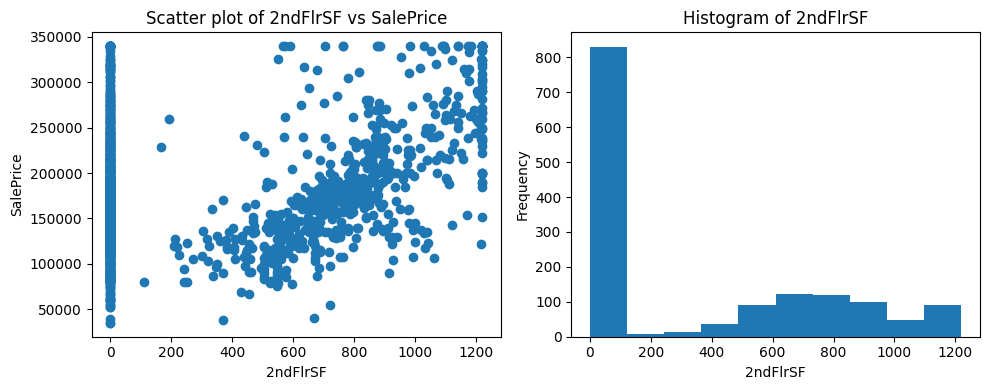

Pearson Correlation LowQualFinSF: -0.06

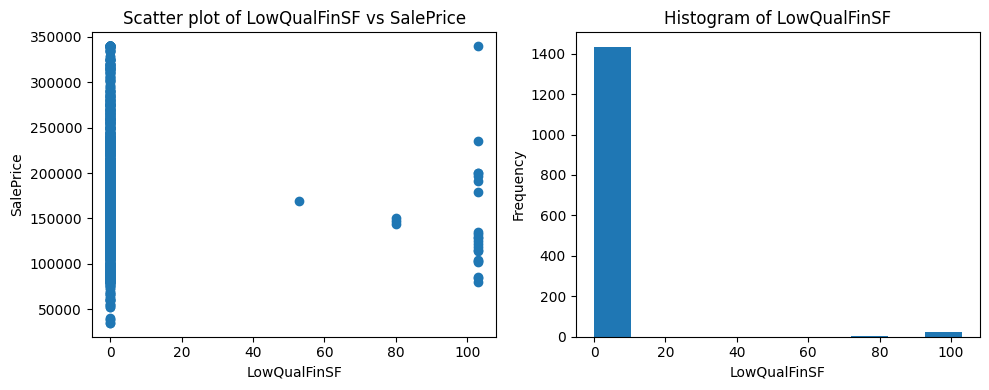

Pearson Correlation GrLivArea: 0.73

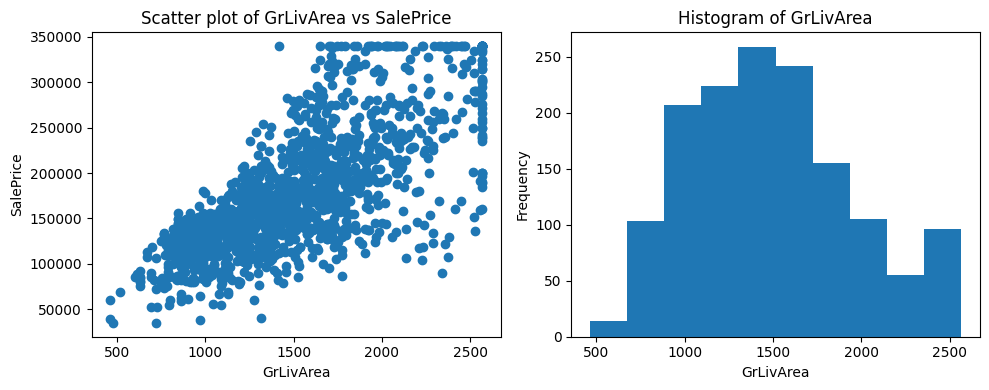

Pearson Correlation BsmtFullBath: 0.24

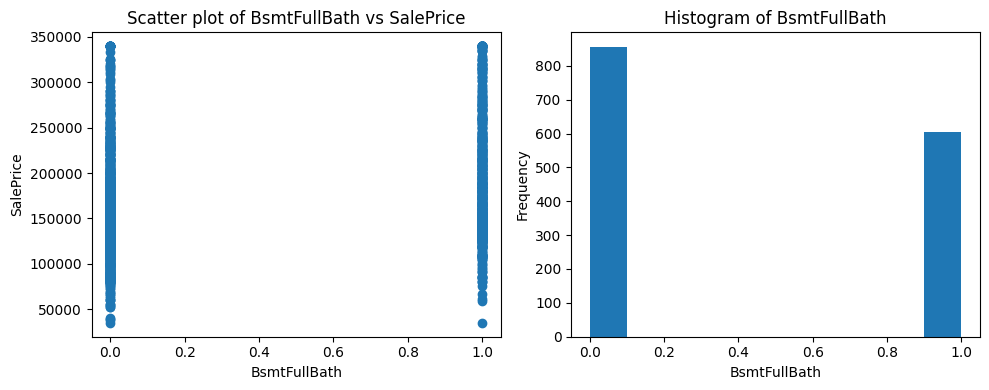

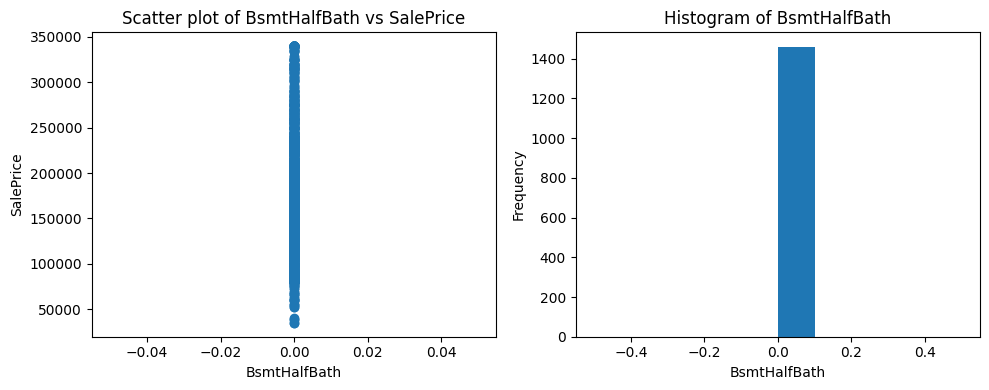

Pearson Correlation FullBath: 0.56

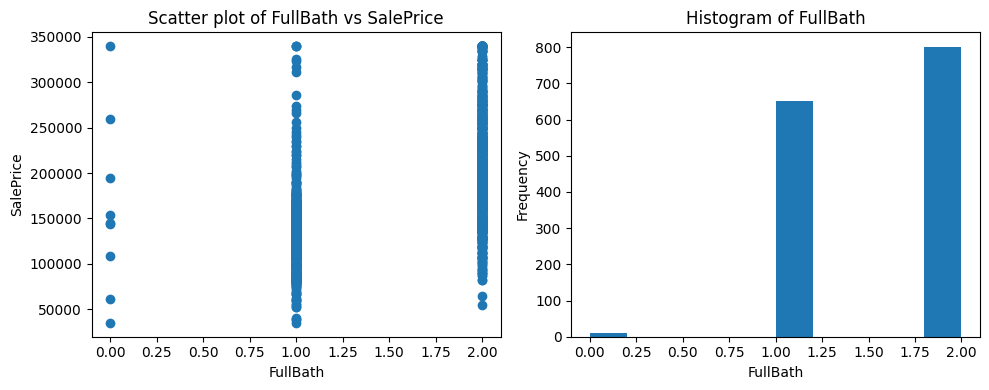

Pearson Correlation HalfBath: 0.31

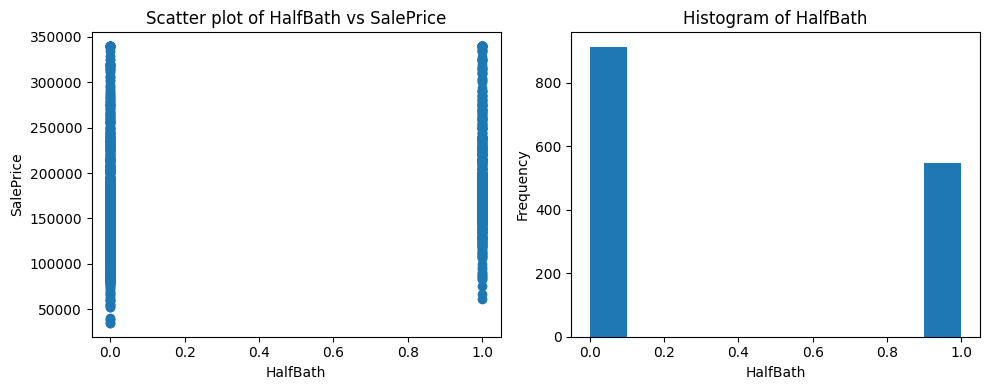

Pearson Correlation BedroomAbvGr: 0.21

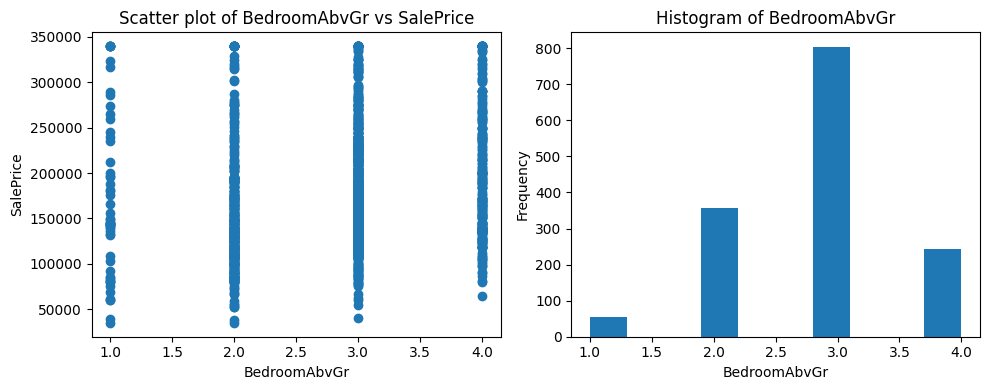

Pearson Correlation KitchenAbvGr: 0.02

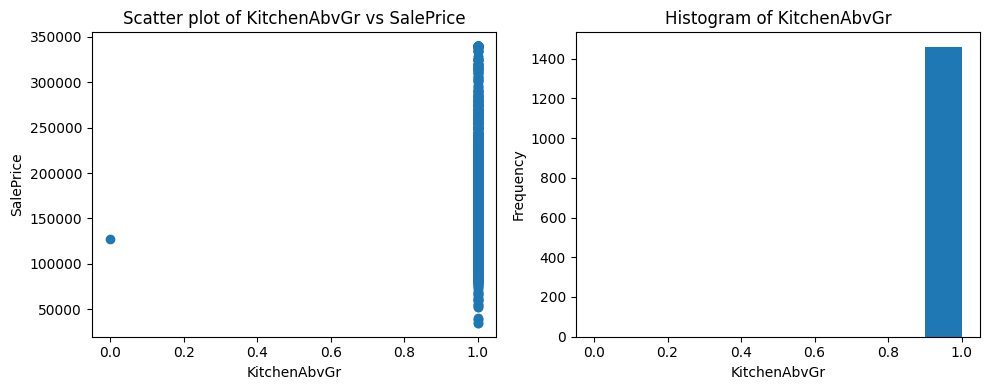

Pearson Correlation KitchenQual: -0.17

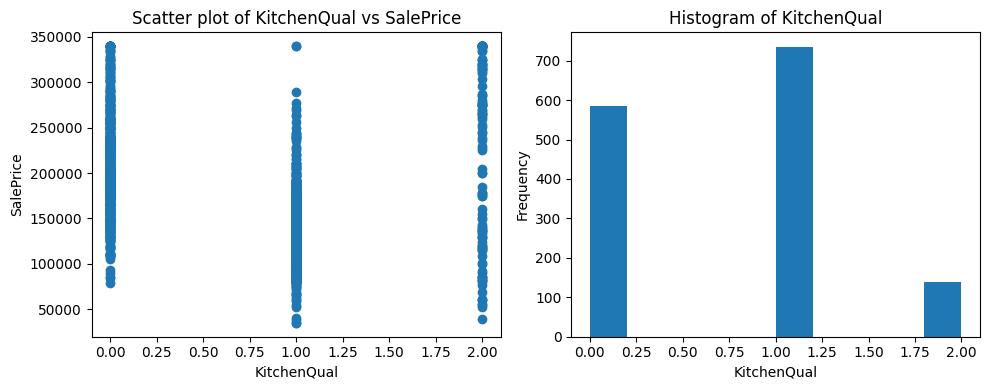

Pearson Correlation TotRmsAbvGrd: 0.54

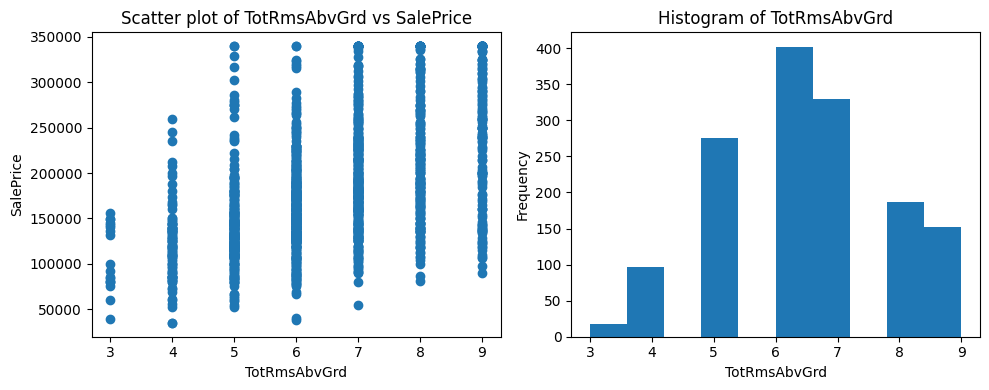

Pearson Correlation Functional: -0.13

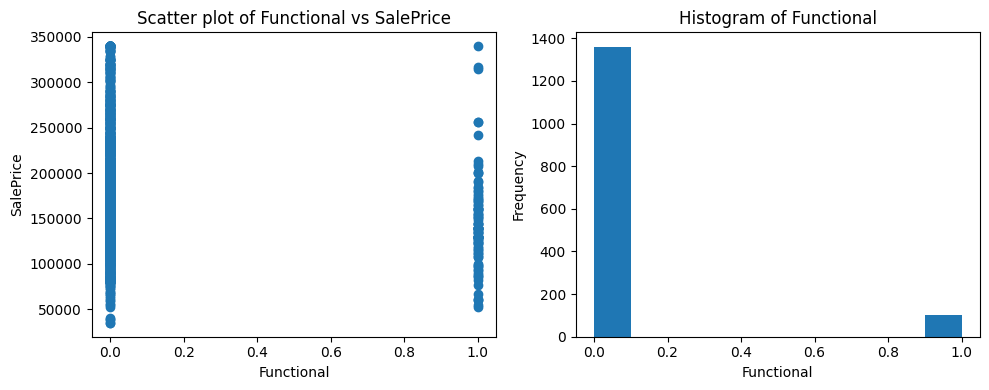

Pearson Correlation Fireplaces: 0.51

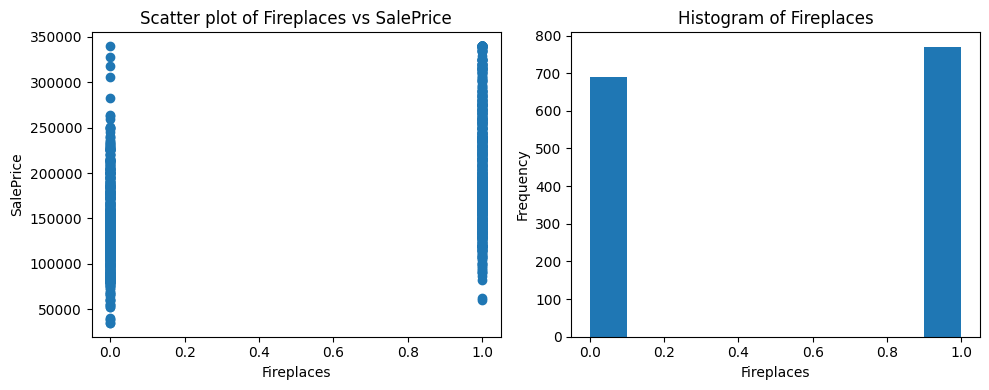

Pearson Correlation FireplaceQu: 0.46

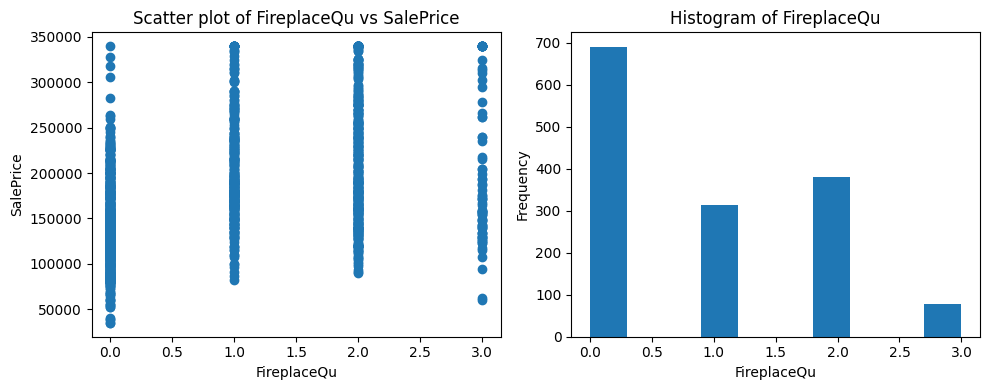

Pearson Correlation GarageType: -0.31

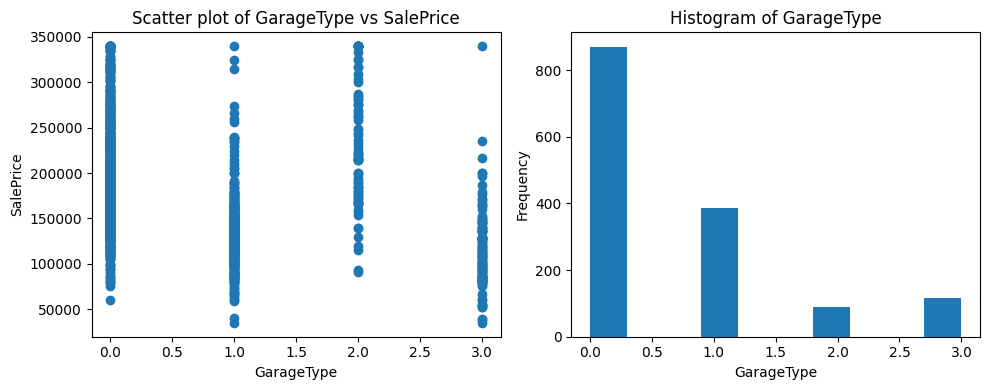

Pearson Correlation GarageYrBlt: 0.54

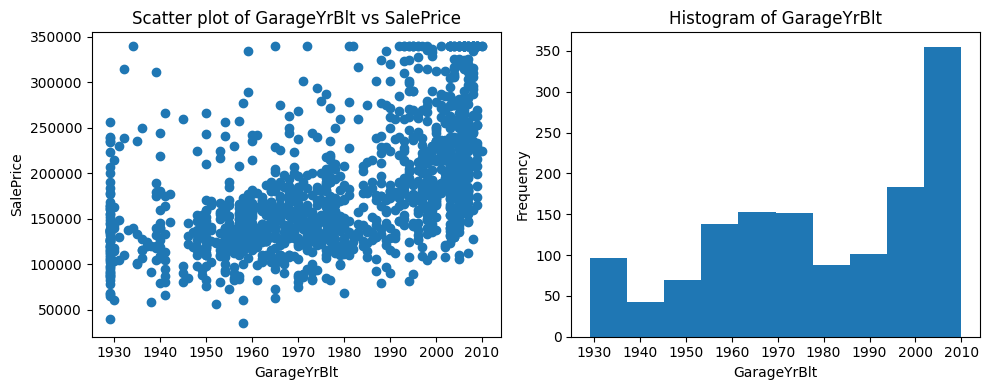

Pearson Correlation GarageFinish: 0.03

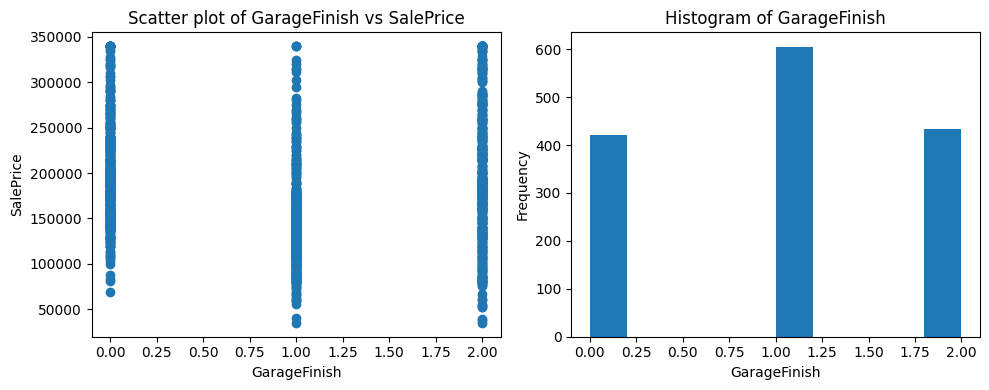

Pearson Correlation GarageCars: 0.68

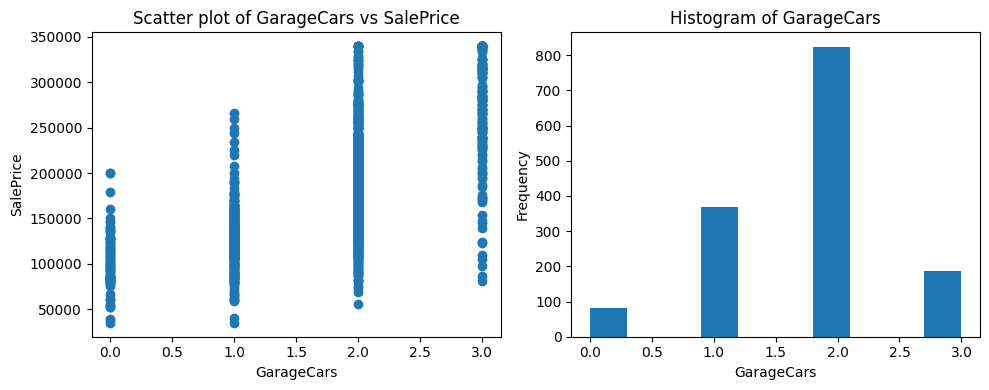

Pearson Correlation GarageArea: 0.67

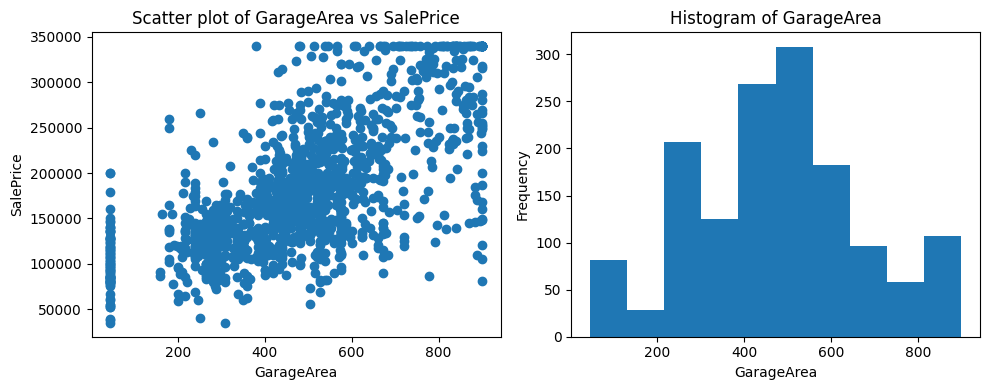

Pearson Correlation GarageQual: -0.28

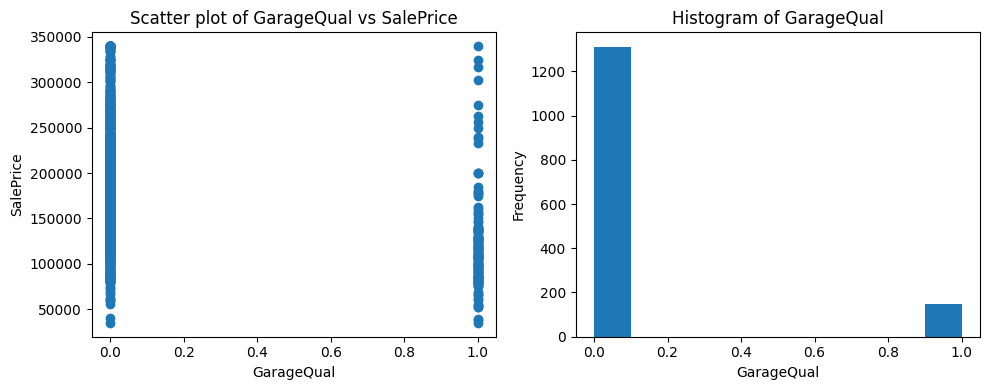

Pearson Correlation GarageCond: -0.31

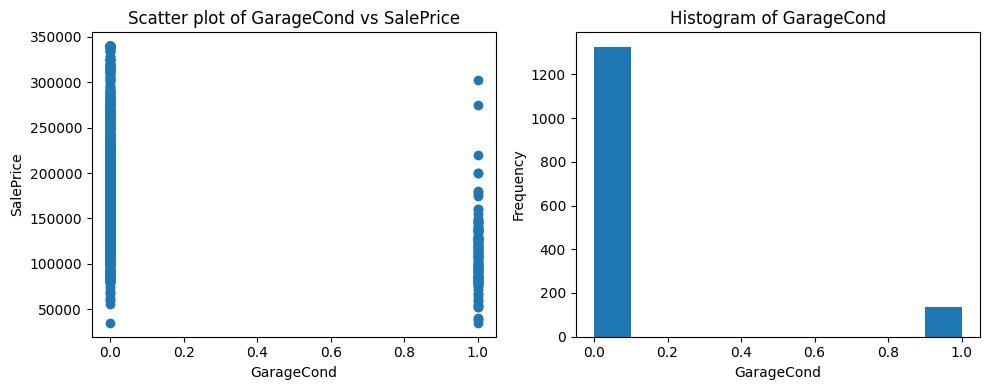

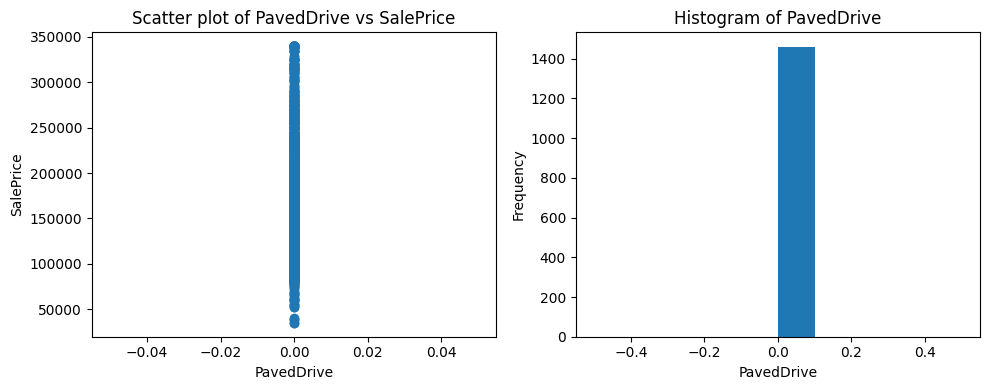

Pearson Correlation WoodDeckSF: 0.35

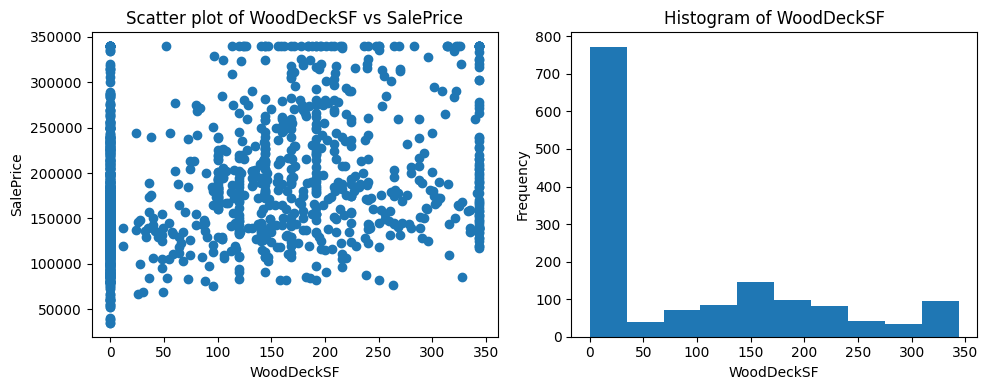

Pearson Correlation OpenPorchSF: 0.39

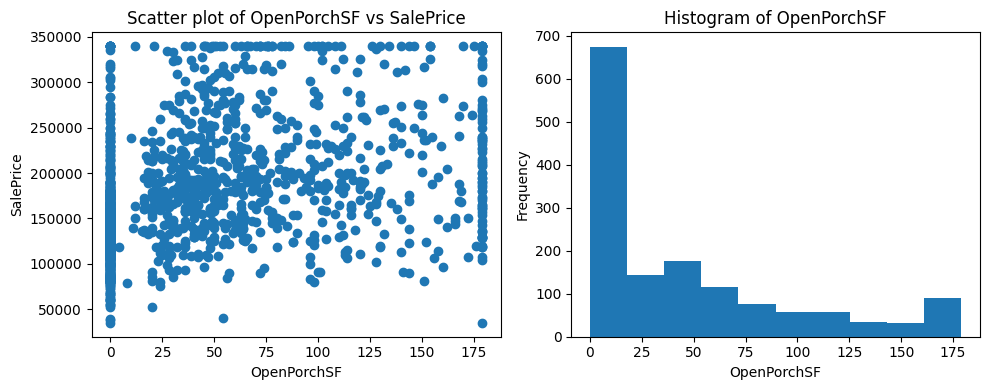

Pearson Correlation EnclosedPorch: -0.18

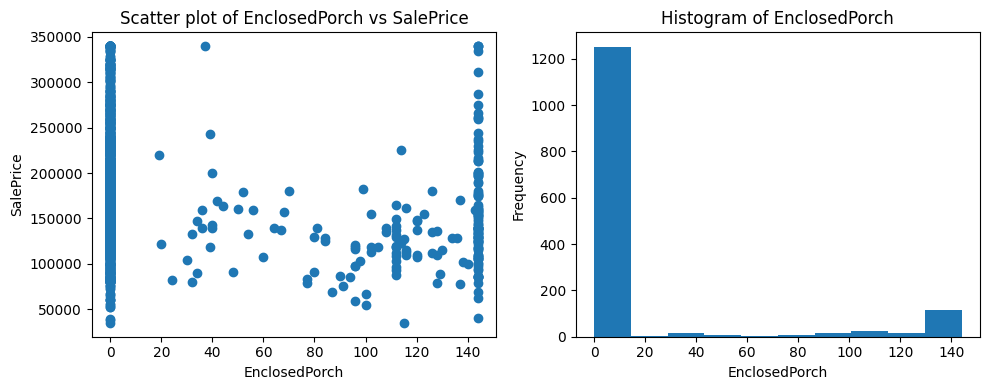

Pearson Correlation 3SsnPorch: 0.05

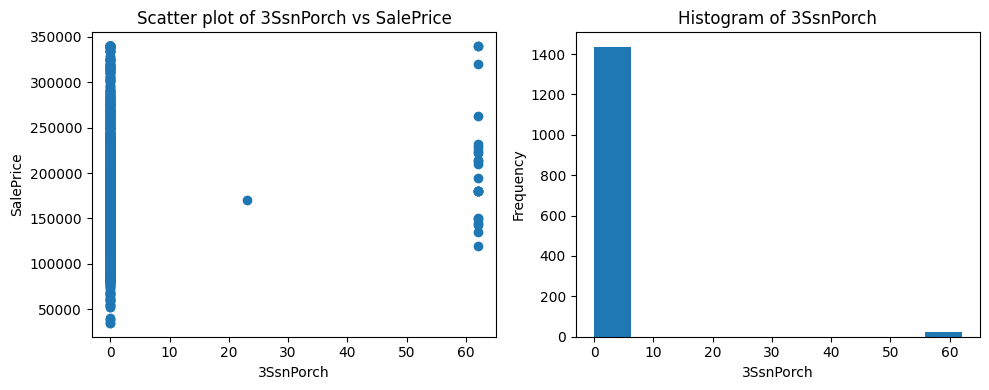

Pearson Correlation ScreenPorch: 0.09

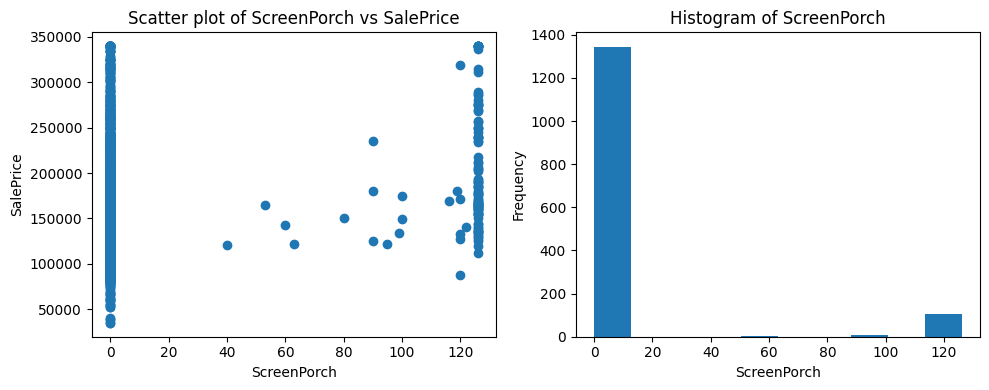

Pearson Correlation PoolArea: 0.05

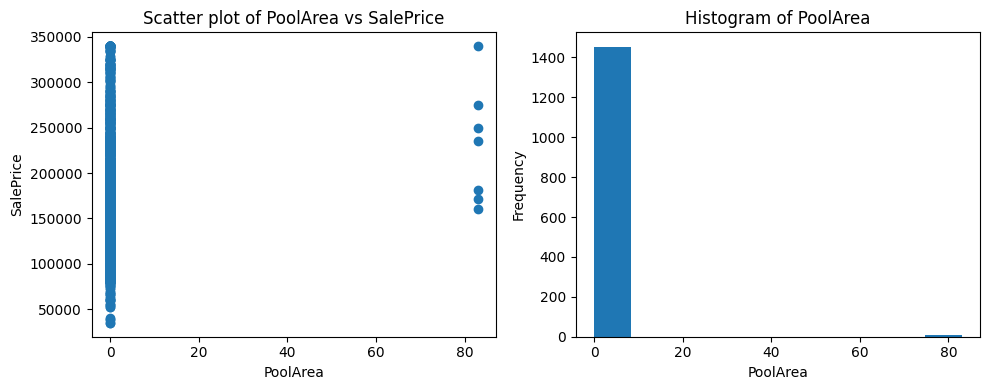

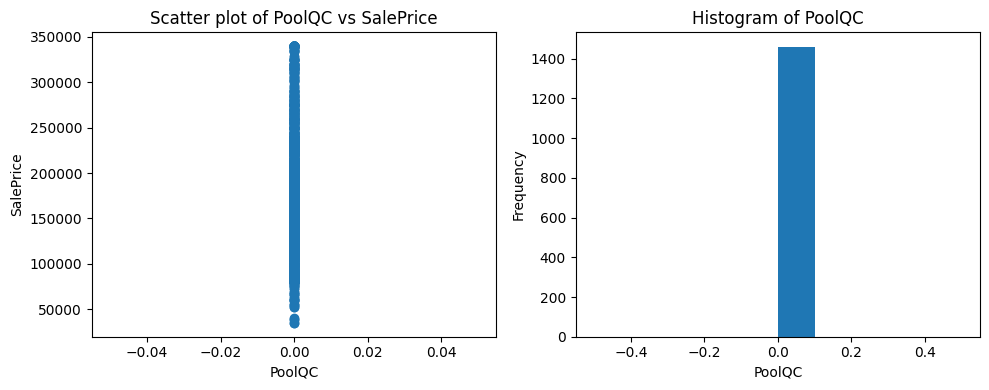

Pearson Correlation Fence: -0.19

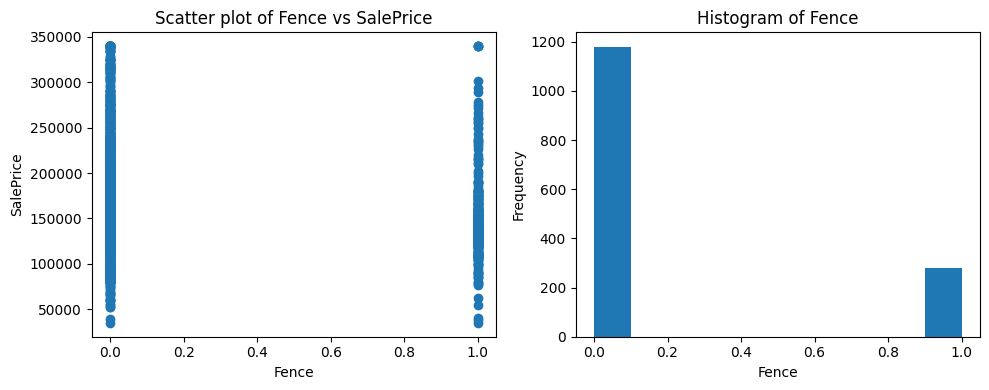

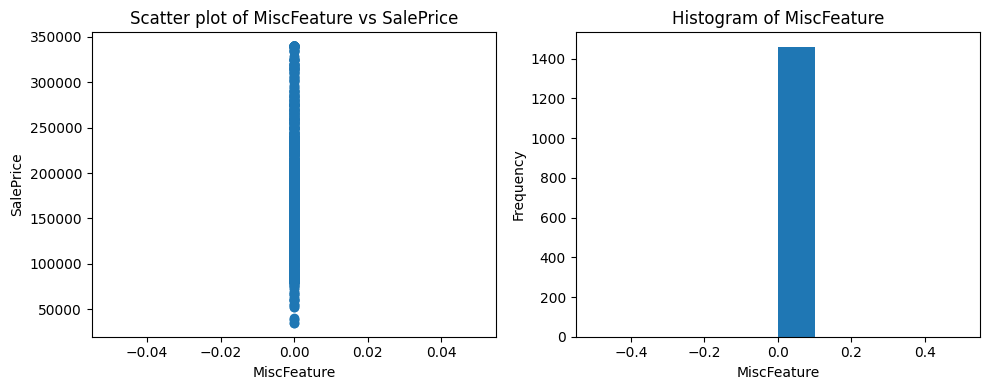

Pearson Correlation MiscVal: -0.05

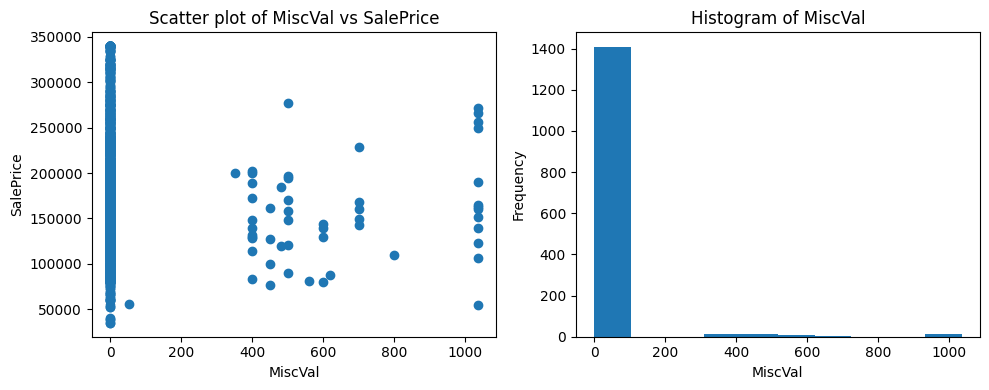

Pearson Correlation MoSold: 0.07

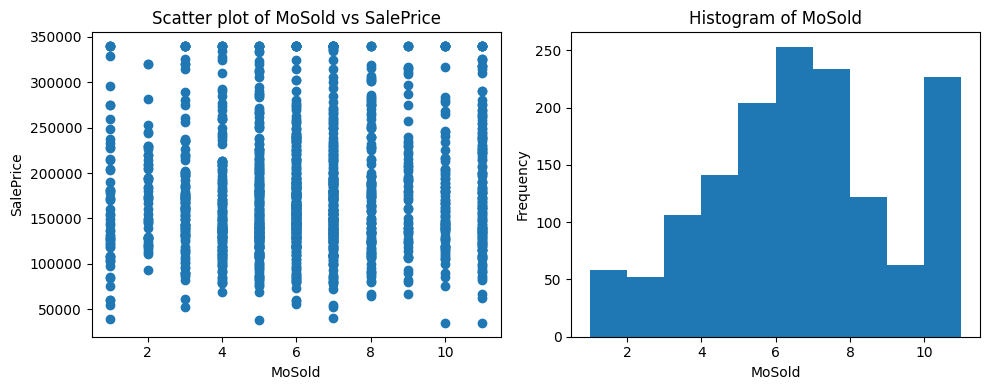

Pearson Correlation YrSold: -0.03

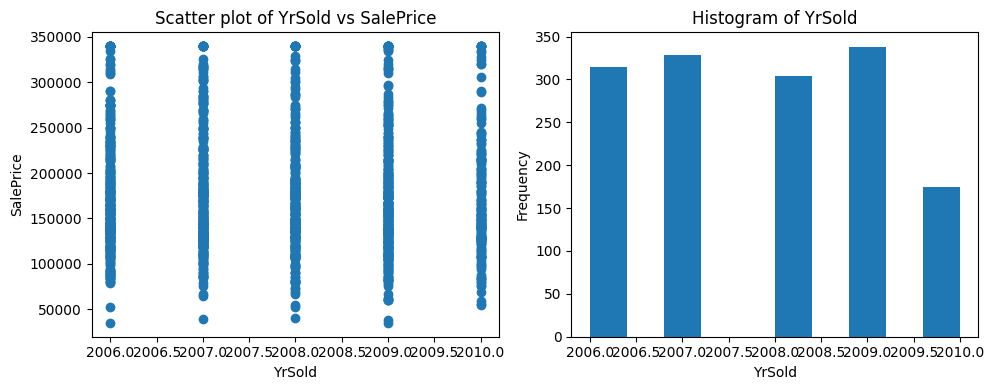

Pearson Correlation SaleType: 0.23

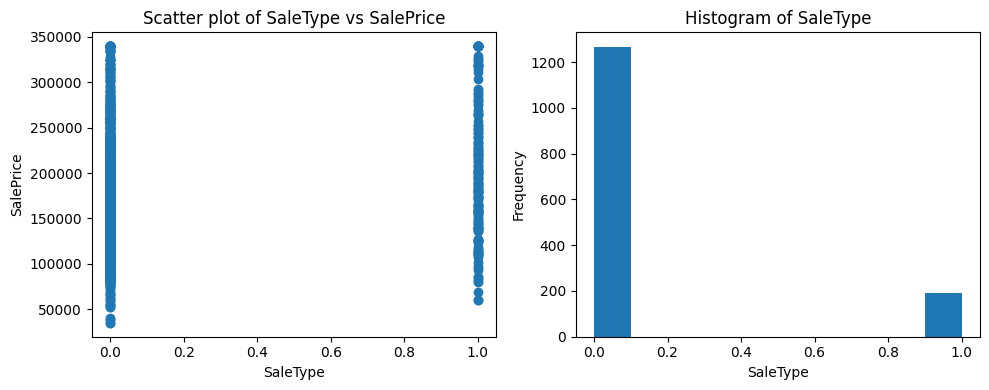

Pearson Correlation SaleCondition: 0.21

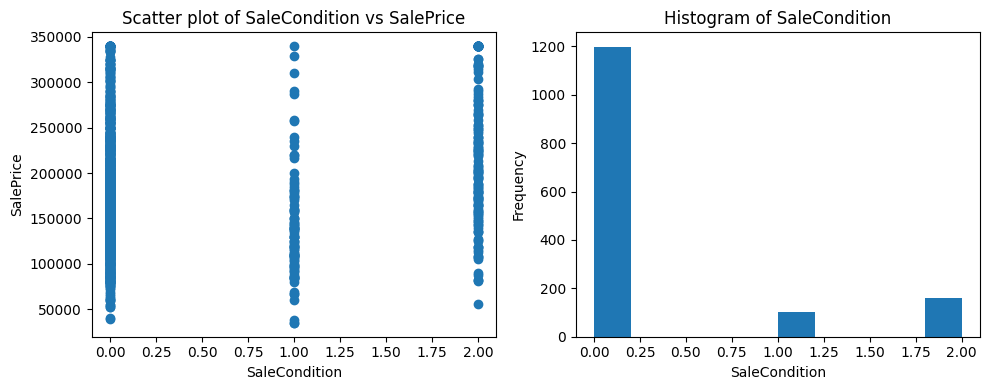

In [150]:
if __name__ == '__main__':
    source = load_data()
    target = temp_map_categorical(source)
    
    target = normalize_outliers(target, use_mean=True, threshold=2)
    target = normalize_outliers(target, use_mean=True, threshold=2.5)
    
    plot_y = target['SalePrice']
    plot_x = target.drop(['Id','SalePrice'], axis=1)
    
    analyze_features(target)
    plot_data(plot_x, plot_y)     


# Normalization

### Now that we've identified the features we're working with, we can normalize them to prepare them for the models

In [200]:
def add_one_hot_feature(source: pd.DataFrame, target: pd.DataFrame, feature: str, all_categories: list) -> pd.DataFrame:
    
    # Create a temporary DataFrame with the feature to ensure it has a category type with all possible categories
    temp_df = pd.DataFrame({feature: pd.Categorical(source[feature], categories=all_categories)})
    
    # Use pd.get_dummies to perform one-hot encoding
    encoded_df = pd.get_dummies(temp_df, prefix=feature).astype('int')
    
    # Drop the original feature from the input dataframe and concatenate the new encoded_df
    target = pd.concat([target, encoded_df], axis=1)
    
    return target

def normalize_feature_MinMax(source: pd.DataFrame, target: pd.DataFrame, feature: str) -> pd.DataFrame:
    if target is None:
        target = pd.DataFrame()
        
    if feature in source.columns:
        source_column = impute_data(source[[feature]])
        scaler = MinMaxScaler( ).set_output(transform='pandas')
        encoded_feature = scaler.fit_transform(source_column)
        target = pd.concat([target, encoded_feature], axis=1)
    return target

def normalize_feature_Standard(source: pd.DataFrame, target: pd.DataFrame, feature: str) -> pd.DataFrame:
    if target is None:
        target = pd.DataFrame()
        
    if feature in source.columns:
        source_column = impute_data(source[[feature]])
        scaler = StandardScaler( ).set_output(transform='pandas')
        encoded_feature = scaler.fit_transform(source_column)
        target = pd.concat([target, encoded_feature], axis=1)
    return target

def impute_data(source: pd.DataFrame) -> pd.DataFrame:   
    # Impute missing values with the median
    source = source.fillna(source.median())
    return source

def passthrough(source: pd.DataFrame, target: pd.DataFrame, feature: str) -> pd.DataFrame:
    if target is None:
        target = pd.DataFrame()
        
    if feature in source.columns:
        source_column = impute_data(source[[feature]])
        target = pd.concat([target, source_column], axis=1)
    return target

def convert_to_numeric(source: pd.DataFrame, target: pd.DataFrame, feature: str, all_categories: list) -> pd.DataFrame:
    if target is None:
        target = pd.DataFrame()

    if feature in source.columns:
        source_column = source[feature]
        source_column = source_column.map(all_categories)
        source_column = impute_data(source_column)
        target = pd.concat([target, source_column], axis=1)
    return target

def convert_year_to_age(source: pd.DataFrame, target: pd.DataFrame, feature: str) -> pd.DataFrame:
    if target is None:
        target = pd.DataFrame()

    # Convert years to Age - This will help normalize the data
    current_year = datetime.datetime.now().year
    source_column = source[feature]
    source_column = impute_data(source_column)
    target[feature + "_age"] = current_year - source_column
    return target

def normalize_data(source: pd.DataFrame) -> pd.DataFrame:
    target = pd.DataFrame()
        
    if 'SalePrice' in source.columns:
        target['SalePrice'] = source['SalePrice']
    
    target = passthrough(source, target, 'GarageCars')
    target = passthrough(source, target, "Fireplaces")
    target = passthrough(source, target, "FullBath")
    target = passthrough(source, target, "TotRmsAbvGrd")
    
    target = normalize_feature_MinMax(source, target, 'GrLivArea')
    target = normalize_feature_MinMax(source, target, 'GarageArea')
    target = normalize_feature_MinMax(source, target, 'TotalBsmtSF')
    target = normalize_feature_MinMax(source, target, '1stFlrSF')
    target = normalize_feature_MinMax(source, target, 'BsmtFinSF1')    
    
    source = convert_year_to_age(source, source, "YearBuilt")
    target = normalize_feature_MinMax(source, target, "YearBuilt_age")
    
    source = convert_year_to_age(source, source, "YearRemodAdd")
    target = normalize_feature_MinMax(source, target, "YearRemodAdd_age")
    
    source = convert_year_to_age(source, source, "GarageYrBlt")
    target = normalize_feature_MinMax(source, target, "GarageYrBlt_age")
                
    target = normalize_feature_MinMax(source, target, 'MasVnrArea')
    target = normalize_feature_MinMax(source, target, 'LotArea')
    target = normalize_feature_MinMax(source, target, 'LotFrontage')

    target = normalize_feature_Standard(source, target, 'OverallQual')
    
    exterQual = convert_to_numeric(source, None, "ExterQual", {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1})
    target = normalize_feature_Standard(exterQual, target, "ExterQual")
    
    heatingQC = convert_to_numeric(source, None, "HeatingQC", {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1})
    target = normalize_feature_Standard(heatingQC, target, "HeatingQC")
    
    target = add_one_hot_feature(source, target, "BsmtFinType1", ['GLQ', 'ALQ', 'BLQ', 'Rec', 'LwQ', 'Unf'])
    target = add_one_hot_feature(source, target, "HouseStyle", ['1Story', '1.5Fin', '1.5Unf', '2Story', '2.5Fin', '2.5Unf', 'SFoyer', 'SLvl'])
    target = add_one_hot_feature(source, target, "Foundation", ['BrkTil', 'CBlock', 'PConc', 'Slab', 'Stone', 'Wood'])
    target = add_one_hot_feature(source,target,'LotShape',['Reg','IR1','IR2','IR3'])
    target = add_one_hot_feature(source, target, 'MSZoning', ['A', 'C', 'FV', 'I', 'RH', 'RL', 'RP', 'RM'])
    target = add_one_hot_feature(source, target, 'MSSubClass', ['20', '30', '40', '45', '50', '60', '70', '75', '80', '85', '90', '120', '150', '160', '180', '190'])
    target = add_one_hot_feature(source, target, 'Neighborhood', ['Blmngtn', 'Blueste', 'BrDale', 'BrkSide', 'ClearCr', 'CollgCr', 'Crawfor', 'Edwards', 'Gilbert', 'IDOTRR', 'MeadowV', 'Mitchel', 'NAmes', 'NoRidge', 'NPkVill', 'NridgHt', 'NWAmes', 'OldTown', 'SWISU', 'Sawyer', 'SawyerW', 'Somerst', 'StoneBr', 'Timber', 'Veenker'])

    target = normalize_outliers(target, use_mean=True, threshold=2.5)
    #target = normalize_outliers(target, use_mean=True, threshold=2.5)
    
    return target


### Plot the normalized data

╭──────────────── Feature: SalePrice ─────────────────╮    ╭──────────────── Feature: GarageCars ────────────────╮ 
│ NaN/None values: 0.00% | 0 of 1460  Type: int32     │    │ NaN/None values: 0.00% | 0 of 1460  Type: int32     │ 
│ Unique values: 605                                  │    │ Unique values: 4                                    │ 
│ Value distribution summary:                         │    │ "2", "3", "1", "0"                                  │ 
│ count: 1460.00  mean: 177321.59 std: 67181.77       │    │ Value distribution summary:                         │ 
│ min: 34900.00   25%: 129975.00  50%: 163000.00      │    │ count: 1460.00  mean: 1.76      std: 0.74           │ 
│ 75%: 214000.00  max: 339806.00                      │    │ min: 0.00       25%: 1.00       50%: 2.00           │ 
╰─────────────────────────────────────────────────────╯    │ 75%: 2.00       max: 3.00                           │ 
                                                           ╰─────────────────────────────────────────────────────╯ 
╭──────────────── Feature: Fireplaces ────────────────╮    ╭───────────────── Feature: FullBath ─────────────────╮ 
│ NaN/None values: 0.00% | 0 of 1460  Type: int32     │    │ NaN/None values: 0.00% | 0 of 1460  Type: int32     │ 
│ Unique values: 2                                    │    │ Unique values: 3                                    │ 
│ "0", "1"                                            │    │ "2", "1", "0"                                       │ 
│ Value distribution summary:                         │    │ Value distribution summary:                         │ 
│ count: 1460.00  mean: 0.53      std: 0.50           │    │ count: 1460.00  mean: 1.54      std: 0.51           │ 
│ min: 0.00       25%: 0.00       50%: 1.00           │    │ min: 0.00       25%: 1.00       50%: 2.00           │ 
│ 75%: 1.00       max: 1.00                           │    │ 75%: 2.00       max: 2.00                           │ 
╰─────────────────────────────────────────────────────╯    ╰─────────────────────────────────────────────────────╯ 
╭─────────────── Feature: TotRmsAbvGrd ───────────────╮    ╭──────────────── Feature: GrLivArea ─────────────────╮ 
│ NaN/None values: 0.00% | 0 of 1460  Type: int32     │    │ NaN/None values: 0.00% | 0 of 1460  Type: float64   │ 
│ Unique values: 7                                    │    │ Unique values: 805                                  │ 
│ "8", "6", "7", "9", "5", "4", "3"                   │    │ Value distribution summary:                         │ 
│ Value distribution summary:                         │    │ count: 1460.00  mean: 0.22      std: 0.09           │ 
│ count: 1460.00  mean: 6.44      std: 1.43           │    │ min: 0.02       25%: 0.15       50%: 0.21           │ 
│ min: 3.00       25%: 5.00       50%: 6.00           │    │ 75%: 0.27       max: 0.42                           │ 
│ 75%: 7.00       max: 9.00                           │    ╰─────────────────────────────────────────────────────╯ 
╰─────────────────────────────────────────────────────╯                                                            
╭──────────────── Feature: GarageArea ────────────────╮    ╭─────────────── Feature: TotalBsmtSF ────────────────╮ 
│ NaN/None values: 0.00% | 0 of 1460  Type: float64   │    │ NaN/None values: 0.00% | 0 of 1460  Type: float64   │ 
│ Unique values: 415                                  │    │ Unique values: 684                                  │ 
│ Value distribution summary:                         │    │ Value distribution summary:                         │ 
│ count: 1460.00  mean: 0.33      std: 0.14           │    │ count: 1460.00  mean: 0.17      std: 0.06           │ 
│ min: 0.03       25%: 0.24       50%: 0.34           │    │ min: 0.03       25%: 0.13       50%: 0.16           │ 
│ 75%: 0.41       max: 0.64                           │    │ 75%: 0.21       max: 0.32                           │ 
╰─────────────────────────────────────────────────────╯ 

Pearson Correlation GarageCars: 0.68

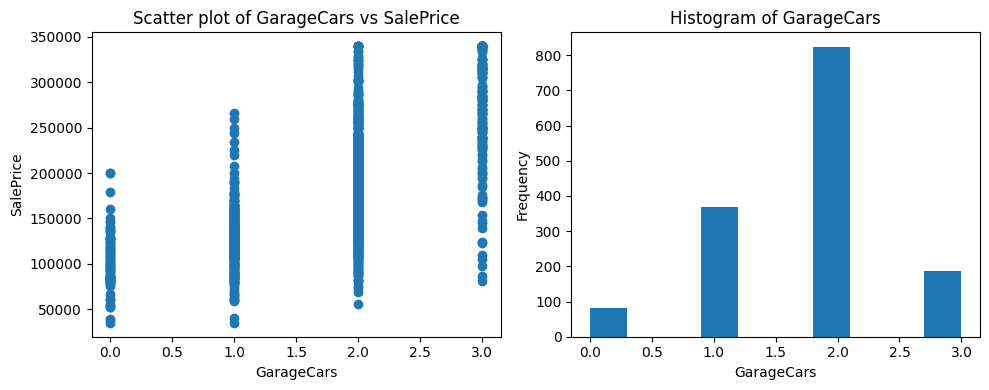

Pearson Correlation Fireplaces: 0.51

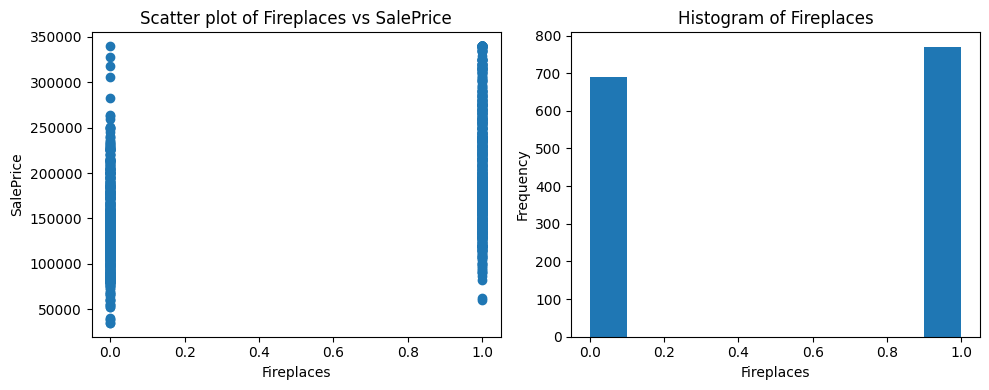

Pearson Correlation FullBath: 0.56

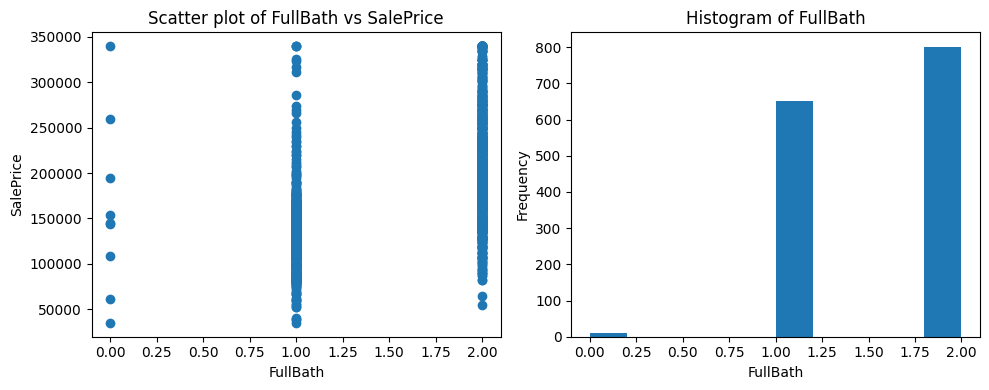

Pearson Correlation TotRmsAbvGrd: 0.54

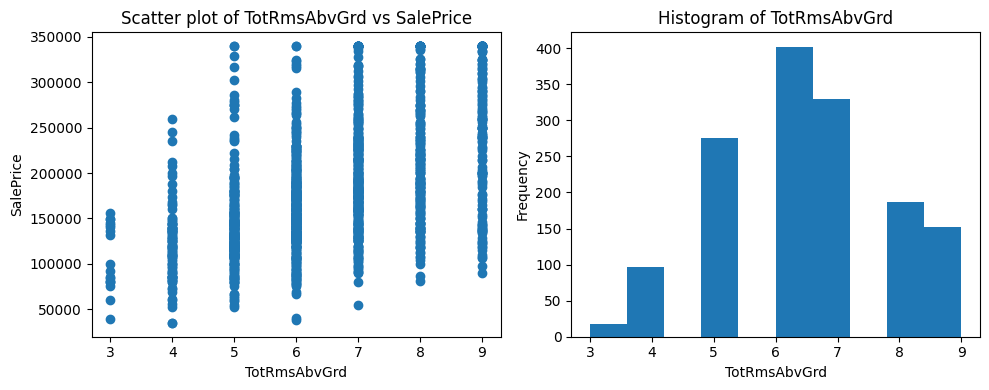

Pearson Correlation GrLivArea: 0.73

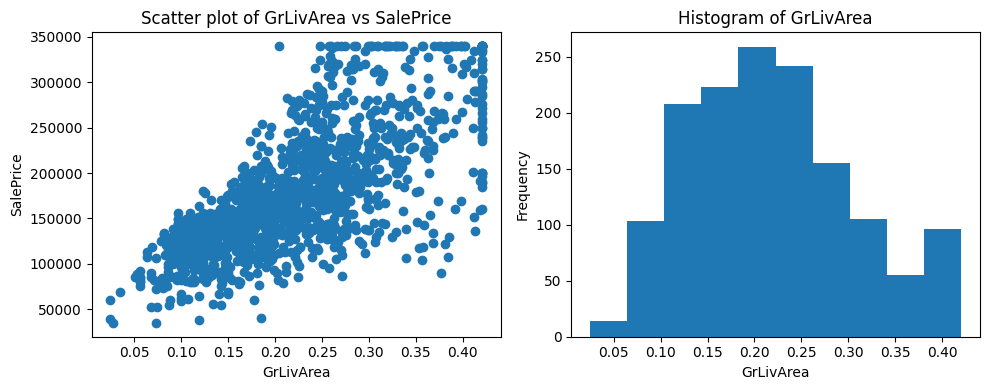

Pearson Correlation GarageArea: 0.67

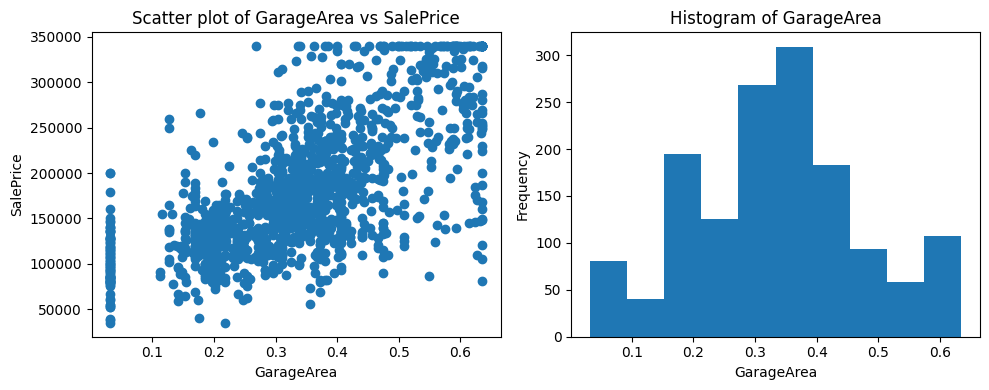

Pearson Correlation TotalBsmtSF: 0.65

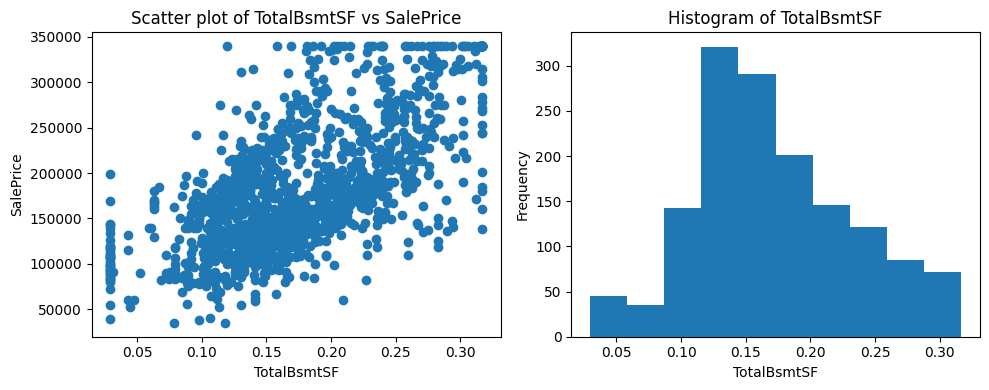

Pearson Correlation 1stFlrSF: 0.62

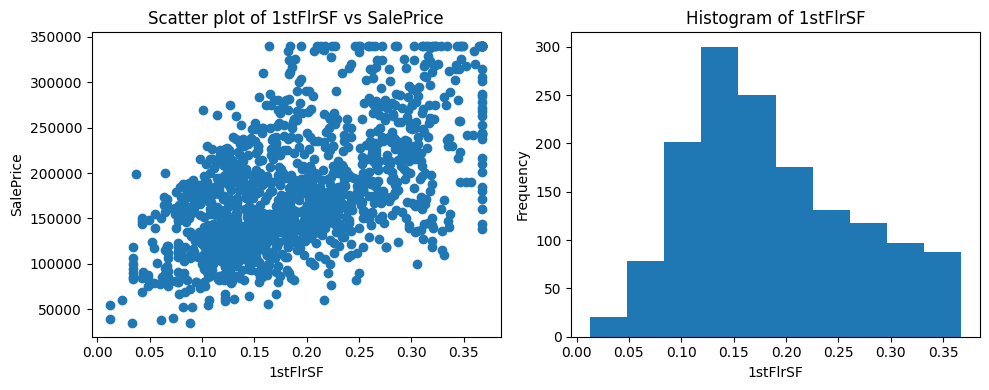

Pearson Correlation BsmtFinSF1: 0.38

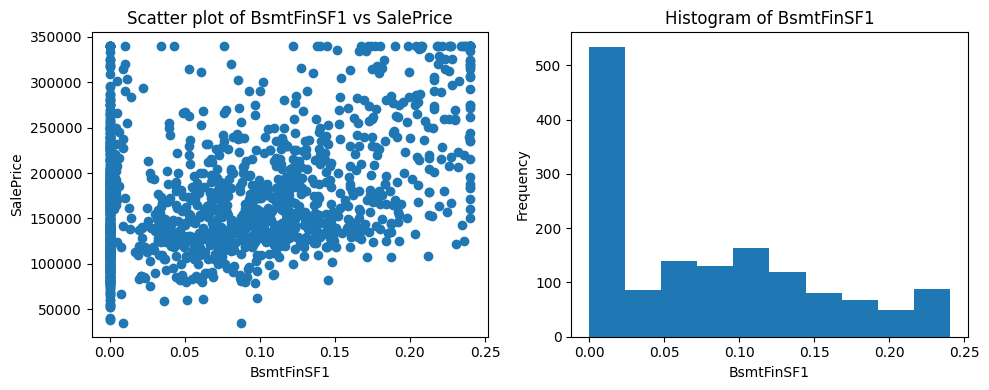

Pearson Correlation YearBuilt_age: -0.58

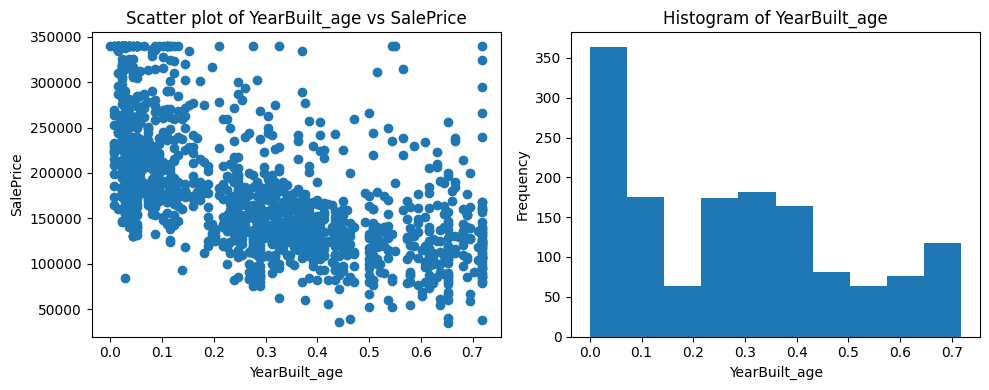

Pearson Correlation YearRemodAdd_age: -0.55

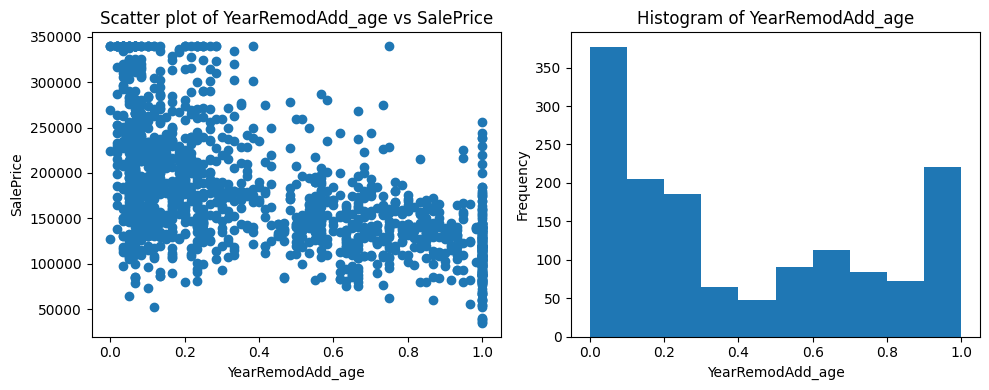

Pearson Correlation GarageYrBlt_age: -0.51

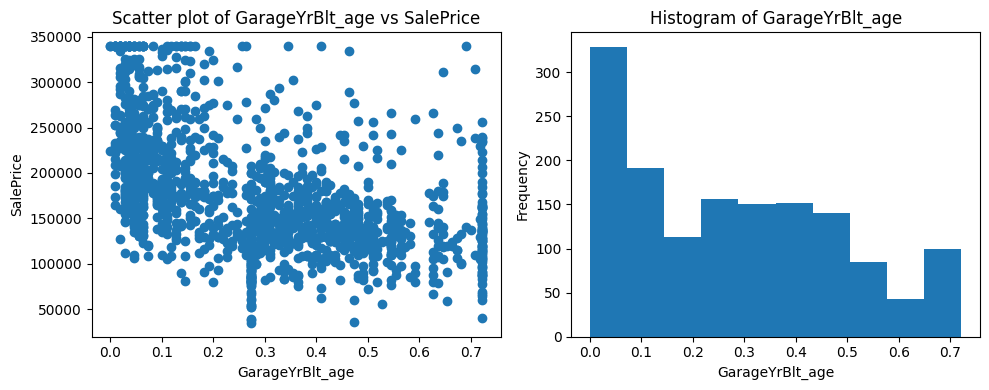

Pearson Correlation MasVnrArea: 0.45

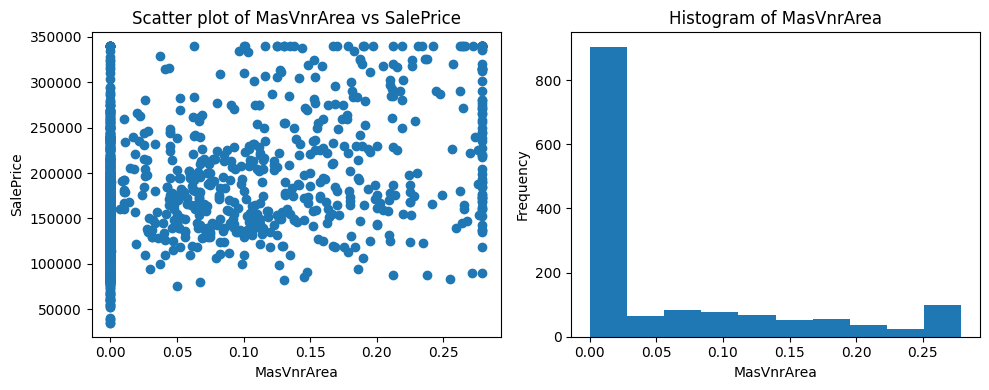

Pearson Correlation LotArea: 0.42

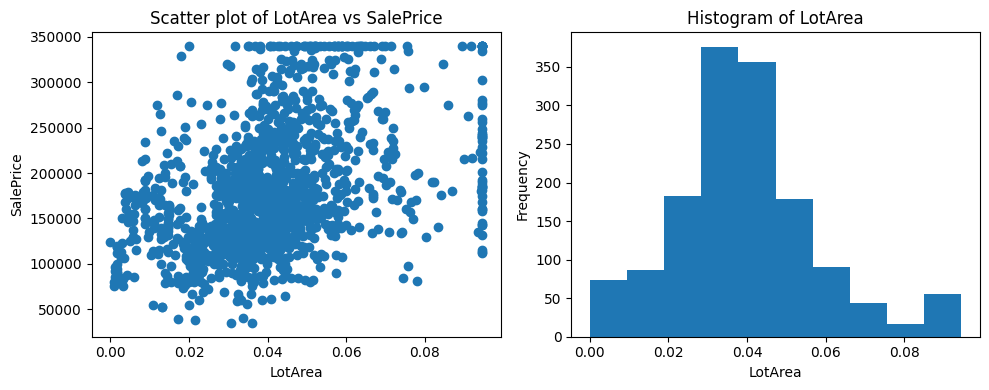

Pearson Correlation LotFrontage: 0.37

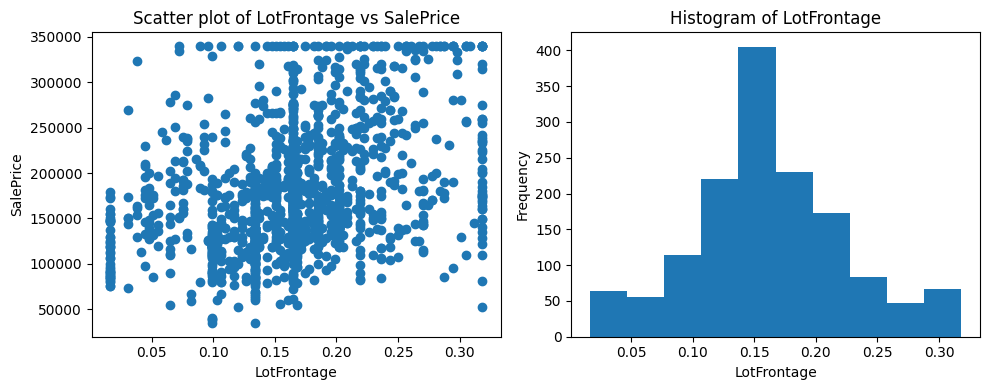

Pearson Correlation OverallQual: 0.82

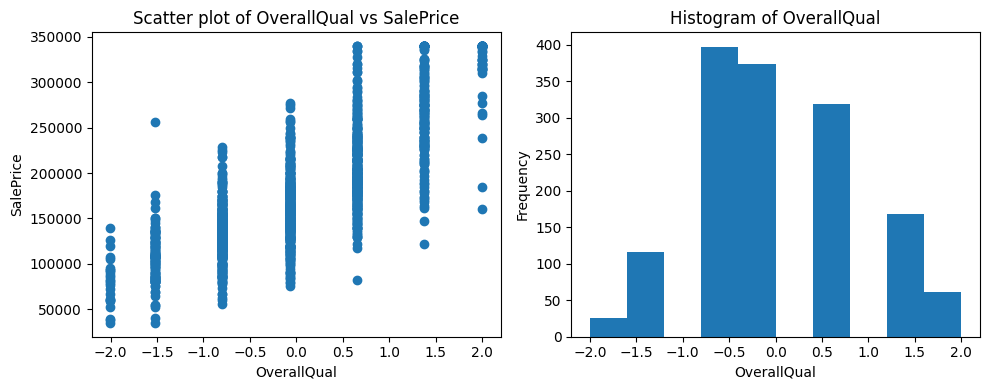

Pearson Correlation ExterQual: 0.69

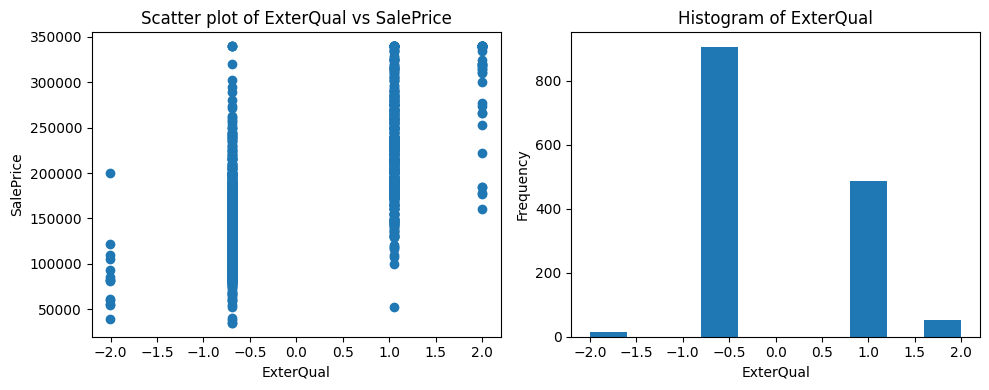

Pearson Correlation HeatingQC: 0.46

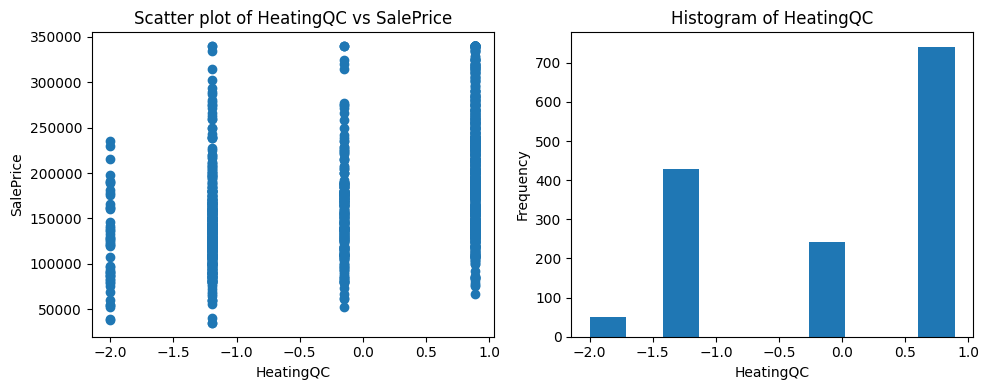

Pearson Correlation BsmtFinType1_GLQ: 0.46

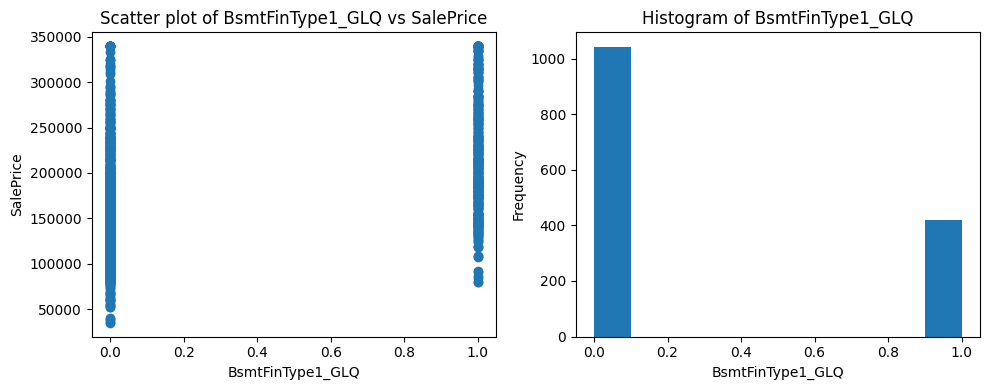

Pearson Correlation BsmtFinType1_ALQ: -0.11

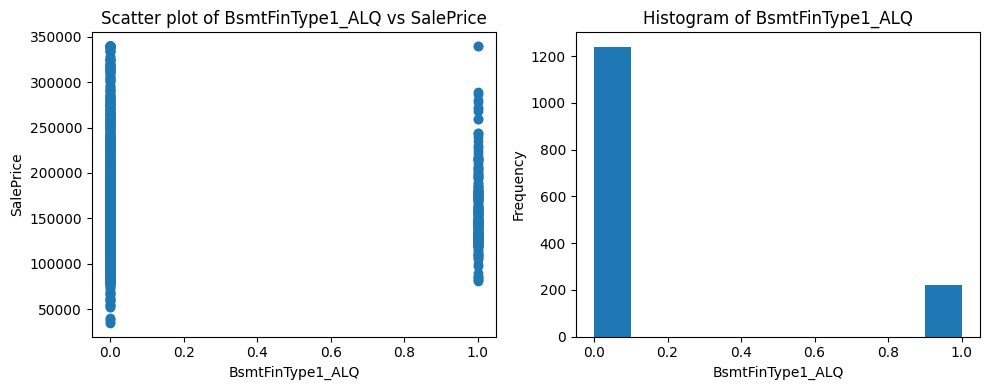

Pearson Correlation BsmtFinType1_BLQ: -0.14

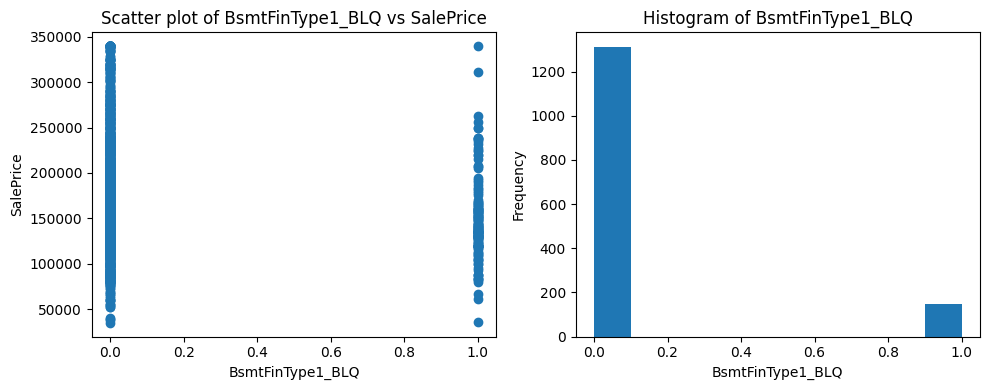

Pearson Correlation BsmtFinType1_Rec: -0.14

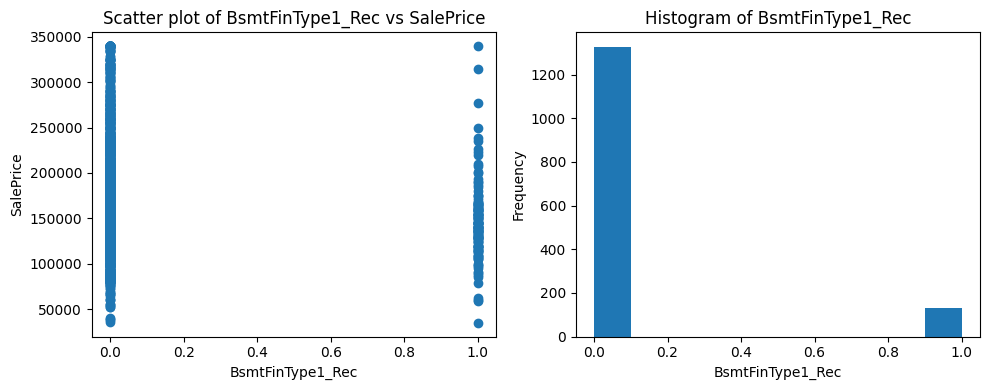

Pearson Correlation BsmtFinType1_LwQ: -0.09

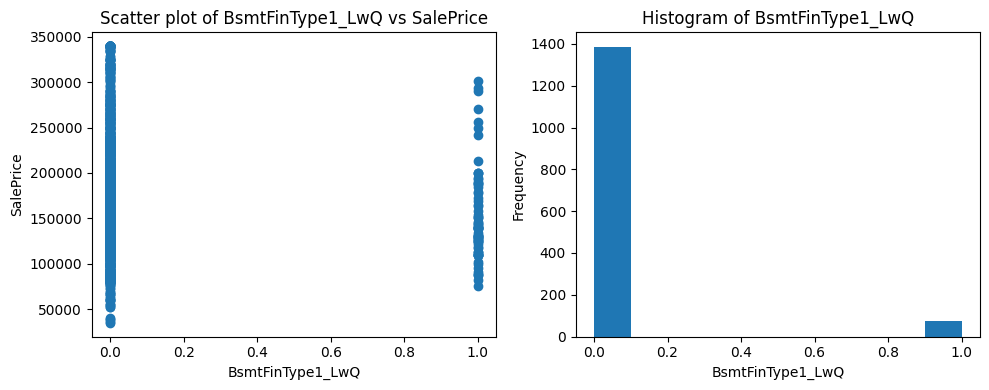

Pearson Correlation BsmtFinType1_Unf: -0.08

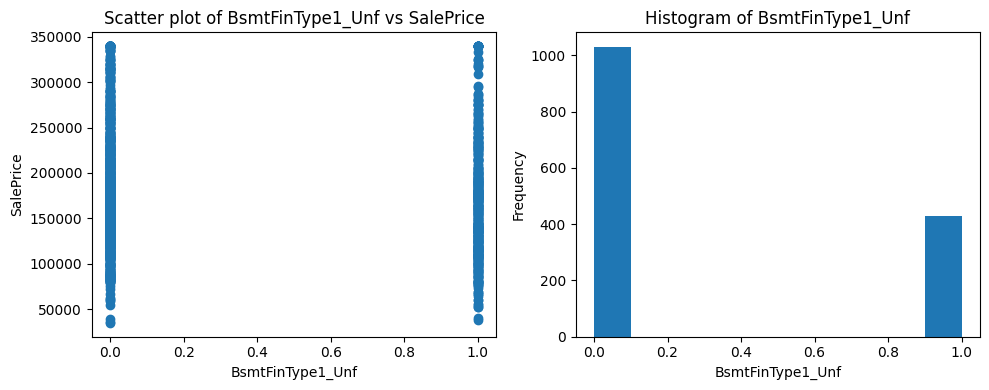

Pearson Correlation HouseStyle_1Story: -0.06

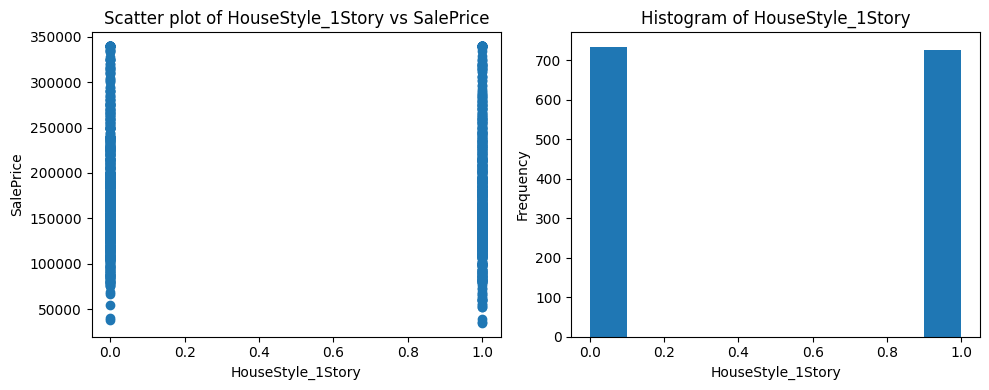

Pearson Correlation HouseStyle_1.5Fin: -0.18

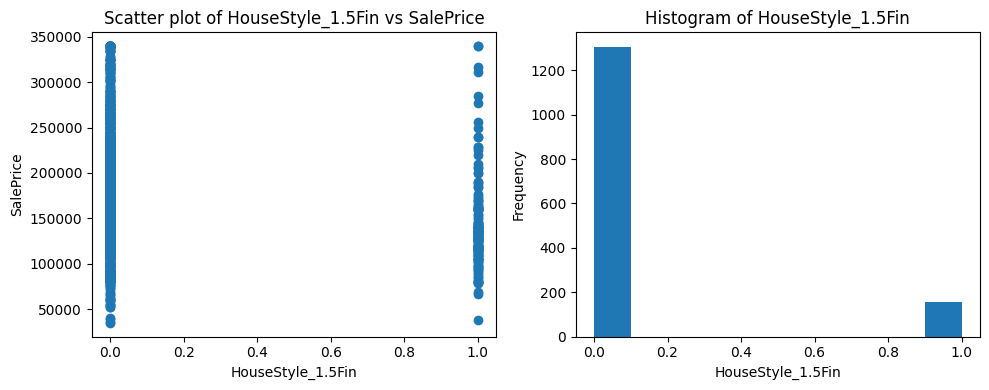

Pearson Correlation HouseStyle_1.5Unf: -0.10

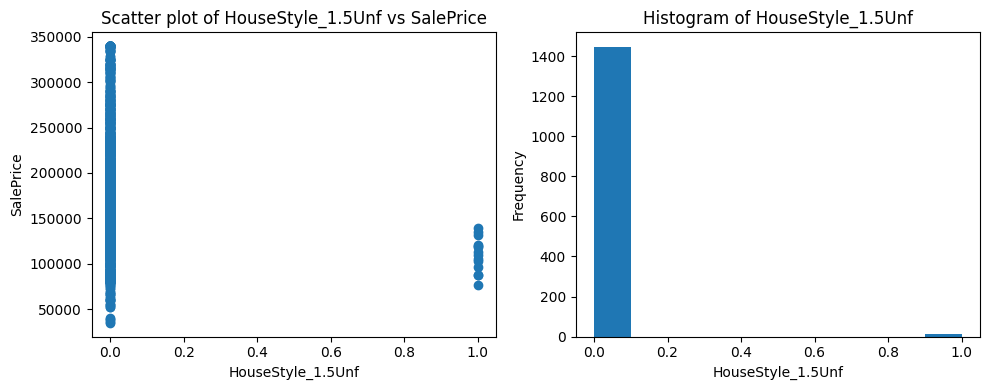

Pearson Correlation HouseStyle_2Story: 0.26

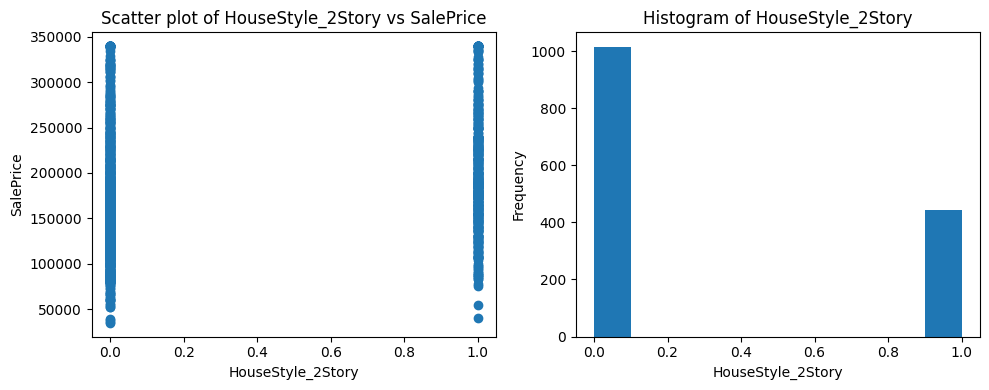

Pearson Correlation HouseStyle_2.5Fin: 0.03

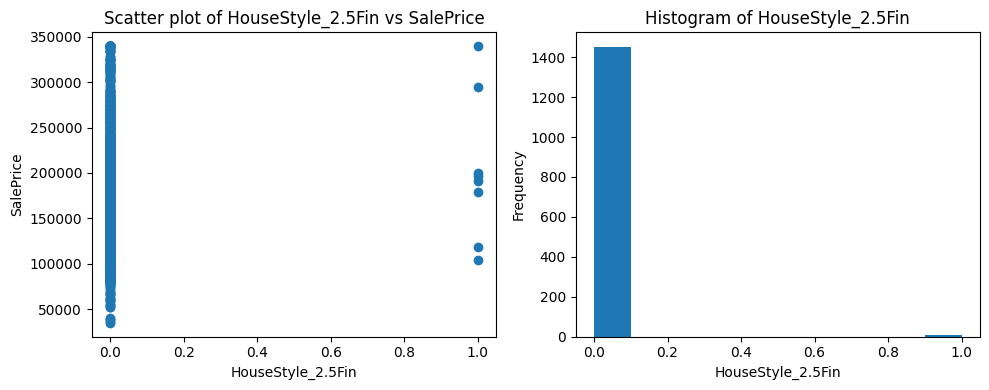

Pearson Correlation HouseStyle_2.5Unf: -0.03

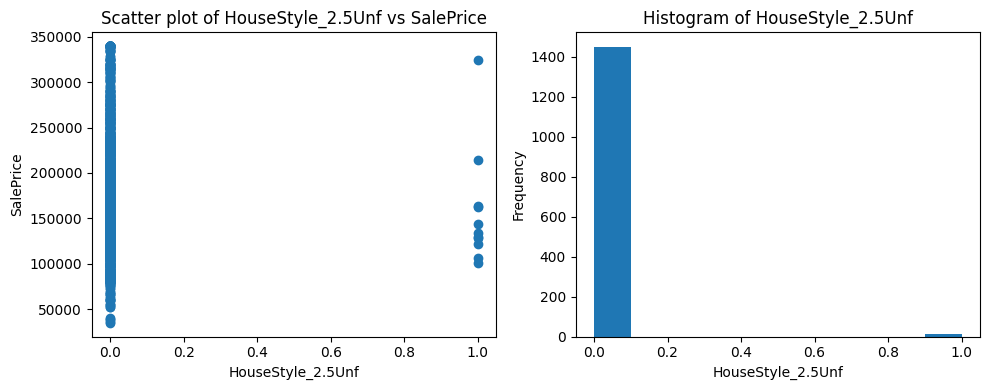

Pearson Correlation HouseStyle_SFoyer: -0.10

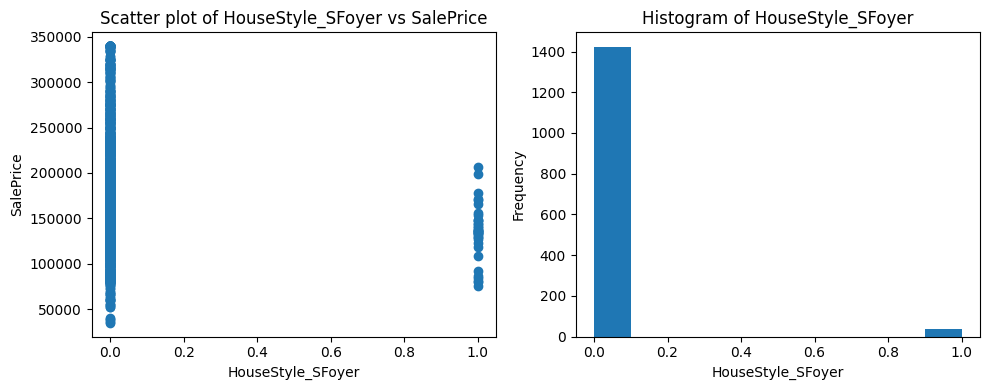

Pearson Correlation HouseStyle_SLvl: -0.03

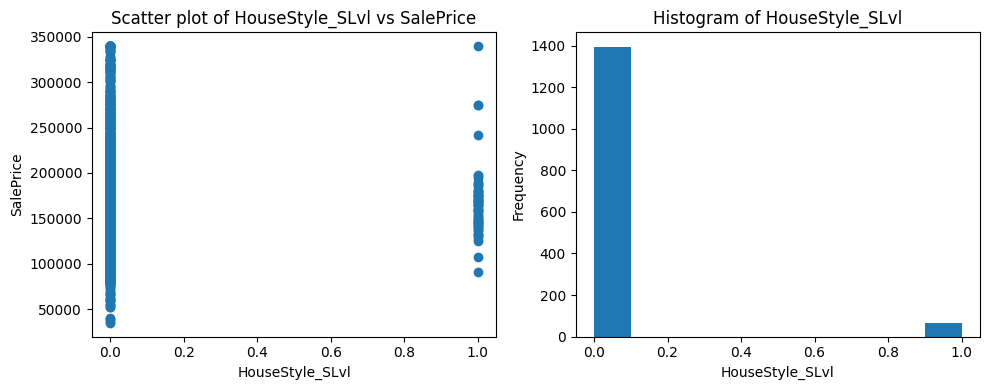

Pearson Correlation Foundation_BrkTil: -0.23

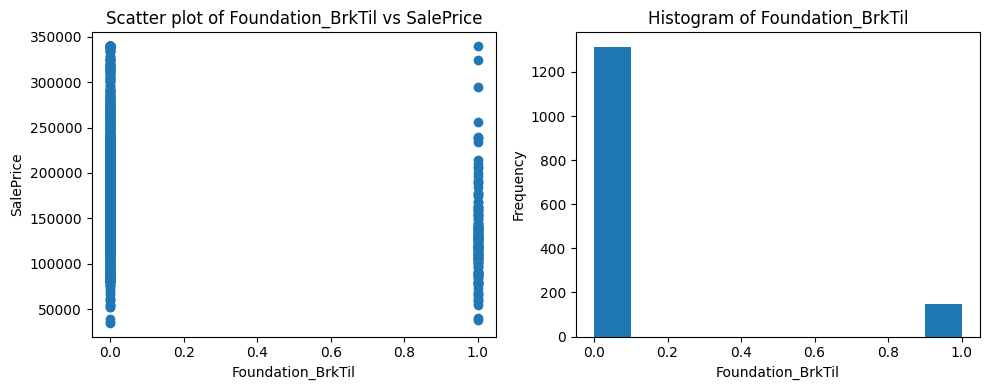

Pearson Correlation Foundation_CBlock: -0.36

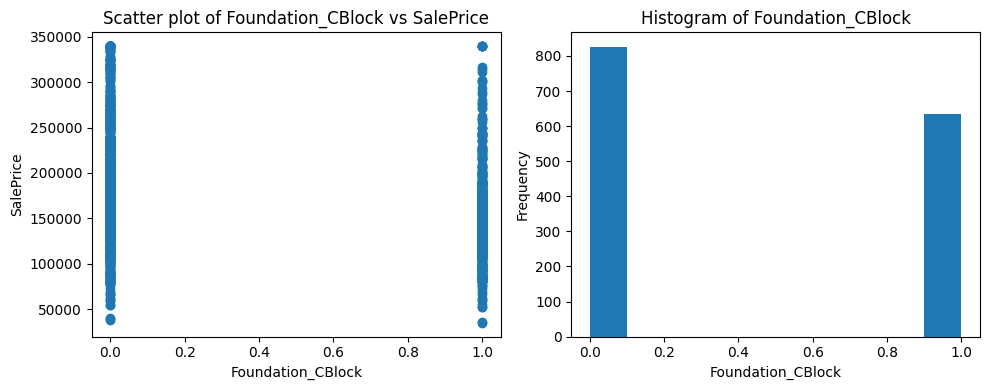

Pearson Correlation Foundation_PConc: 0.54

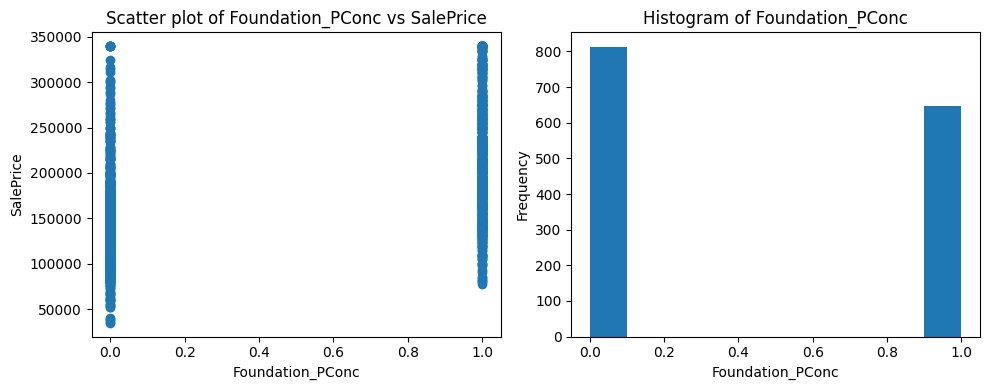

Pearson Correlation Foundation_Slab: -0.13

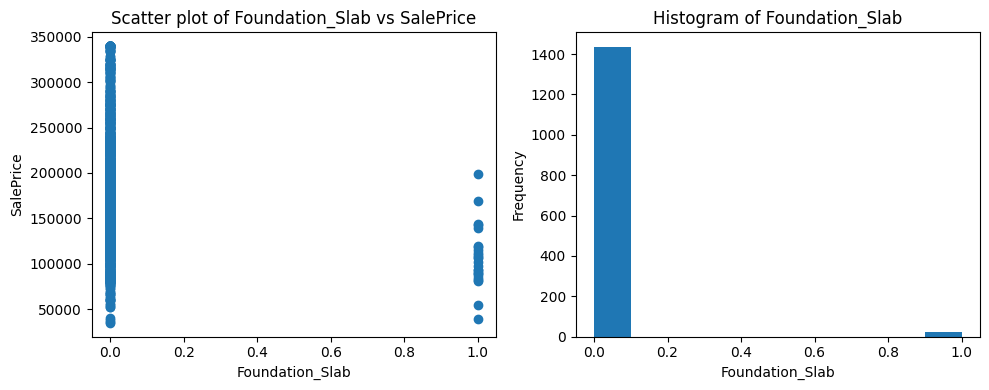

Pearson Correlation Foundation_Stone: -0.01

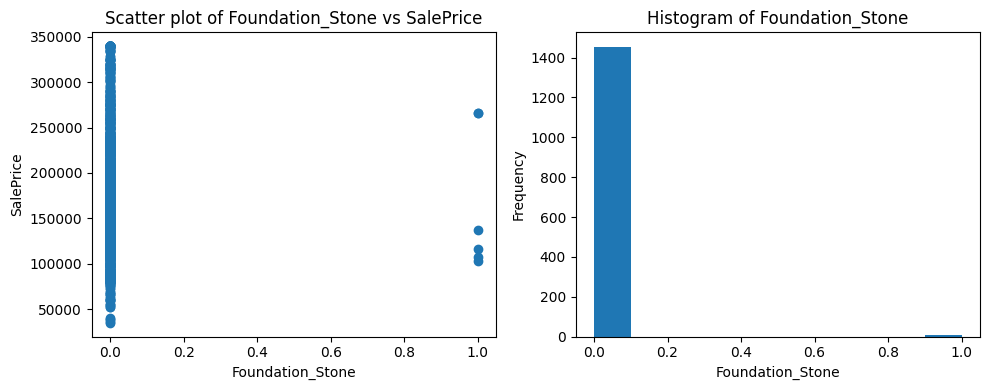

Pearson Correlation Foundation_Wood: 0.01

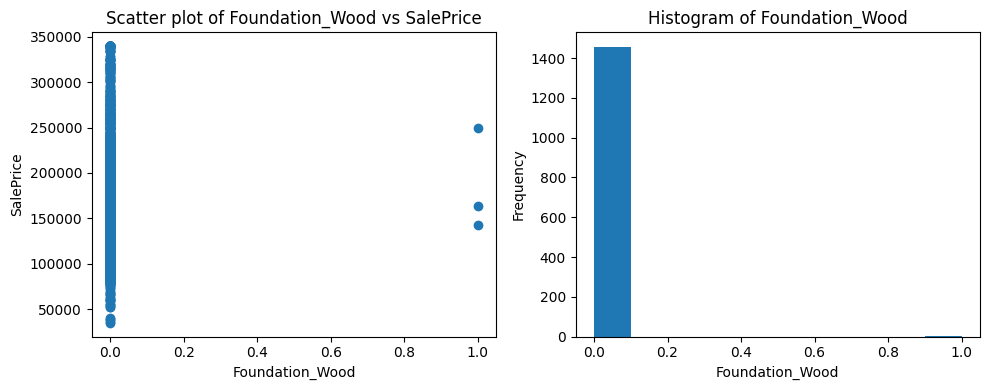

Pearson Correlation LotShape_Reg: -0.28

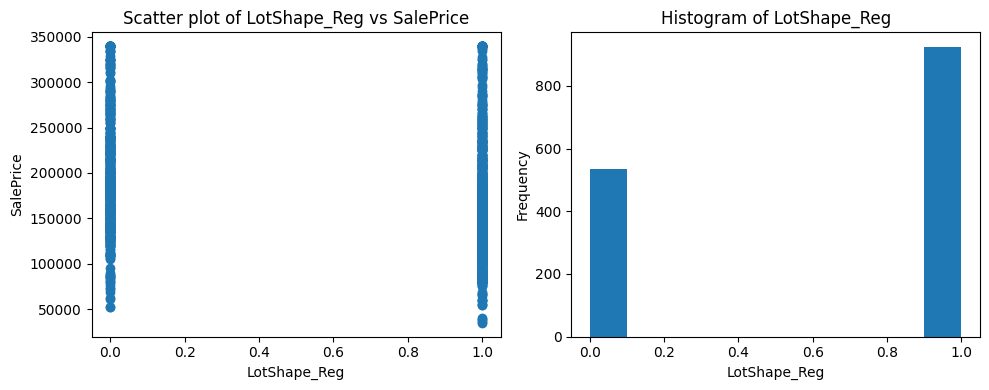

Pearson Correlation LotShape_IR1: 0.24

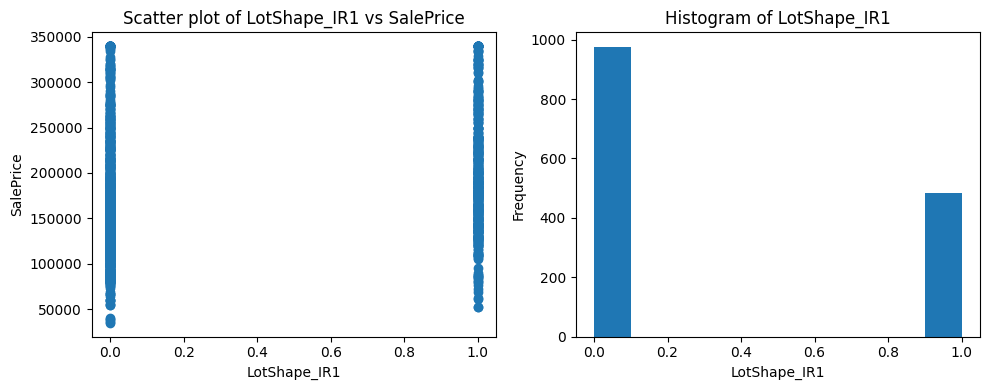

Pearson Correlation LotShape_IR2: 0.12

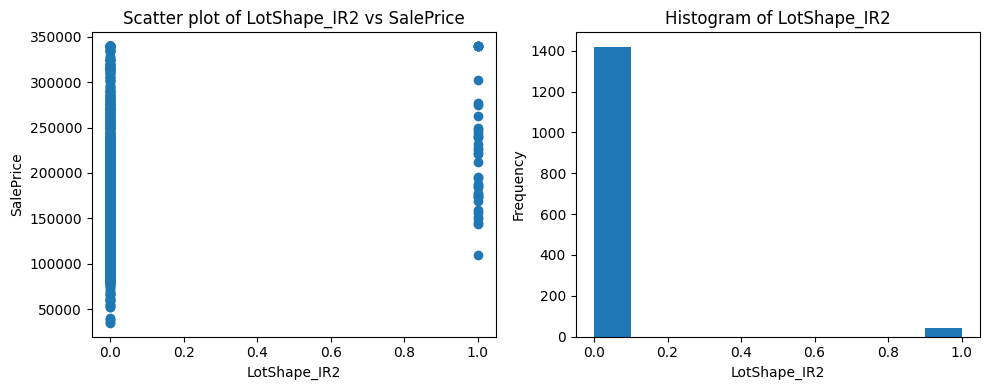

Pearson Correlation LotShape_IR3: 0.04

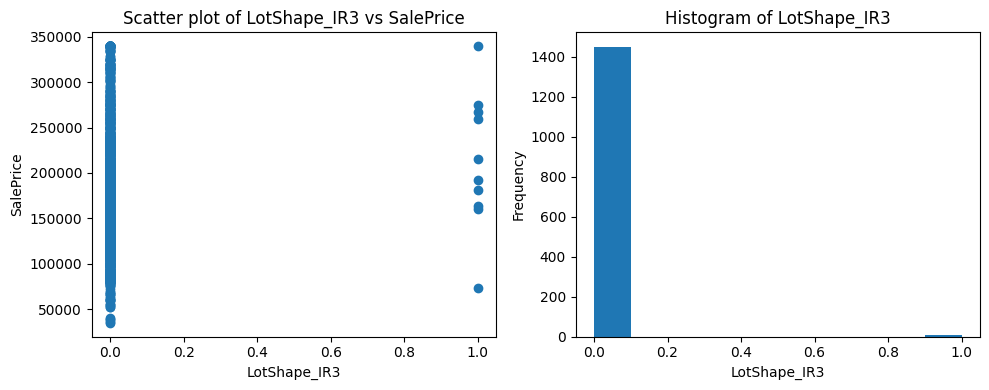

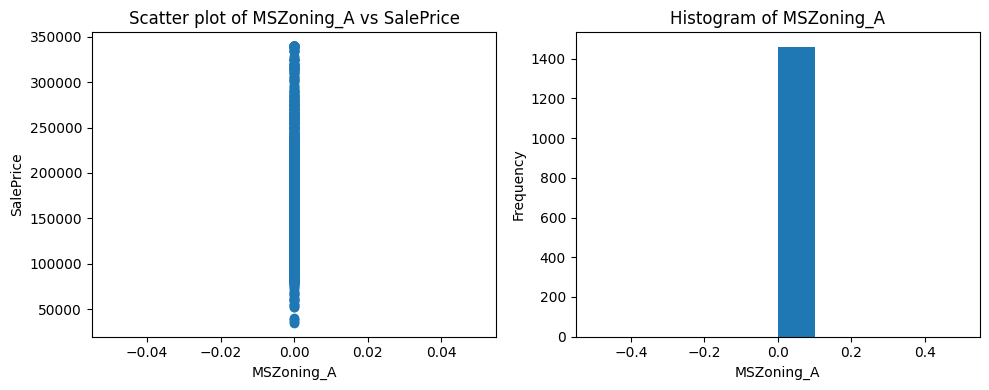

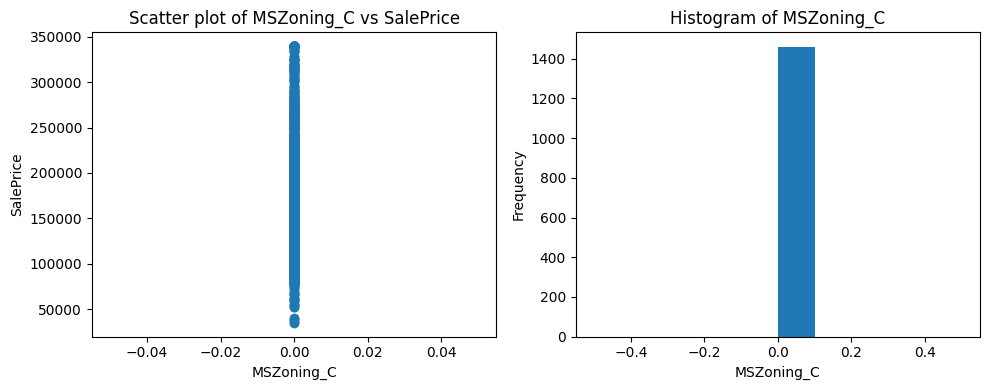

Pearson Correlation MSZoning_FV: 0.12

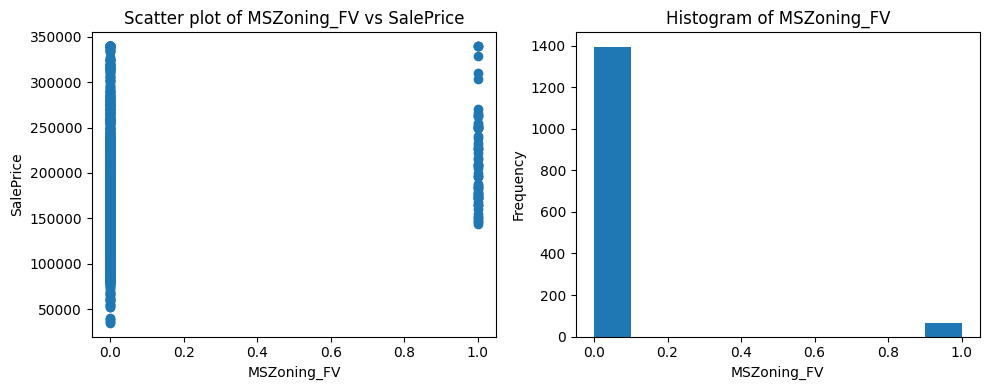

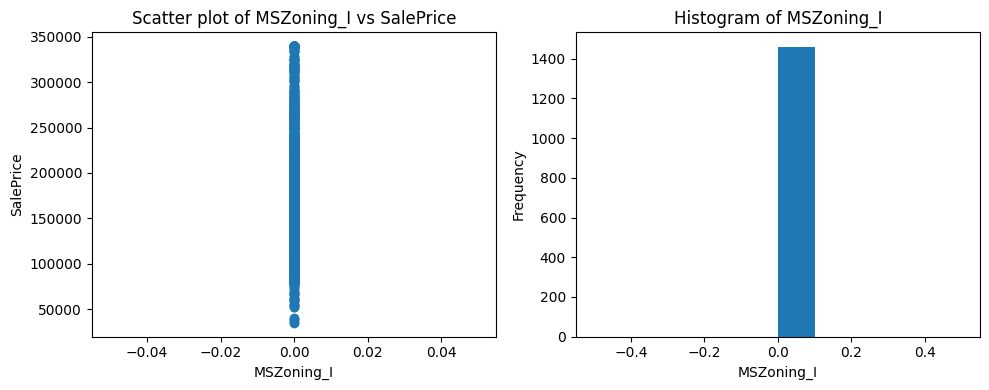

Pearson Correlation MSZoning_RH: -0.07

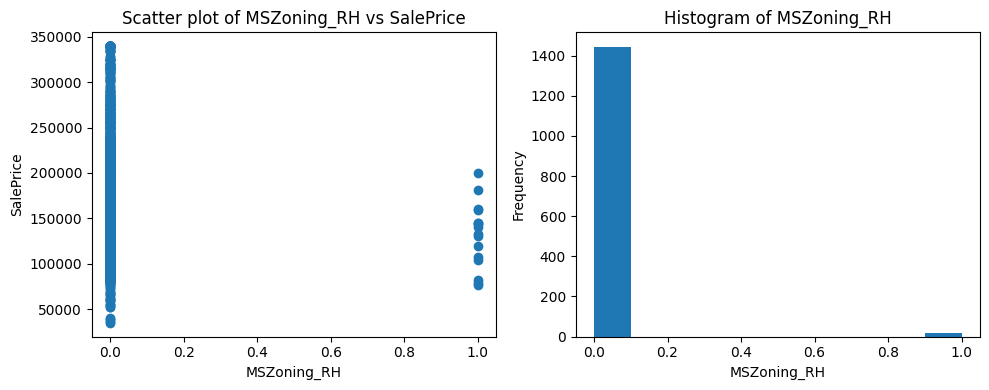

Pearson Correlation MSZoning_RL: 0.27

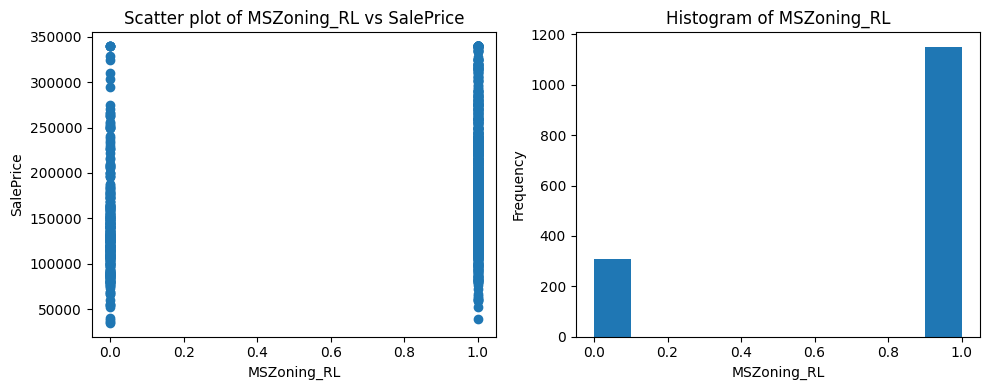

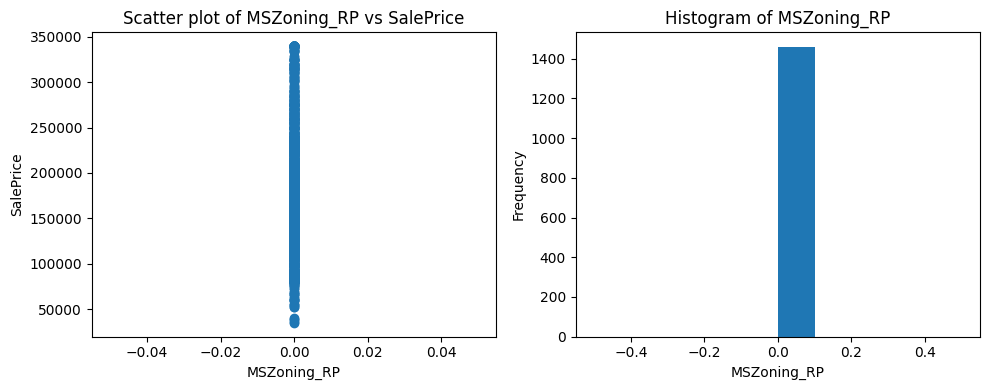

Pearson Correlation MSZoning_RM: -0.32

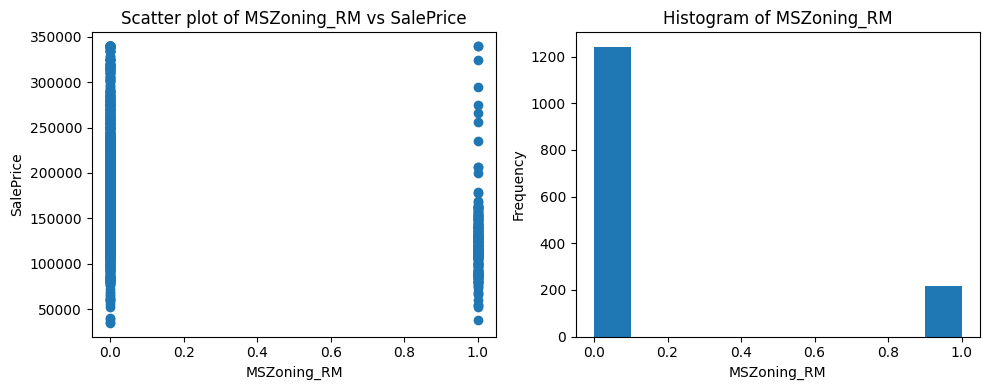

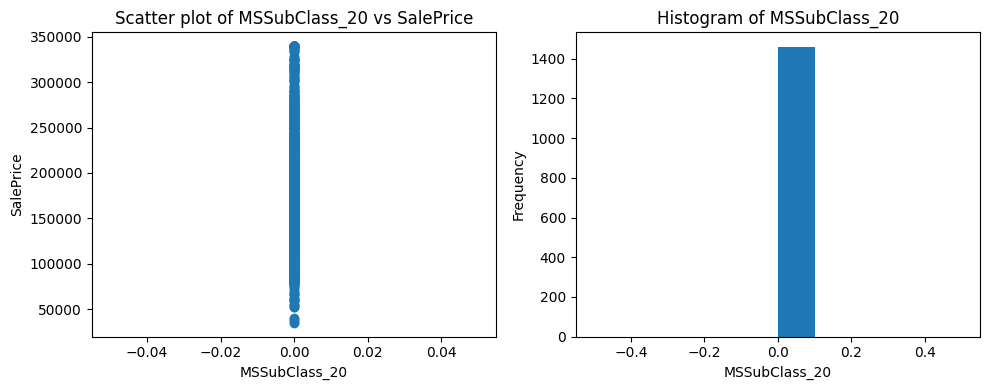

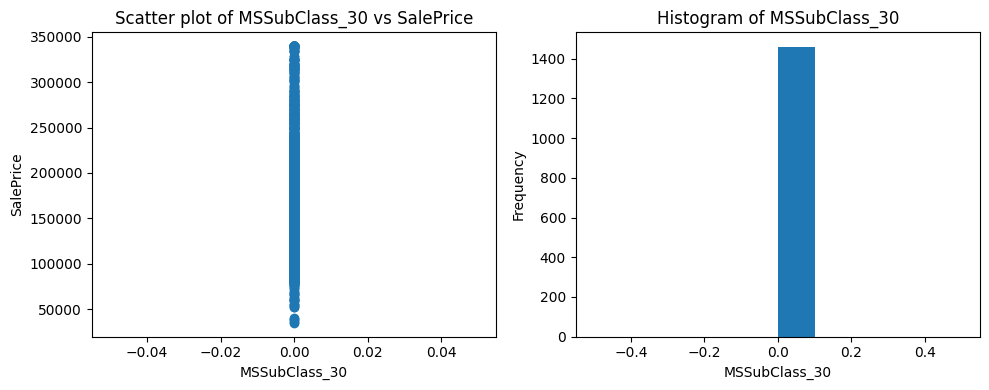

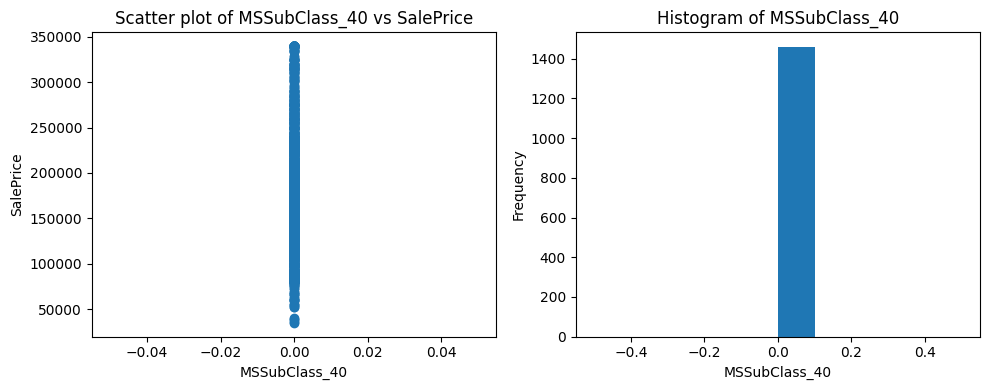

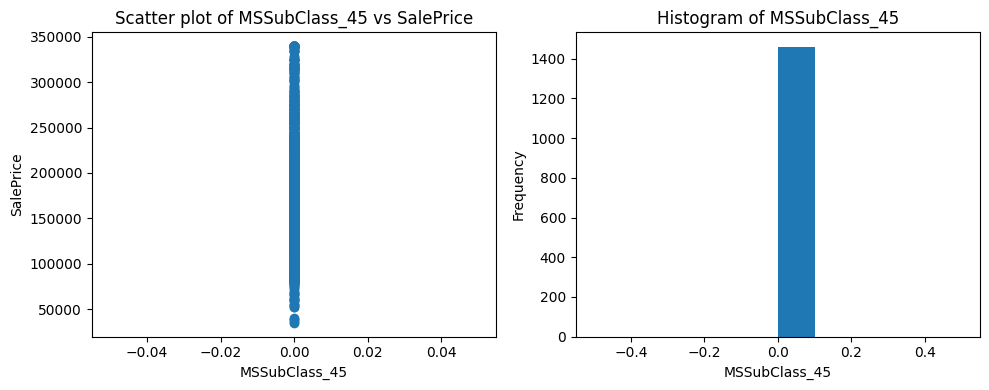

...

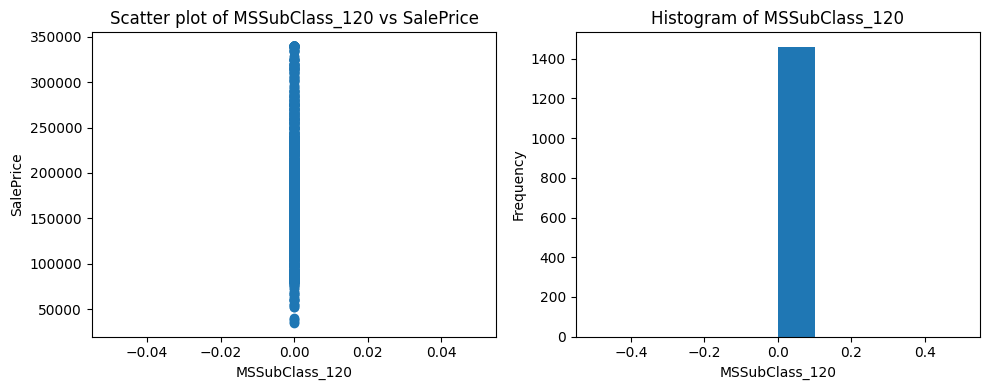

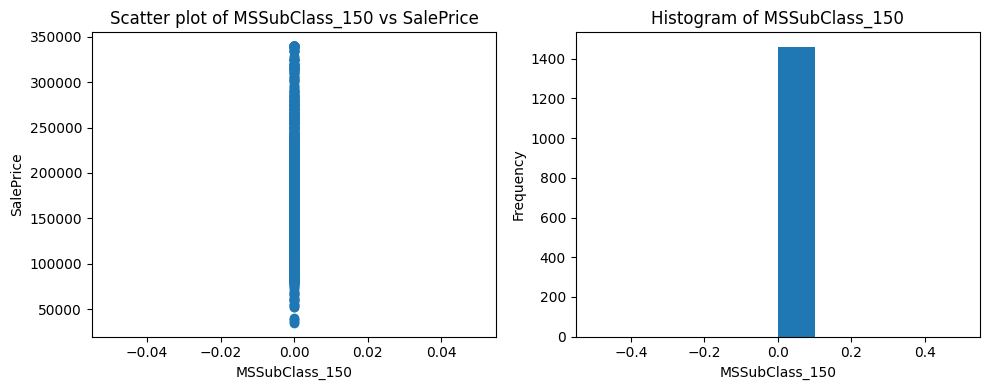

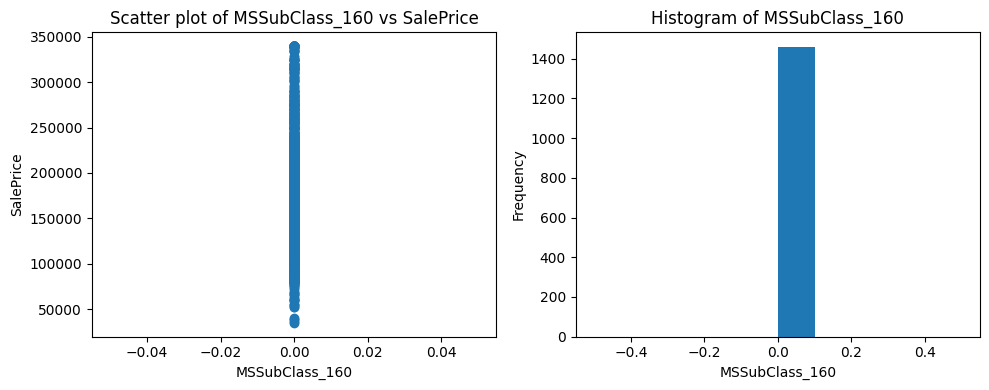

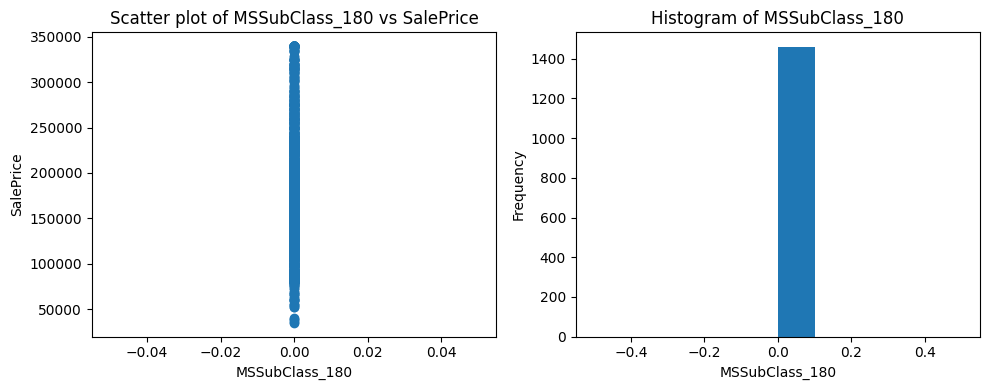

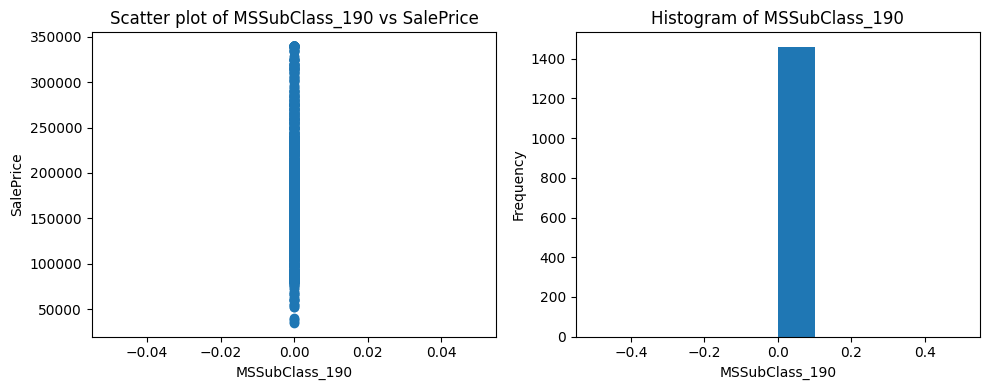

Pearson Correlation Neighborhood_Blmngtn: 0.03

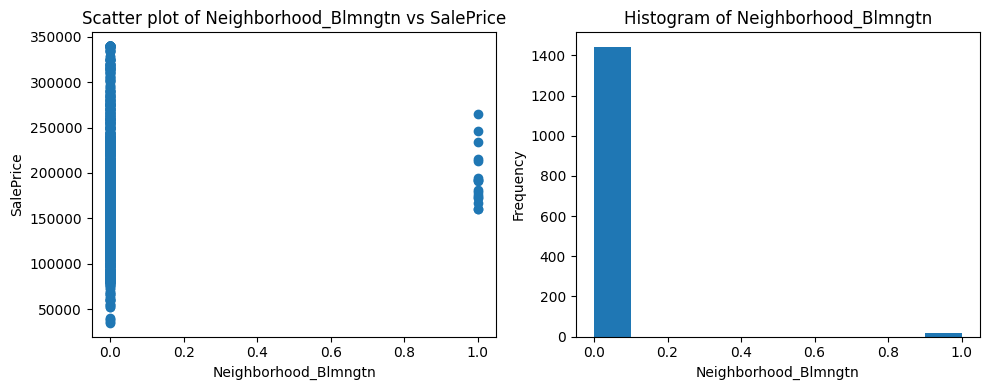

Pearson Correlation Neighborhood_Blueste: -0.02

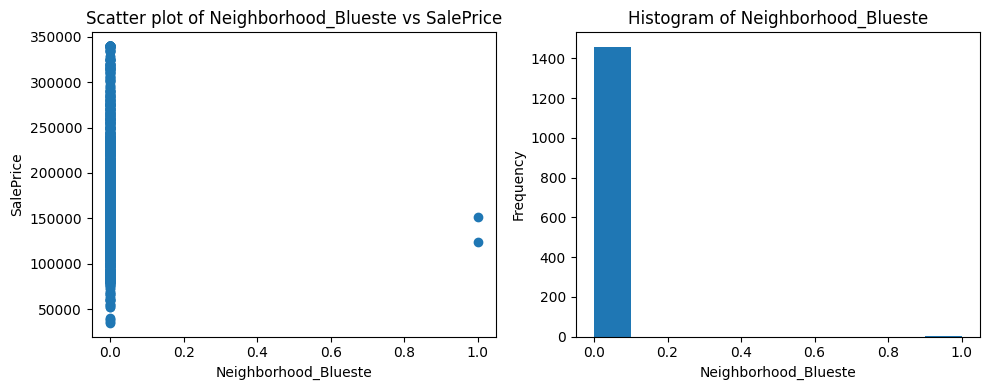

Pearson Correlation Neighborhood_BrDale: -0.11

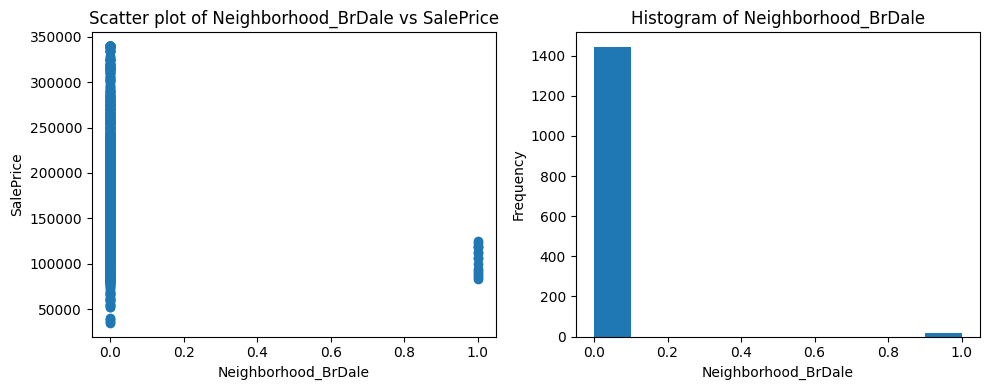

Pearson Correlation Neighborhood_BrkSide: -0.16

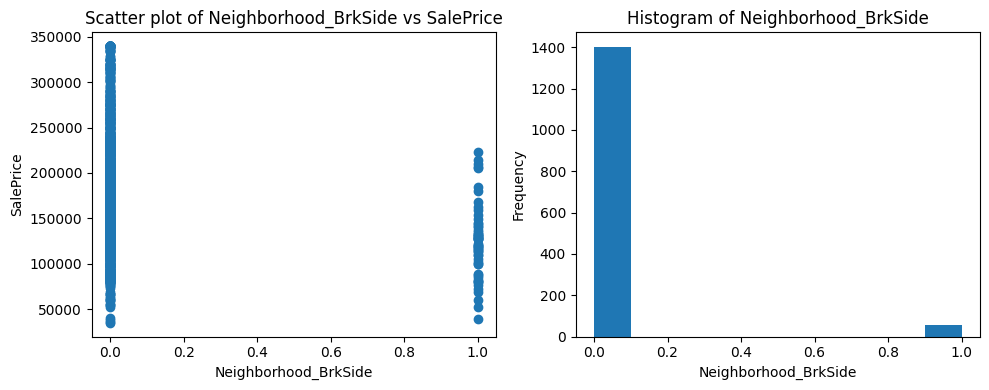

Pearson Correlation Neighborhood_ClearCr: 0.07

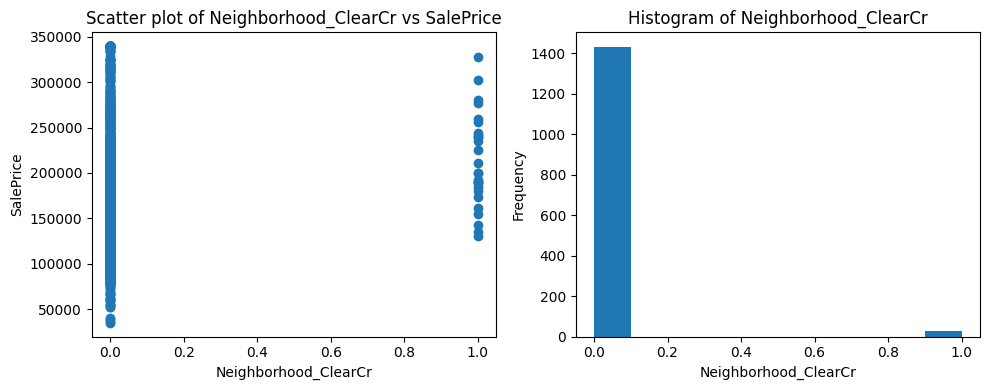

Pearson Correlation Neighborhood_CollgCr: 0.10

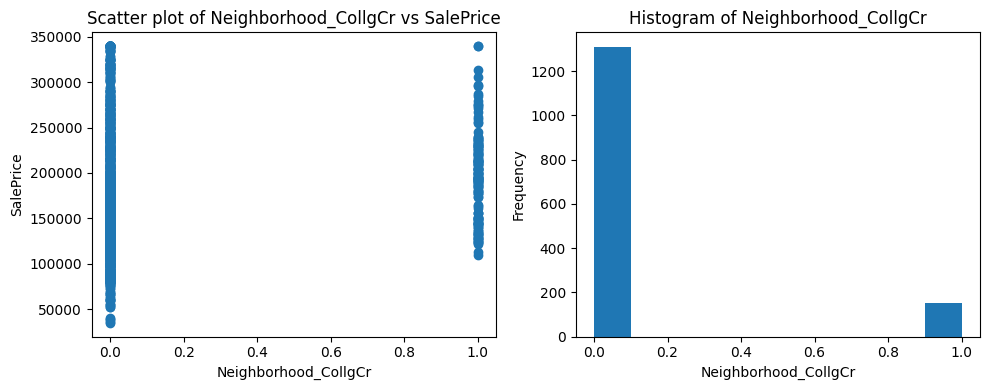

Pearson Correlation Neighborhood_Crawfor: 0.09

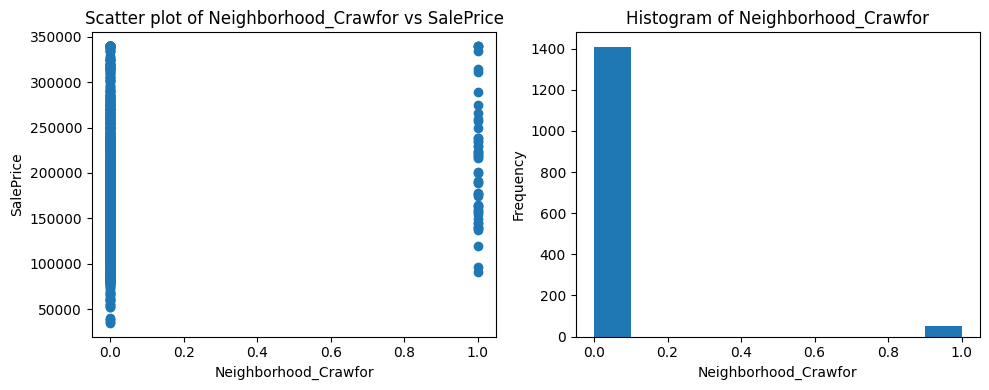

Pearson Correlation Neighborhood_Edwards: -0.20

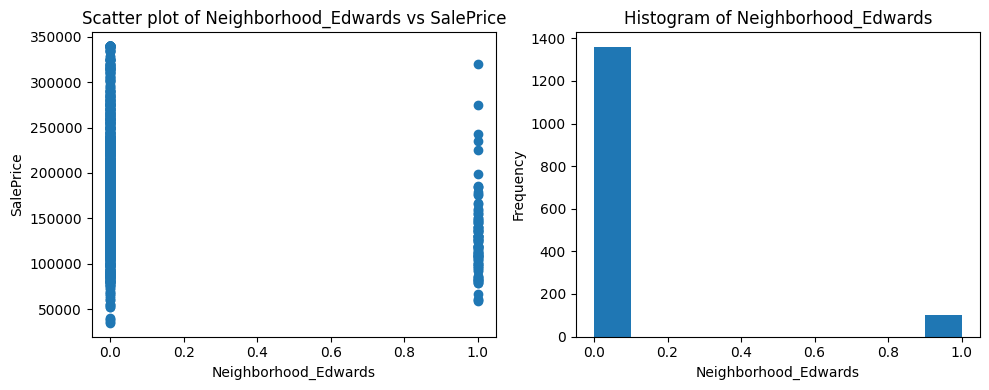

Pearson Correlation Neighborhood_Gilbert: 0.05

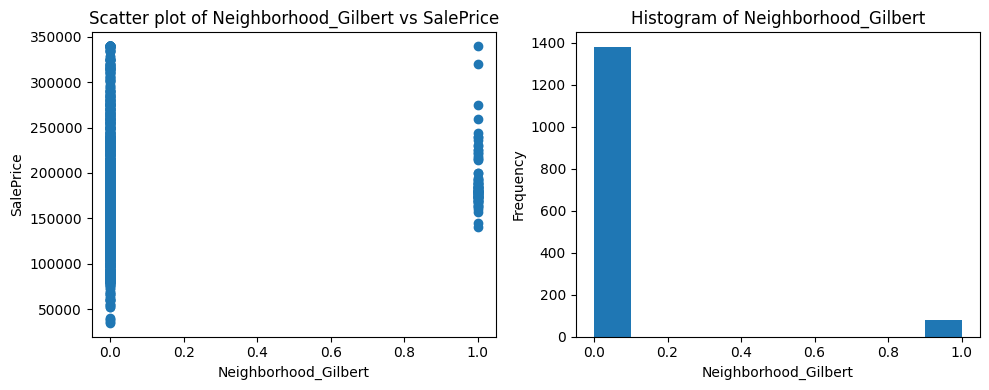

Pearson Correlation Neighborhood_IDOTRR: -0.19

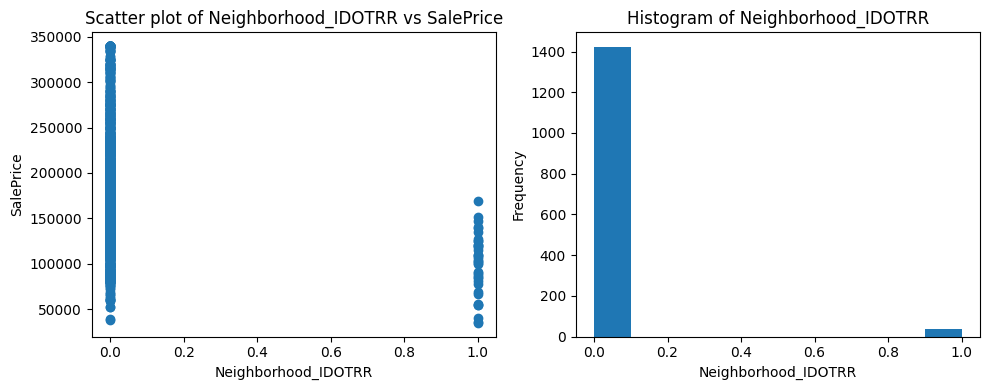

Pearson Correlation Neighborhood_MeadowV: -0.13

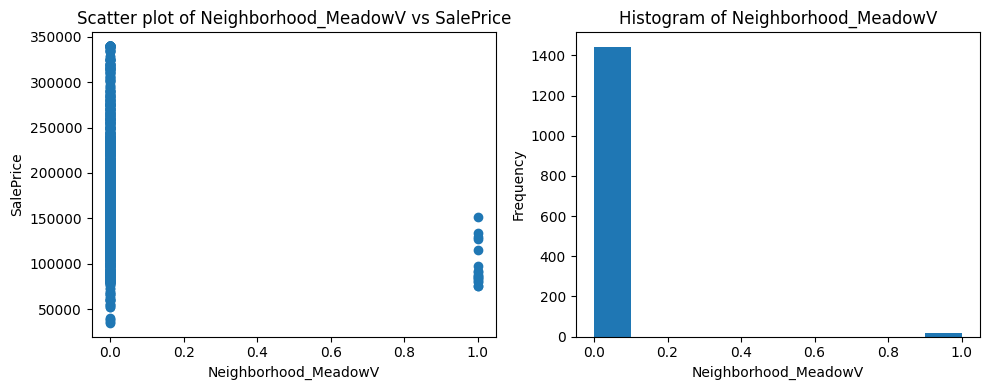

Pearson Correlation Neighborhood_Mitchel: -0.06

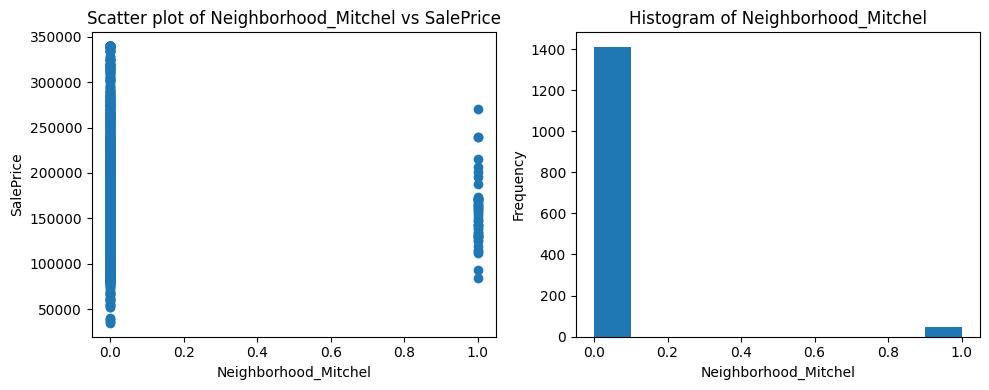

Pearson Correlation Neighborhood_NAmes: -0.20

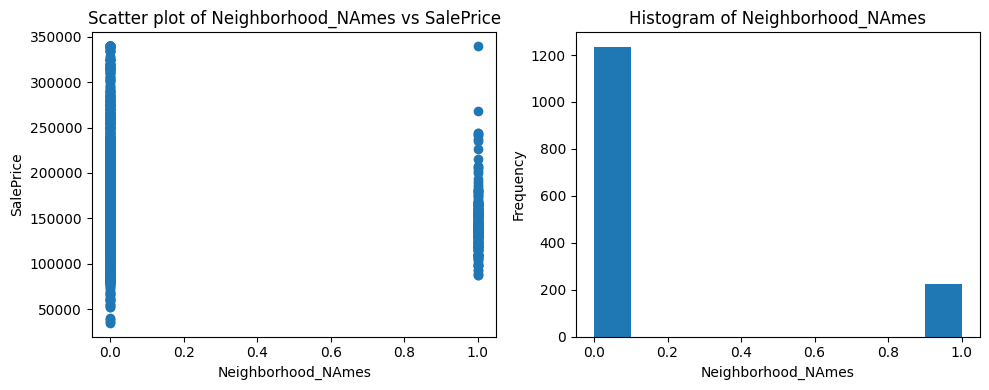

Pearson Correlation Neighborhood_NoRidge: 0.30

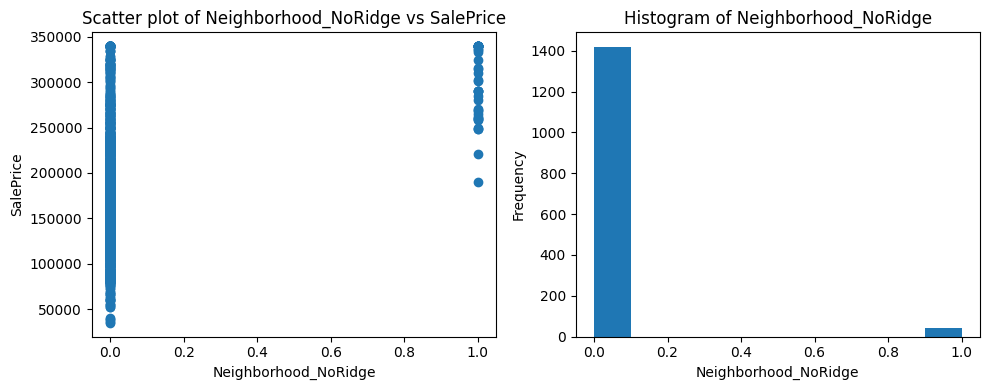

Pearson Correlation Neighborhood_NPkVill: -0.04

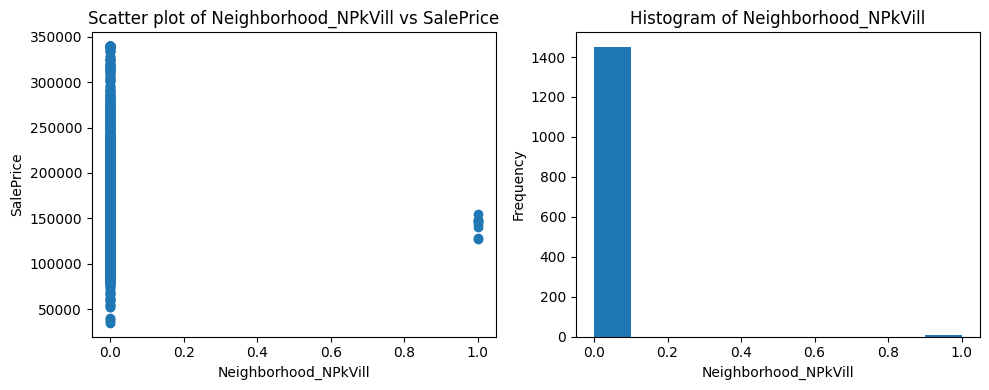

Pearson Correlation Neighborhood_NridgHt: 0.39

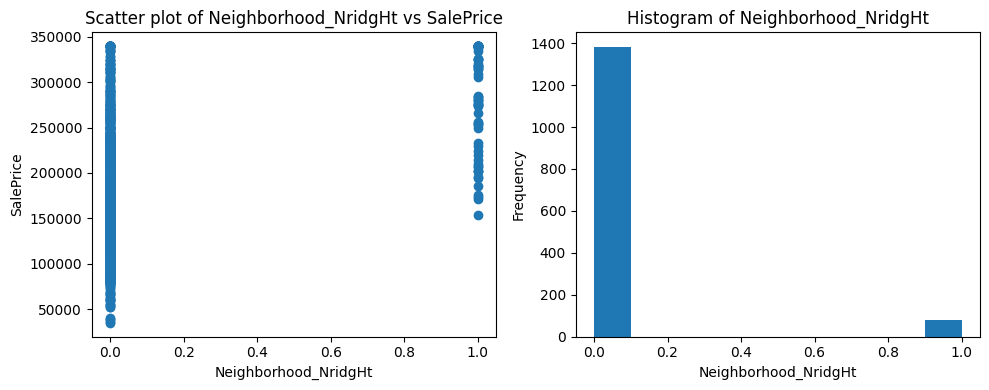

Pearson Correlation Neighborhood_NWAmes: 0.04

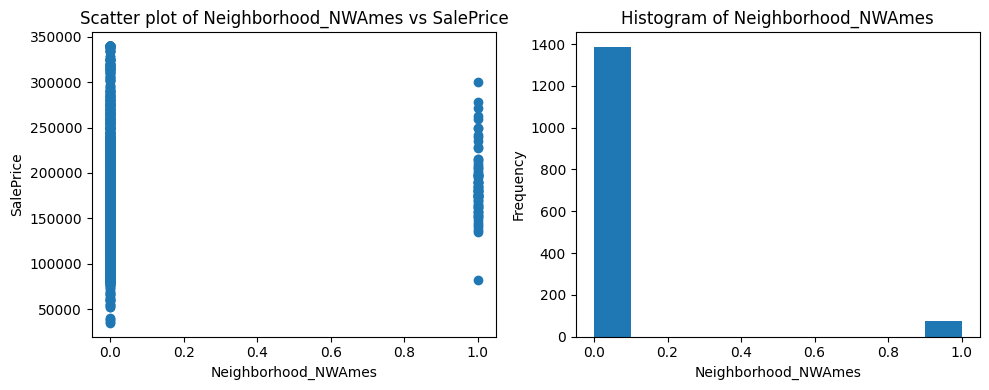

Pearson Correlation Neighborhood_OldTown: -0.22

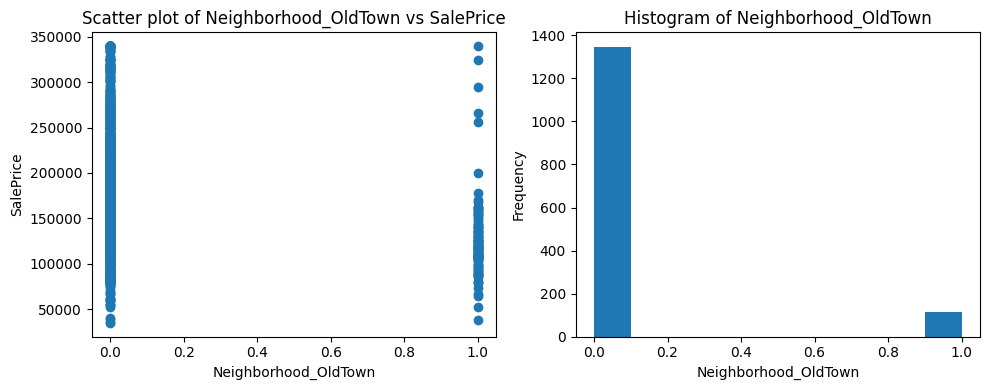

Pearson Correlation Neighborhood_SWISU: -0.07

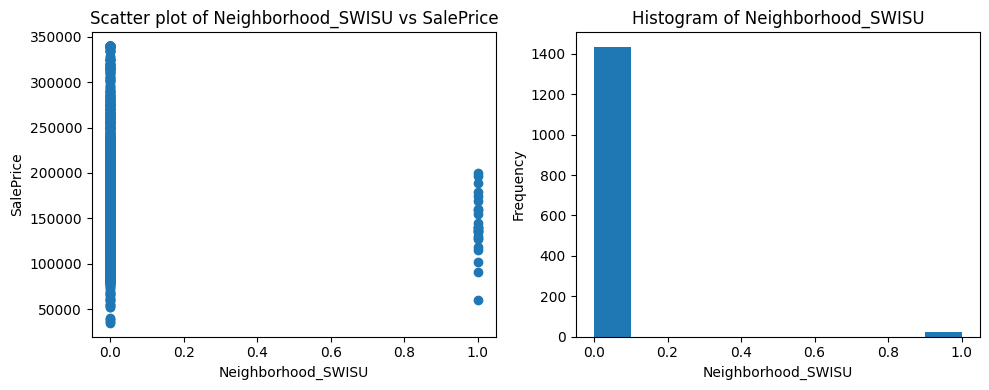

Pearson Correlation Neighborhood_Sawyer: -0.14

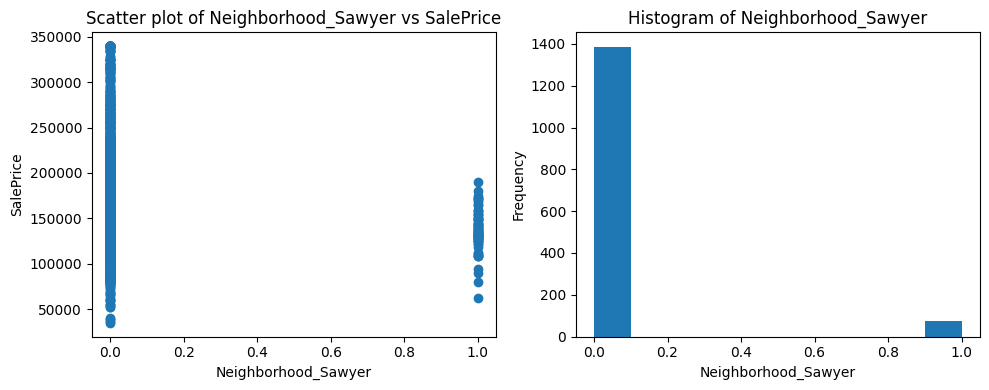

Pearson Correlation Neighborhood_SawyerW: 0.03

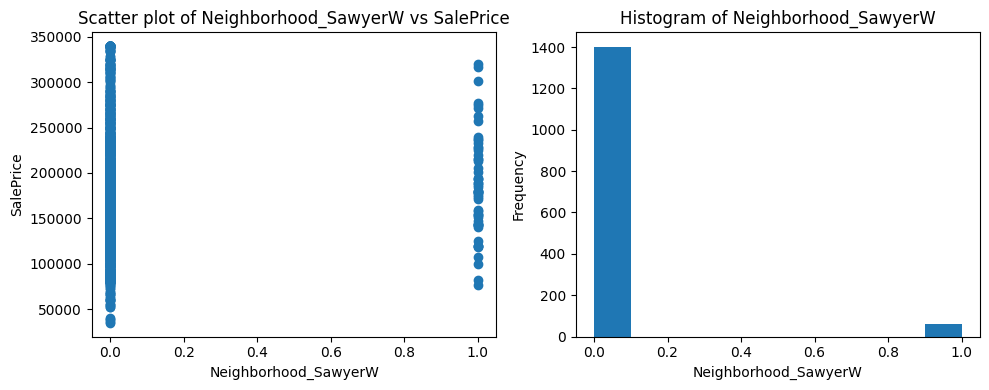

Pearson Correlation Neighborhood_Somerst: 0.17

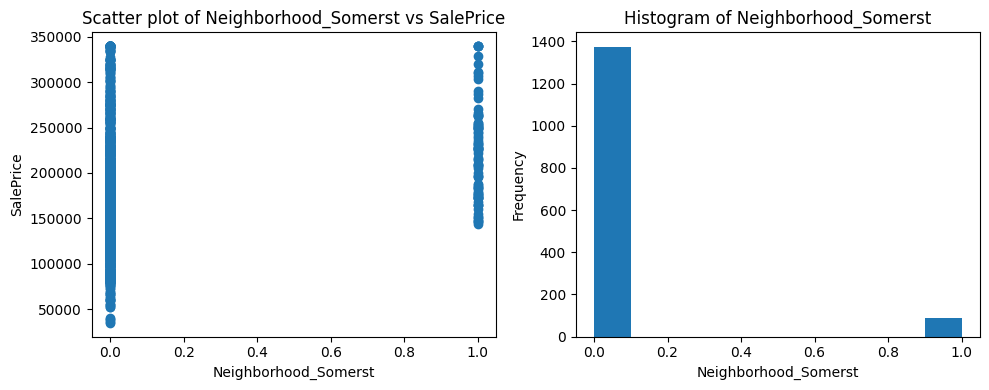

Pearson Correlation Neighborhood_StoneBr: 0.19

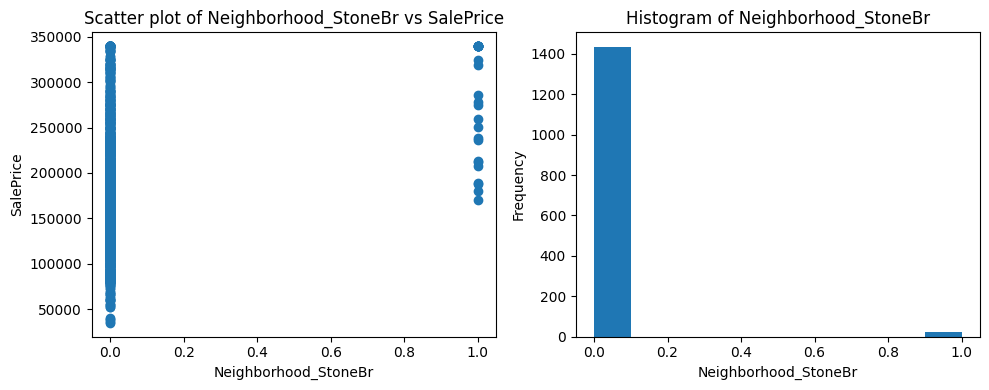

Pearson Correlation Neighborhood_Timber: 0.15

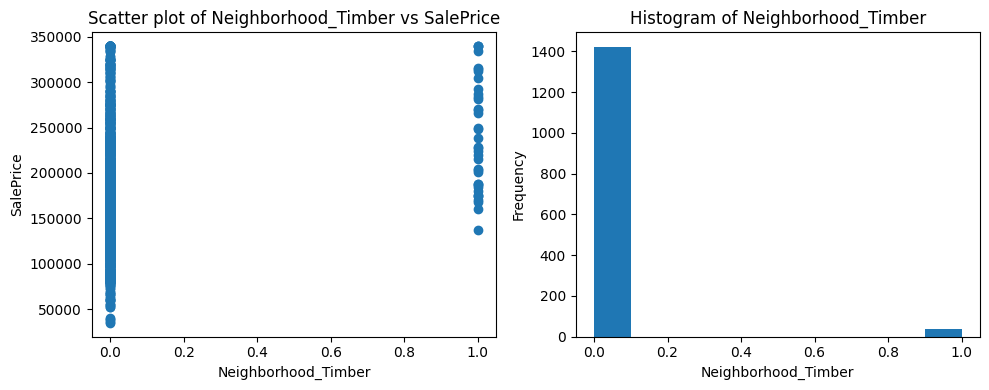

Pearson Correlation Neighborhood_Veenker: 0.07

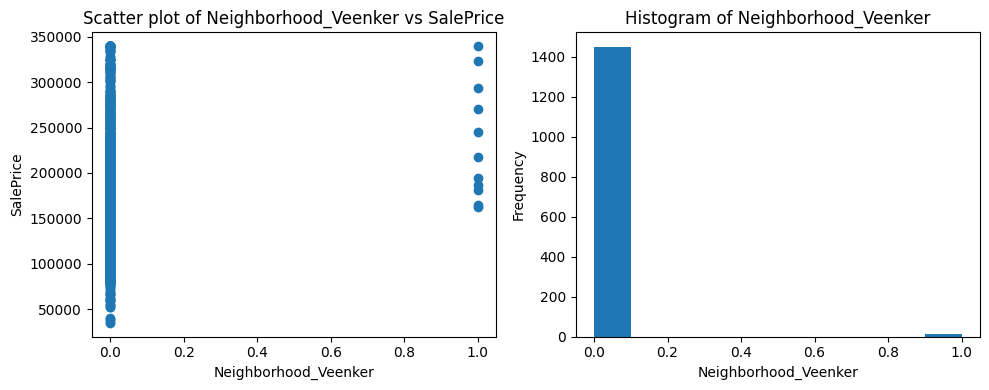

In [186]:
if __name__ == '__main__':
    source = load_data()
    #cleaned_data = clean_data(source)
    normalized_data = normalize_data(source)

    x = normalized_data.drop('SalePrice', axis=1)
    y = normalized_data['SalePrice']
    analyze_features(normalized_data)
    plot_data(x, y)


# Train / Test Preparation

### Now we want to create training and testing sets

In [78]:
def make_data_sets(source: pd.DataFrame) -> tuple:
    train_data, verification_data = train_test_split(source, test_size=0.2, random_state=0)

    y_train = train_data['SalePrice']
    x_train = train_data.drop('SalePrice', axis=1)

    y_verify = verification_data['SalePrice']
    x_verify = verification_data.drop('SalePrice', axis=1)

    return x_train, y_train, x_verify, y_verify


# Models

### Create / Train / Evaluate the models.
- DecisionTreeClassifier
- HistGradBoostingClassifier
- keras neural network

In [203]:
import pandas as pd
import tensorflow as tf
import xgboost as xgb
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam, SGD, RMSprop, Adagrad, Adadelta, Adamax, Nadam, Ftrl
from dataclasses import dataclass
from sklearn.dummy import DummyRegressor
from sklearn.metrics import mean_squared_error, root_mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, BaggingRegressor, ExtraTreesRegressor,\
    GradientBoostingRegressor, HistGradientBoostingRegressor, VotingRegressor

class candidate_model:
    prediction: pd.DataFrame
    rmse: float
    mse: float
    r2: float

    def __init__(self, name: str, model) -> None:
        self.name = name
        self.model = model
        
    def print_evaluation(self):
        print(f"RMSE: {self.rmse:.2e} - MSE: {self.mse:.2e} - R2: {self.r2:.2e} - {self.name}")
    

def make_models(num_features: int) -> tuple:
    
    models = []
    
    dl_model = keras.Sequential([
        layers.InputLayer(shape=(num_features,)),
        layers.Dense(32, activation='relu'),
        layers.Dense(64, activation='relu'),
        layers.Dense(128, activation='relu'),
        layers.Dense(1)
    ])
    dl_model.compile(optimizer=Adam(learning_rate=.001), loss='mse', metrics=['mse'] )
    models.append(candidate_model('DeepLearning', dl_model))
    
    xgb_regressor = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, alpha = 10, n_estimators = 10)
    models.append(candidate_model('XgbRegressor', xgb_regressor))
    
    # sklearn.dummy models
    models.append(candidate_model('DummyRegressor', DummyRegressor()))

    # sklearn.ensamble models
    models.append(candidate_model('AdaBoostRegressor', AdaBoostRegressor(random_state=1)))
    models.append(candidate_model('BaggingRegressor', BaggingRegressor(random_state=1)))
    models.append(candidate_model('ExtraTreesRegressor', ExtraTreesRegressor(random_state=1)))
    models.append(candidate_model('GradientBoostingRegressor', GradientBoostingRegressor(random_state=1)))
    models.append(candidate_model('HistGradientBoostingRegressor', HistGradientBoostingRegressor(random_state=1)))
    models.append(candidate_model('VotingRegressor', HistGradientBoostingRegressor(random_state=1)))

    models.append(candidate_model('DecisionTreeRegressor', DecisionTreeRegressor(random_state=1)))
    models.append(candidate_model('RandomForestRegressor', RandomForestRegressor(random_state=1)))
    
    
    return models

def fit_models(models: list, x_train: pd.DataFrame, y_train: pd.DataFrame) -> list:
    for candidate in models:
        model = candidate.model
        model.fit(x_train, y_train)
    return models

def predict(models: list, x_verify: pd.DataFrame) -> list:
    for candidate in models:
        model = candidate.model
        y_hat = model.predict(x_verify)
        candidate.prediction = y_hat
    return models

def evaluate_models(models: list, y_verify: pd.DataFrame) -> list:
    for candidate in models:
        rmse = root_mean_squared_error(y_verify, candidate.prediction)
        mse = mean_squared_error(y_verify, candidate.prediction)
        r2 = r2_score(y_verify, candidate.prediction)
        candidate.mse = mse
        candidate.rmse = rmse
        candidate.r2 = r2
    return models


In [190]:
def prediction(models: list, filename: str) -> None:
    source = pd.read_csv('./data/test.csv')
    normalized_data = normalize_data(source)
    
    # Assuming the list is called "my_list"
    candidate_model = next((model for model in models if model.name == "GradientBoostingRegressor"), None)
    model = candidate_model.model
    
    test_predictions = model.predict(normalized_data)
    print(test_predictions.shape)

    # Assuming test_data['id'] is your Pandas Series and test_predictions is your NumPy array
    result_df = pd.DataFrame({
        "ID": source['Id'],
        "SalePrice": test_predictions.flatten()
    })

    # Display the first few rows to verify
    print(result_df.head().transpose)
    result_df.to_csv(f'./data/{filename}', index=False)


# Main - Create / Train / Evaluate / Predict

In [204]:
def main():
    source = load_data()
    normalized_data = normalize_data(source)
    
    x_train, y_train, x_verify, y_verify = make_data_sets(normalized_data)
        
    print("Making models...")
    models = make_models(x_train.shape[1])
    
    print("Training models...")
    models = fit_models(models, x_train, y_train)
    
    print("Calulating predictions...")
    models = predict(models, x_verify)
    
    print("Evaluating models...")
    models = evaluate_models(models, y_verify)

    print("Results:")
    for candidate in sorted(models, key=lambda x: x.mse, reverse=False):
        candidate.print_evaluation()

    print ("Prediction:")
    prediction(models, 'submission_3.csv')

if __name__ == '__main__':
    main()    


Making models...

Training models...

37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 38999162880.0000 - mse: 38996828160.0000


Calulating predictions...

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


Evaluating models...

Results:

RMSE: 2.19e+04 - MSE: 4.81e+08 - R2: 9.04e-01 - GradientBoostingRegressor

RMSE: 2.36e+04 - MSE: 5.57e+08 - R2: 8.89e-01 - HistGradientBoostingRegressor

RMSE: 2.36e+04 - MSE: 5.57e+08 - R2: 8.89e-01 - VotingRegressor

RMSE: 2.43e+04 - MSE: 5.91e+08 - R2: 8.82e-01 - RandomForestRegressor

RMSE: 2.43e+04 - MSE: 5.92e+08 - R2: 8.82e-01 - ExtraTreesRegressor

RMSE: 2.50e+04 - MSE: 6.25e+08 - R2: 8.76e-01 - BaggingRegressor

RMSE: 2.86e+04 - MSE: 8.20e+08 - R2: 8.37e-01 - AdaBoostRegressor

RMSE: 3.25e+04 - MSE: 1.06e+09 - R2: 7.89e-01 - DecisionTreeRegressor

RMSE: 3.89e+04 - MSE: 1.51e+09 - R2: 6.99e-01 - XgbRegressor

RMSE: 7.09e+04 - MSE: 5.03e+09 - R2: -4.24e-05 - DummyRegressor

RMSE: 1.92e+05 - MSE: 3.68e+10 - R2: -6.32e+00 - DeepLearning

Prediction:

(1459,)

<bound method DataFrame.transpose of      ID      SalePrice
0  1461  154299.638258
1  1462  187215.211202
2  1463  217365.715108
3  1464  207893.604502
4  1465  213288.783487>